### Imports

In [40]:
import pandas as pd
import datetime
import os
import sys
import math
import matplotlib.pyplot as plt
import numpy as np
import warnings
from pandas.errors import SettingWithCopyWarning


warnings.simplefilter(action='ignore', category=SettingWithCopyWarning)

### Parameters

In [41]:
buy_threshold = 0
sell_threshold = 9
starting_balance = 100000

run_optimizing = True
google_colab = False

### Data loading

In [42]:
if google_colab:
    from google.colab import drive
    drive.mount('/content/drive')
    !pip install -U -q PyDrive
    from pydrive.auth import GoogleAuth
    from pydrive.drive import GoogleDrive
    from google.colab import auth
    from oauth2client.client import GoogleCredentials
    # Authenticate and create the PyDrive client.
    auth.authenticate_user()
    gauth = GoogleAuth()
    gauth.credentials = GoogleCredentials.get_application_default()
    drive = GoogleDrive(gauth)
    id = "1-kLmDPAmiTHNw_cv3lr6wY9DfSt8RSHv"
    downloaded = drive.CreateFile({'id':id}) 
    downloaded.GetContentFile('05-07_11-26.csv')  
    df = pd.read_csv('05-07_11-26.csv')
else:
    # Set the path to the root directory
    path = os.path.abspath(os.path.join(os.getcwd(), '../..'))
    # Read dataframes using Dask
    df = pd.read_csv(path + '/data/predictions/13_2.csv')

### Data processing

In [43]:
# Dates
df['Expiry_date'] = pd.to_datetime(df['Quote_date']) + pd.to_timedelta(df['TTM'], unit='D')
df['Quote_date'] = pd.to_datetime(df['Quote_date'])
df['Expiry_date'] = pd.to_datetime(df['Expiry_date'])

# Adding option ID
df["Option_ID"] = df["Expiry_date"].astype(str) + "-" + df["Strike"].astype(str)

# Dataframe for underlying matching in TTM = 0 rows
df_original = df[(df["Quote_date"] >= "2018-01-01") & (df["Quote_date"] <= "2019-01-01")]

# Period to be traded on
df = df[(df["Expiry_date"] >= "2018-01-01") & (df["Expiry_date"] <= "2018-01-29")]
df = df[(df["Quote_date"] >= "2018-01-01") & (df["Quote_date"] <= "2018-01-29")]

Adding TTM=0 row

In [44]:
# Sort the dataframe by Quote_date and Expiry_date
df = df.sort_values(['Quote_date', 'Expiry_date'])

groups = df.groupby(['Expiry_date', 'Strike'])

for _, group in groups:

    # Sort group so that the last row is the one with the lowest TTM
    group = group.sort_values('TTM', ascending=False)

    # Taking row from option group (could be any) to be used in getting the Strike price
    last_row = group.iloc[-1]
    
    expiry_date = last_row['Expiry_date']

    # Get the underlying price on the day of expiry
    underlying_last_on_expiry = df_original.loc[df_original['Quote_date'] == expiry_date, 'Underlying_last'].iloc[0]
    # Calculate the intrinsic value
    intrinsic_value = np.maximum(underlying_last_on_expiry - last_row['Strike'], 0)

    new_row = last_row.copy()
    new_row['Quote_date'] = expiry_date
    new_row['Expiry_date'] = expiry_date
    new_row['TTM'] = 0
    new_row['Underlying_last'] = underlying_last_on_expiry
    new_row['Price'] = intrinsic_value

    df = df.append(new_row, ignore_index=True)

# Sort the dataframe by Quote_date and Expiry_date
df = df.sort_values(['Quote_date', 'Expiry_date'])

/var/folders/wk/x86_p6511l95p594k6qnb98h0000gn/T/ipykernel_73552/2939185186.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_row, ignore_index=True)


### Functions

In [45]:
def generate_buy_sell_signals(df, buy_threshold, sell_threshold):
    buy_signal = (df['Prediction'] / df['Price']) >= buy_threshold
    sell_signal = (df['Price'] / df['Prediction']) >= sell_threshold
    return buy_signal, sell_signal


def trader(df, buy_signal, sell_signal, starting_balance, price_cap_lower, ttm_cap_lower):
    df = df.copy()
    # Filter out options that expire before the last quote date
    last_date = df['Quote_date'].max()
    df = df[df['Expiry_date'] <= last_date]

    df = df[df["TTM"] >= ttm_cap_lower]
    
    df['Signal'] = 0
    df.loc[buy_signal, 'Signal'] = 1
    df.loc[sell_signal, 'Signal'] = -1
    df['Position_this_opt'] = 0
    df['Balance'] = starting_balance  # Initialize Balance column with starting_balance
    df['Profit'] = 0

    quote_date_grouped = df.groupby('Quote_date')

    balance = starting_balance

    for quote_date, group in quote_date_grouped:
        group = group.sample(frac=1)

        for _, row in group.iterrows():
            # Don't consider options with a price lower than 3
            if row['Price'] < price_cap_lower:
                continue

            option_position = df.loc[(df['Option_ID'] == row['Option_ID']) & (df['Quote_date'] <= row['Quote_date']), 'Position_this_opt'].iloc[-1]

            # Buy the option
            if row['Signal'] == 1 and balance >= row['Price'] and row["Quote_date"] != row["Expiry_date"]:
                balance -= row['Price']
                option_position += 1
                # Directly update values in the original dataframe
                df.loc[(df['Option_ID'] == row['Option_ID']) & (df['Quote_date'] == row['Quote_date']), 'Position_this_opt'] = option_position
                df.loc[(df['Option_ID'] == row['Option_ID']) & (df['Quote_date'] == row['Quote_date']), 'Balance'] = balance

            # Sell the option
            elif row['Signal'] == -1 and row["Quote_date"] != row["Expiry_date"] and balance > 0:
                balance += row['Price']
                option_position -= 1
                # Directly update values in the original dataframe
                df.loc[(df['Option_ID'] == row['Option_ID']) & (df['Quote_date'] == row['Quote_date']), 'Position_this_opt'] = option_position
                df.loc[(df['Option_ID'] == row['Option_ID']) & (df['Quote_date'] == row['Quote_date']), 'Balance'] = balance

            # Option expires
            elif row["Quote_date"] == row["Expiry_date"] and option_position != 0:
                intrinsic_value = max(0, row['Underlying_last'] - row['Strike'])
                adjustment = intrinsic_value if option_position >= 1 else -intrinsic_value
                balance += adjustment * abs(option_position)
                option_position = 0
                # Directly update values in the original dataframe
                df.loc[(df['Option_ID'] == row['Option_ID']) & (df['Quote_date'] == row['Quote_date']), 'Position_this_opt'] = option_position
                df.loc[(df['Option_ID'] == row['Option_ID']) & (df['Quote_date'] == row['Quote_date']), 'Balance'] = balance

            df.loc[(df['Quote_date'] == quote_date) & (df['Position_this_opt'] == 0), 'Balance'] = balance
        
        # Print date and balance if quote_date is 1. january, 1. april, 1. july or 1. october
        if quote_date.day == 1 or quote_date.day == 15:
            print("On, {}, the balance is: {}".format(quote_date, balance))
    return df


def calculate_options_value(df):
    df['Options_value'] = 0
    # Iterate over every Quote_date
    for date in df['Quote_date'].unique():
        # For every Quote date, multiply each row's Position_this_opt with the Price and sum it up.
        options_value_sum = (df.loc[df['Quote_date'] == date, 'Position_this_opt'] * df.loc[df['Quote_date'] == date, 'Price']).sum()
        # The result should be added to every row with the same Quote_date in the Options_value
        df.loc[df['Quote_date'] == date, 'Options_value'] = options_value_sum
    df['Total_value'] = df['Balance'] + df['Options_value']
    return df

### Run code

In [46]:
def print_results(df, starting_balance):
    print("Starting balance", starting_balance)
    print("Ending balance", df['Balance'].iloc[-1])
    print("Number of trades", df['Signal'].abs().sum())
    profit = df['Balance'].iloc[-1] - starting_balance
    print("Profit", profit)
    print("Profit per trade", profit / df['Signal'].abs().sum())
    print("Profit per day", profit / (df['Quote_date'].max() - df['Quote_date'].min()).days)
    num_days = (df['Quote_date'].max() - df['Quote_date'].min()).days
    print("Number of days", num_days)
    print("Sharpe ratio: ", sharpe_ratio(df))

In [47]:
def sharpe_ratio(df):
    df = df.copy()
    # Group by Quote_date and keep the last row of each group
    df = df.groupby('Quote_date').last()
    # Calculate daily returns
    df['Daily_Returns'] = df['Total_value'].pct_change()
    # Convert the annual risk-free rate to a daily rate
    df['Daily_Rf'] = (1 + df['R'])**(1/252) - 1
    # Calculate the excess returns
    excess_returns = df['Daily_Returns'] - df['Daily_Rf']
    # Calculate sharpe ratio
    sharpe_ratio = np.sqrt(252) * (excess_returns.mean() / excess_returns.std())
    return sharpe_ratio

In [ ]:
def sharpe_ratio2(df, rf=0.02):
    df = df.copy()

    # Calculate daily returns
    df['Daily_Returns'] = df['Total_value'].pct_change()

    starting_balance = df['Balance'].iloc[0]
    ending_balance = df['Balance'].iloc[-1]

    num_days = (df['Quote_date'].max() - df['Quote_date'].min()).days

    avg_daily_return = (ending_balance / starting_balance)**(1/num_days) - 1

    avg_daily_return_excess = avg_daily_return - rf / 252

    df["Excess_Returns"] = df["Daily_Returns"] - rf / 252

    std_daily_excess_return = df["Excess_Returns"].std()

    sharpe_ratio = np.sqrt(252) * (avg_daily_return_excess / std_daily_excess_return)

    return sharpe_ratio

In [48]:
if run_optimizing == False:
    df = df.copy()
    buy_signal, sell_signal = generate_buy_sell_signals(df, buy_threshold, sell_threshold)
    df = trader(df, buy_signal, sell_signal, starting_balance)
    df = calculate_options_value(df)
    print_results(df, starting_balance)

### Analysis

In [49]:
def plot(df):
    # Just keep one row per Quote_date, and that should be the last row
    df = df.groupby('Quote_date').last()
    plt.plot(df['Total_value'], label='Total value')
    plt.plot(df['Balance'], label='Balance')
    plt.plot(df['Options_value'], label='Options value')
    plt.title('Portfolio value over time')
    # Make plot smaller
    ax = plt.gca()
    plt.xticks(rotation=45)
    plt.legend()
    plt.show()

In [50]:
if run_optimizing == False:
    plot(df)

### Finding best thresholds

In [53]:
if run_optimizing:
    # Initialize wandb
    !pip install wandb
    import wandb
    wandb.login(key="b47bcf387a0571c5520c58a13be35cda8ada0a99")

    # Define the hyperparameters
    sweep_config = {
    'method': 'grid',
    'name': 'January 2018 - Percent threshold 2',
    'metric': {
        'goal': 'maximize', 
        'name': 'sharpe_ratio'
        },
    'parameters': {
        'buy_threshold': {
            'values': [1.01, 1.02, 1.04, 1.06, 1.1]},
        'sell_threshold': {
            'values': [1.01, 1.02, 1.04, 1.06, 1.1]},
        'starting_balance': {
            'values': [100000, 1000000]},
        'price_cap_lower': {
            'values': [0, 1, 3, 5]},
        'ttm_cap_lower': {
            'values': [0, 1, 3, 5]},
        }
    }
    sweep_id = wandb.sweep(sweep=sweep_config, project='options-trading') 


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/hjalmarjacobvinje/.netrc


Create sweep with ID: hbg6sm0p
Sweep URL: https://wandb.ai/avogadro/options-trading/sweeps/hbg6sm0p


wandb: Agent Starting Run: 2auft10h with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 404836.8900000038
Number of trades 13852
sharpe_ratio -3.7605489348612164


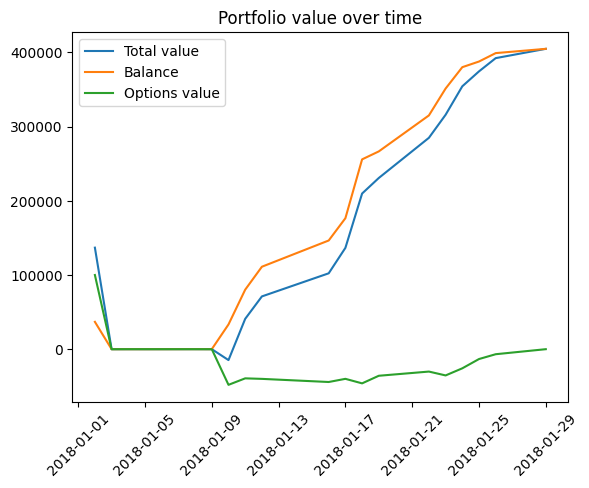

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,-3.76055


wandb: Agent Starting Run: 1lx49fk1 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 398931.44000000274
Number of trades 12495
sharpe_ratio -3.8319941532480404


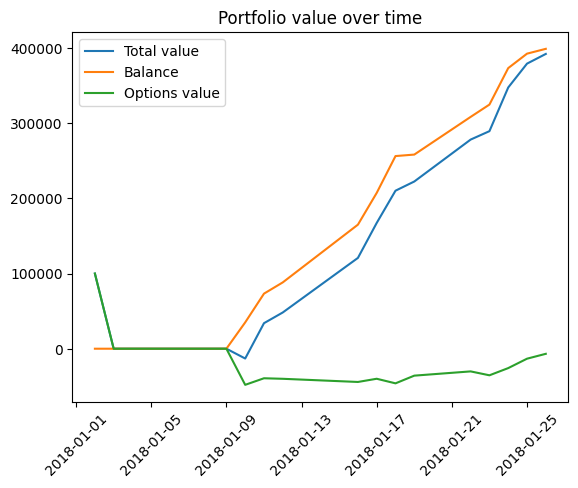

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,-3.83199


wandb: Agent Starting Run: co479f20 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 317521.61500000034
Number of trades 11187
sharpe_ratio -3.837956552540525


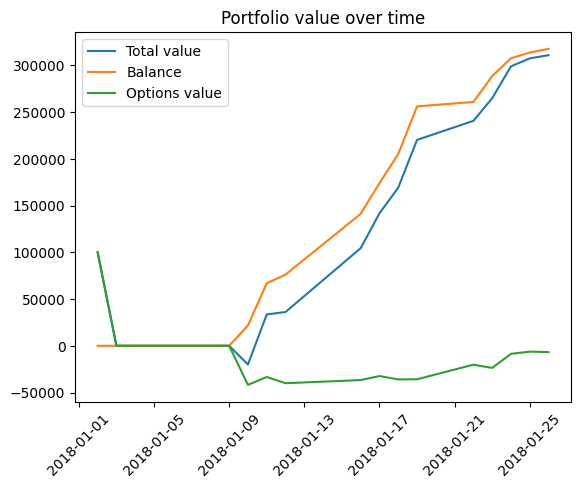

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,-3.83796


wandb: Agent Starting Run: wu2ot4hg with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 254930.49999999945
Number of trades 9873
sharpe_ratio -4.098762464791151


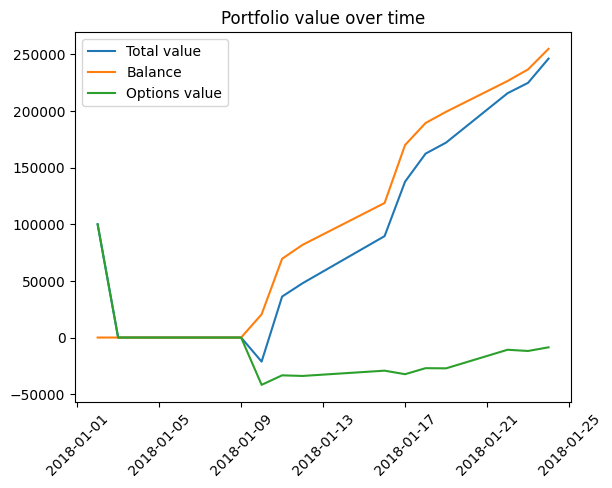

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,-4.09876


wandb: Agent Starting Run: jm0uwx52 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 404816.8150000146
Number of trades 13852
sharpe_ratio -3.710584939902662


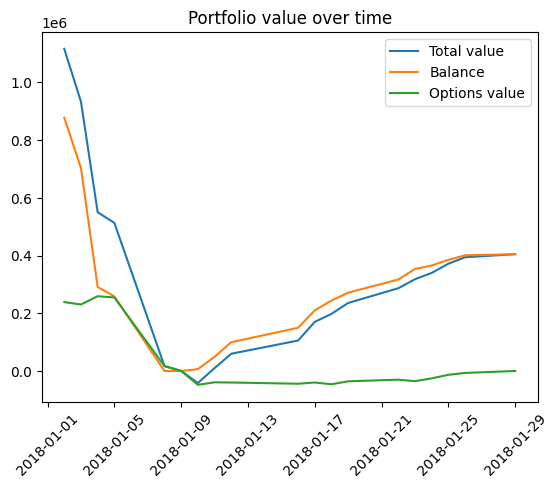

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,-3.71058


wandb: Agent Starting Run: 701u79ih with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 399004.36500001285
Number of trades 12495
sharpe_ratio 3.84217082396557


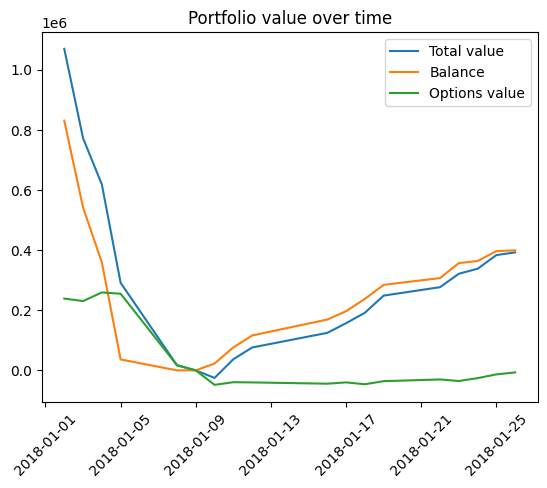

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.84217


wandb: Agent Starting Run: 40sxeqvi with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 314751.29000000824
Number of trades 11187
sharpe_ratio -3.8556197718461025


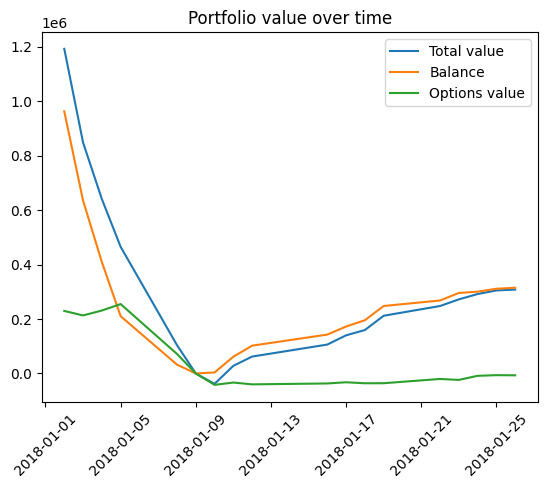

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,-3.85562


wandb: Agent Starting Run: t51yrv7x with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 249936.64000000767
Number of trades 9873
sharpe_ratio 4.092214139025774


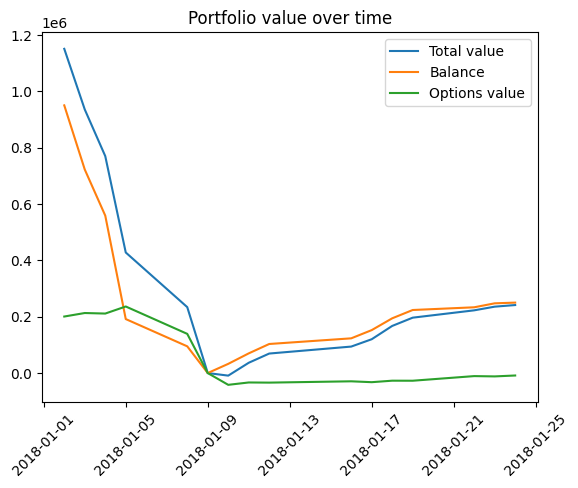

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,4.09221


wandb: Agent Starting Run: n4dw90r1 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 253732.46499999805
Number of trades 13051
sharpe_ratio 3.740308511894905


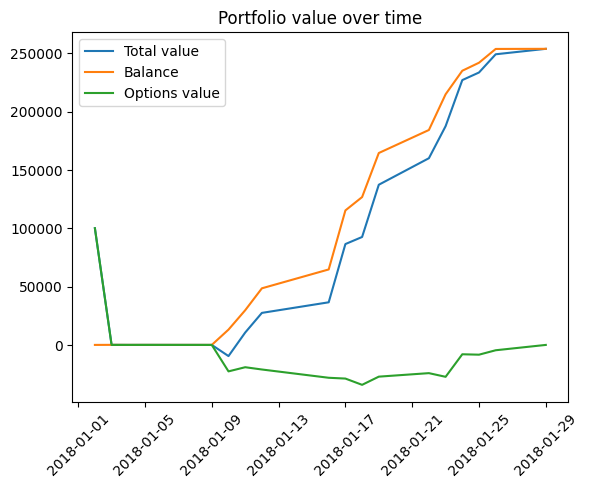

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.74031


wandb: Agent Starting Run: vict4frg with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 251169.81499999817
Number of trades 11817
sharpe_ratio -4.2186844603627875


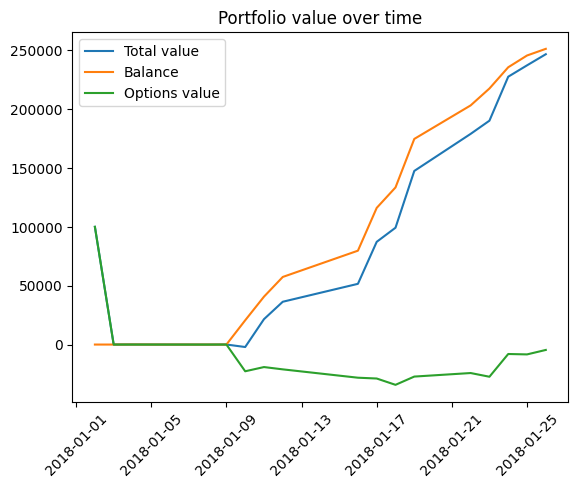

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,-4.21868


wandb: Agent Starting Run: zrflvt10 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 201780.22999999914
Number of trades 10628
sharpe_ratio -3.8093150775936024


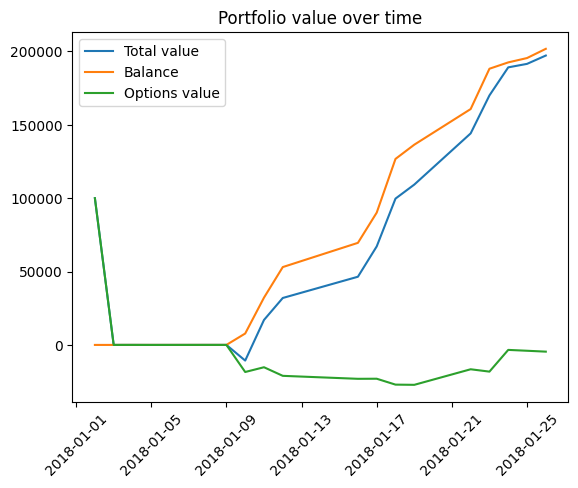

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,-3.80932


wandb: Agent Starting Run: 8astcsqn with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 152691.48999999982
Number of trades 9395
sharpe_ratio -4.081433464295759


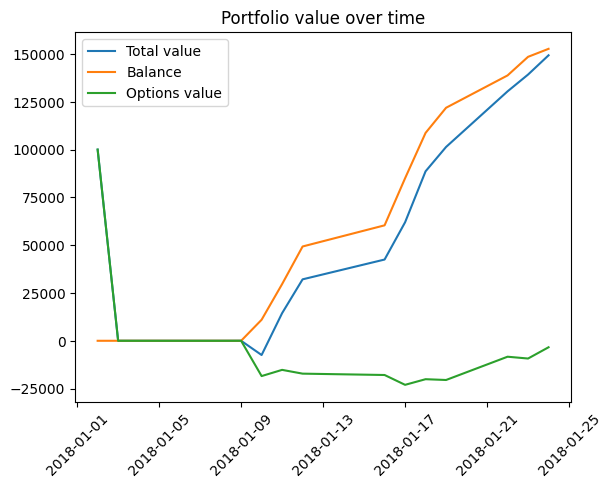

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,-4.08143


wandb: Agent Starting Run: 89zohom9 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 253734.29500000837
Number of trades 13051
sharpe_ratio -3.7967435456513208


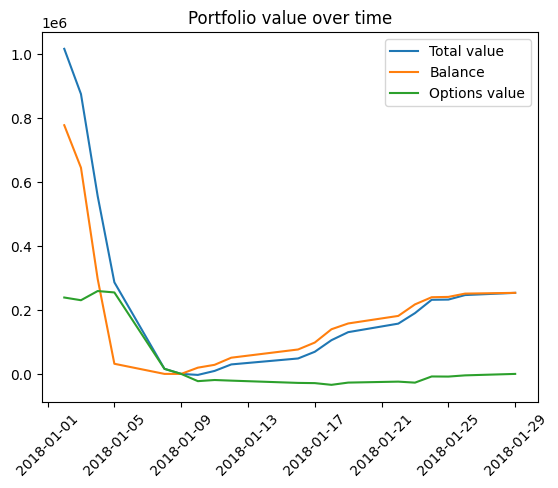

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,-3.79674


wandb: Agent Starting Run: 36lg1bcw with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 250175.56000000882
Number of trades 11817
sharpe_ratio -3.8615210105351188


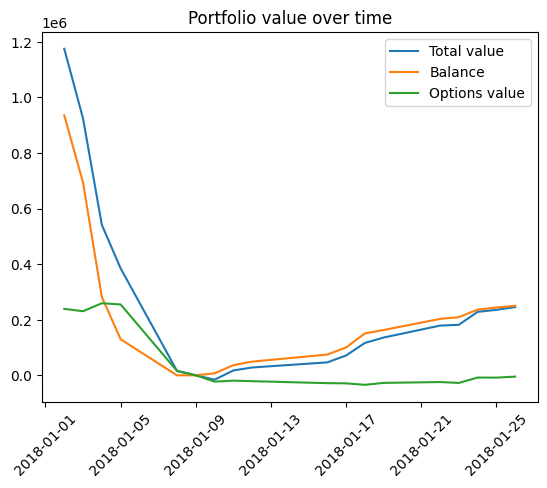

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,-3.86152


wandb: Agent Starting Run: e8icfzkr with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 199644.66000000722
Number of trades 10628
sharpe_ratio 3.850387039013952


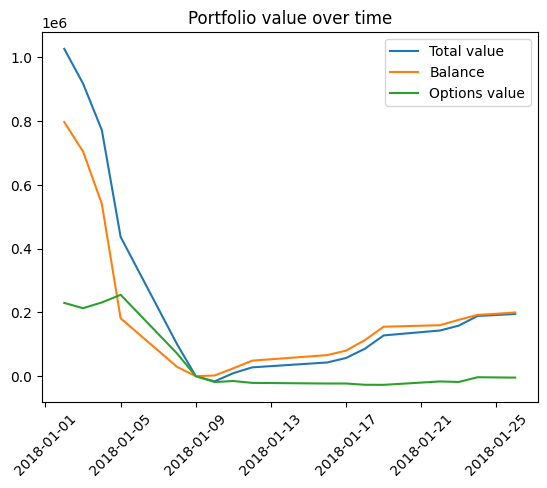

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.85039


wandb: Agent Starting Run: jliscju1 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 151519.75500000926
Number of trades 9395
sharpe_ratio 4.101064070773529


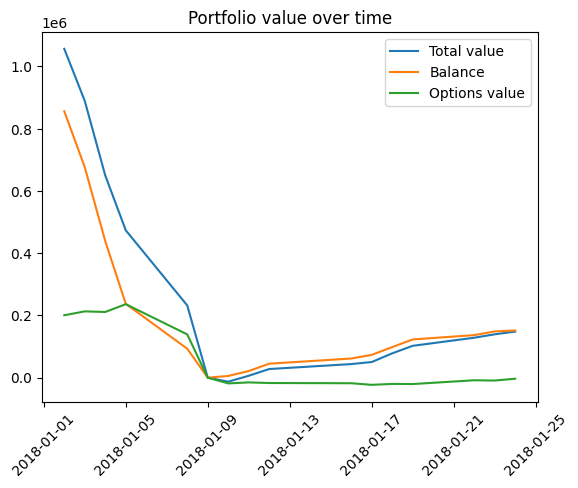

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,4.10106


wandb: Agent Starting Run: mmihm18e with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 122442.94499999937
Number of trades 12070
sharpe_ratio -3.6862348149657747


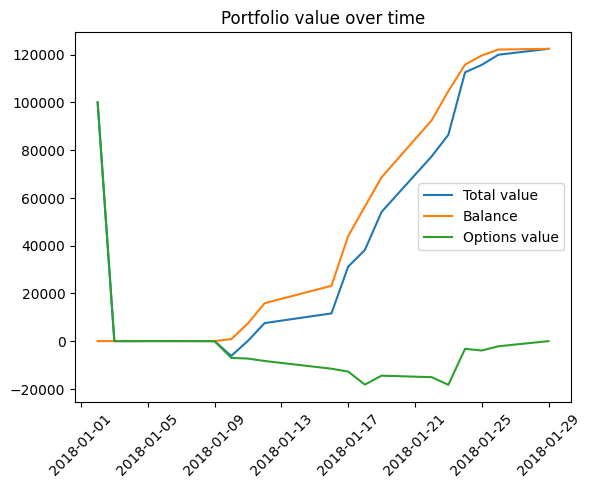

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,-3.68623


wandb: Agent Starting Run: zmz0gbnf with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 120360.82499999949
Number of trades 11029
sharpe_ratio -4.689473383684757


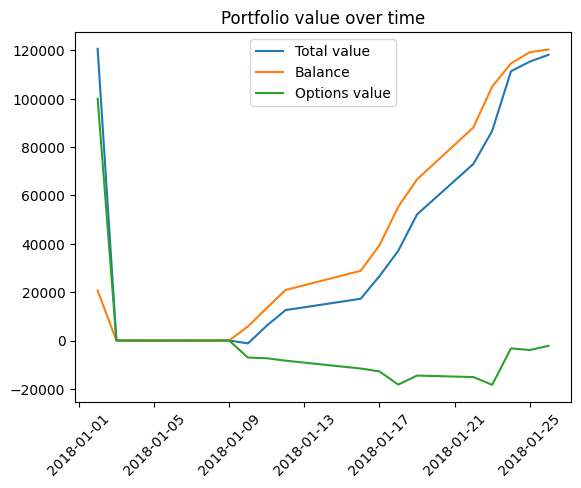

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,-4.68947


wandb: Agent Starting Run: dsfxj772 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 95066.80999999988
Number of trades 9990
sharpe_ratio 3.8253525467018017


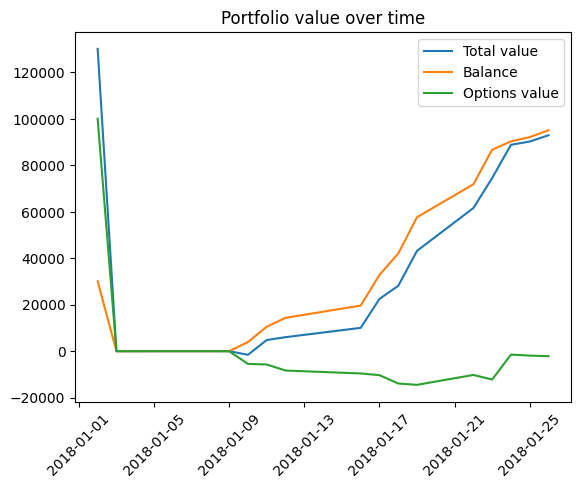

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.82535


wandb: Agent Starting Run: lww4471z with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 69090.59000000017
Number of trades 8874
sharpe_ratio -5.8517342498838145


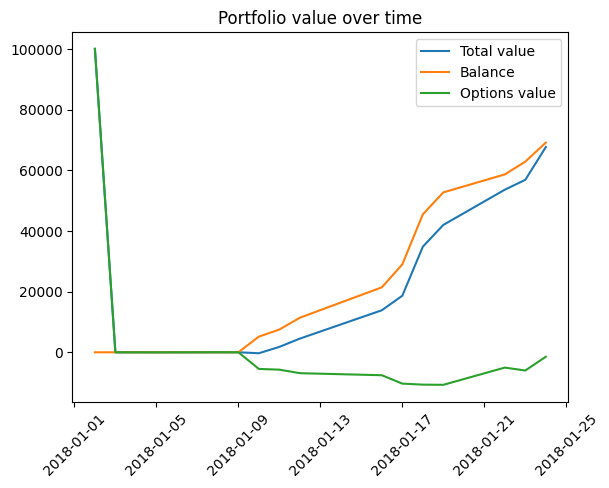

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,-5.85173


wandb: Agent Starting Run: 219m4v6r with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 122448.12500000998
Number of trades 12070
sharpe_ratio -3.7558882881048934


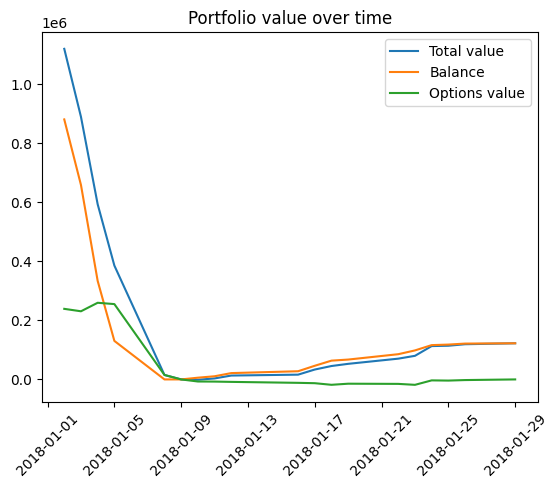

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,-3.75589


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: vszn6gr3 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 122012.44000001042
Number of trades 11029
sharpe_ratio -3.8614741553454213


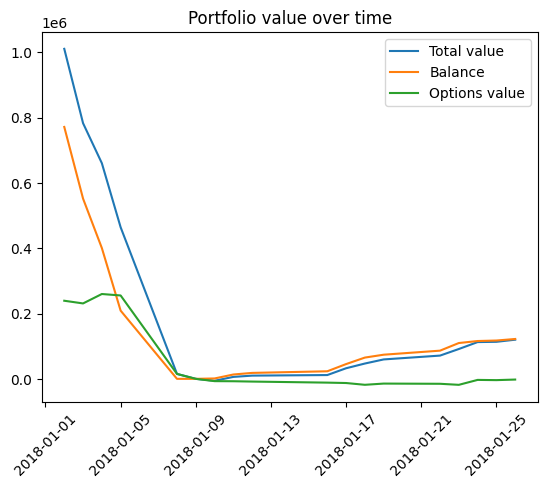

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,-3.86147


wandb: Agent Starting Run: mus897i6 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 95461.14000000917
Number of trades 9990
sharpe_ratio 3.816016748141022


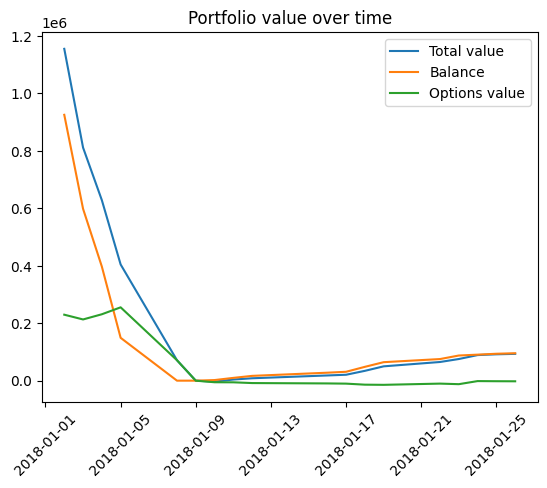

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.81602


wandb: Agent Starting Run: mfpp5cmb with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 69592.6550000081
Number of trades 8874
sharpe_ratio -4.081205735754824


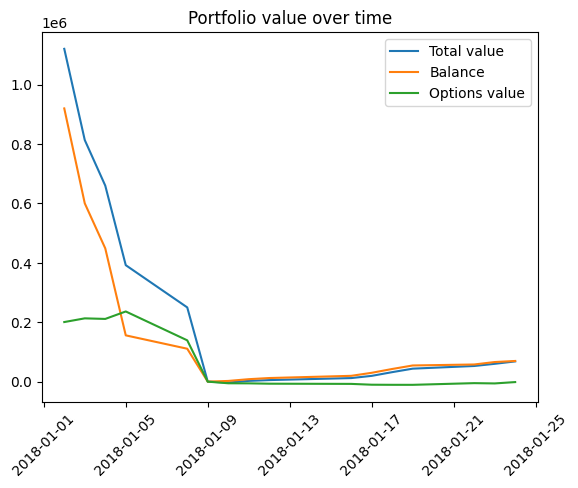

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,-4.08121


wandb: Agent Starting Run: z7pg4wz0 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 69237.90000000023
Number of trades 11525
sharpe_ratio 4.2215753644412075


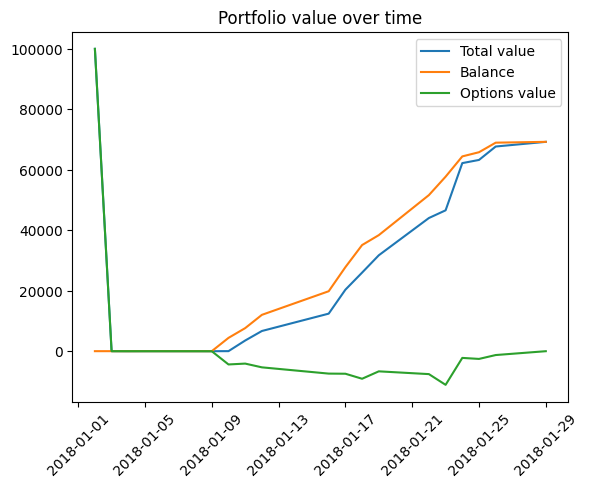

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,4.22158


wandb: Agent Starting Run: cwohho0u with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 68843.82000000023
Number of trades 10627
sharpe_ratio -3.066051366874905


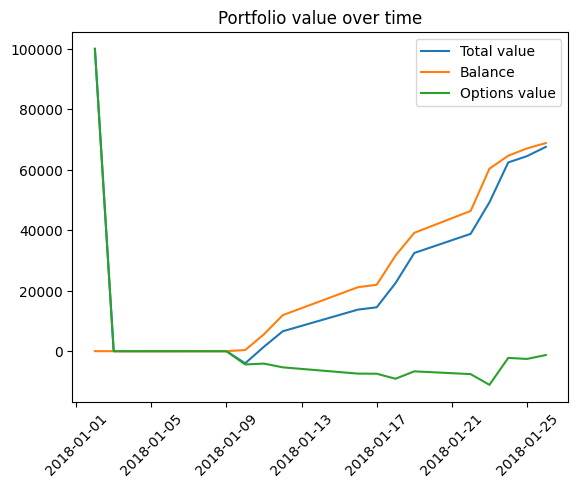

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,-3.06605


wandb: Agent Starting Run: kvy7h5l6 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 52644.545000000224
Number of trades 9663
sharpe_ratio -3.111337062241911


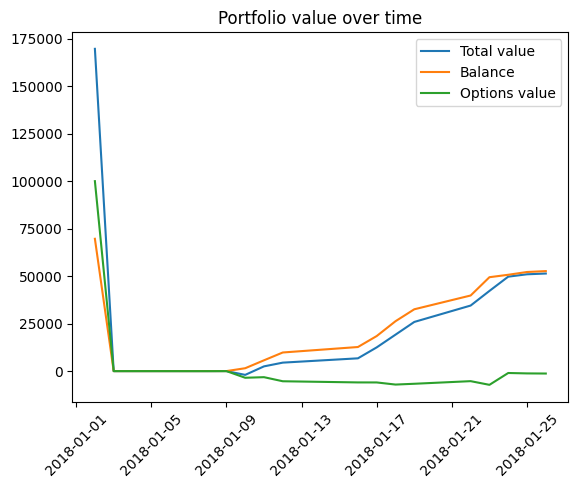

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,-3.11134


wandb: Agent Starting Run: mjr1r3bx with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 38664.48000000008
Number of trades 8622
sharpe_ratio -3.9123248870277103


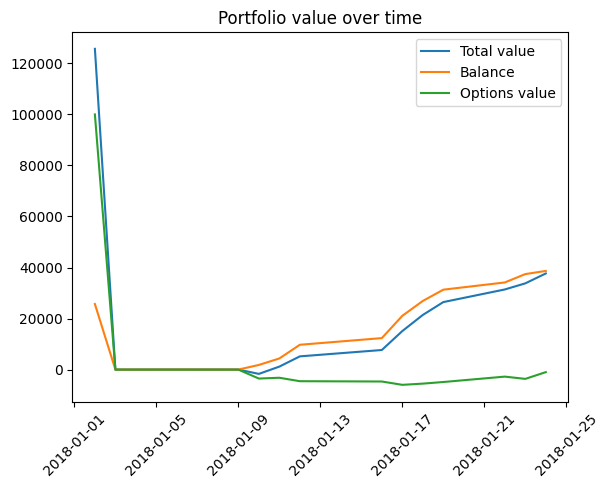

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,-3.91232


wandb: Agent Starting Run: yh6aaaoe with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 69230.83000001067
Number of trades 11525
sharpe_ratio -3.769978814238084


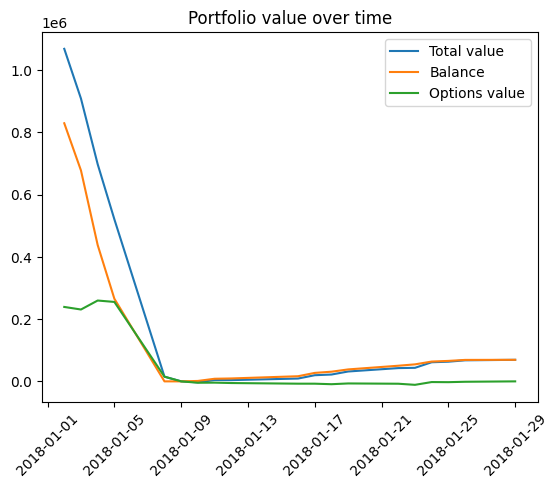

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,-3.76998


wandb: Agent Starting Run: q2q3u6n6 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 68244.60000001088
Number of trades 10627
sharpe_ratio 3.900490215483474


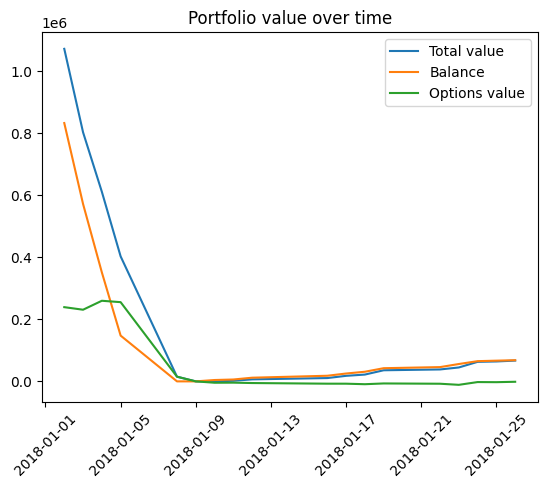

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.90049


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 9983toz3 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 53566.19500000936
Number of trades 9663
sharpe_ratio -3.891122731451095


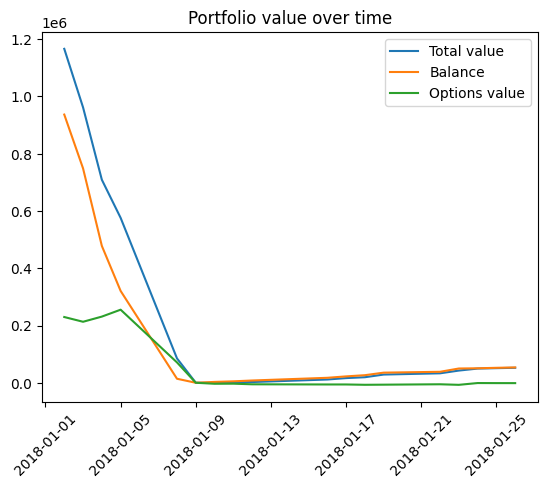

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,-3.89112


wandb: Agent Starting Run: 3e4rvyq2 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 39231.59500000757
Number of trades 8622
sharpe_ratio 4.0975823879081075


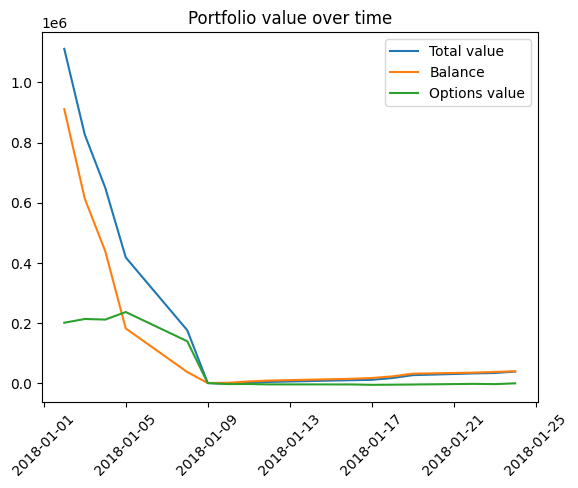

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,4.09758


wandb: Agent Starting Run: f7n6o48i with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 34580.81500000019
Number of trades 10934
sharpe_ratio 3.2709899296449576


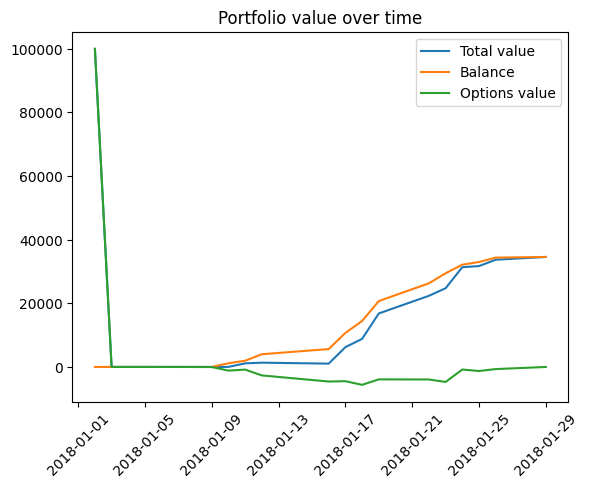

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,3.27099


wandb: Agent Starting Run: hnzxtz4y with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 34582.710000000196
Number of trades 10227
sharpe_ratio 3.6280847310839888


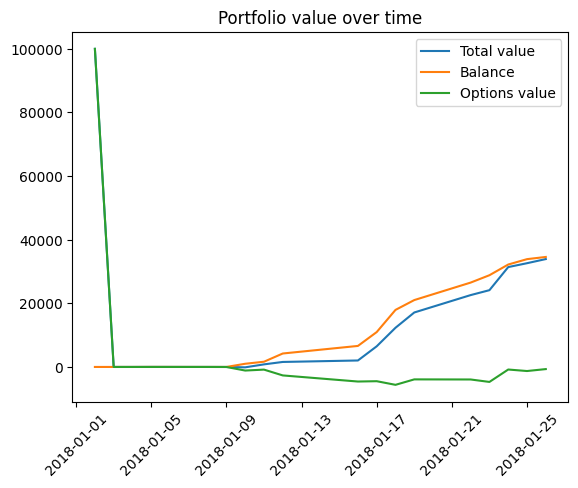

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,3.62808


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: skmsns2e with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 26164.985000000037
Number of trades 9332
sharpe_ratio -2.658319765295689


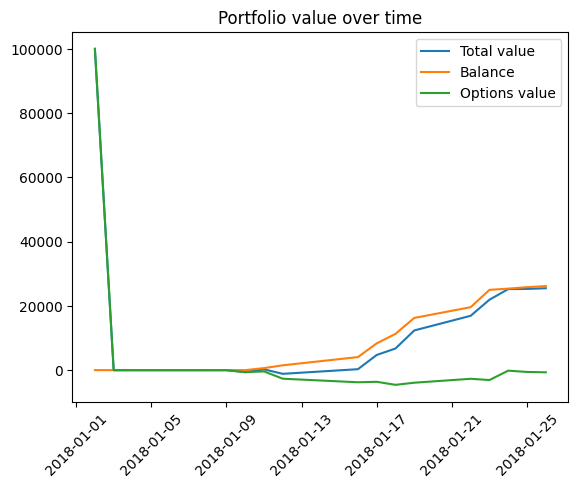

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,-2.65832


wandb: Agent Starting Run: fmmqvq5v with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 19209.214999999993
Number of trades 8348
sharpe_ratio -9.357111337046268


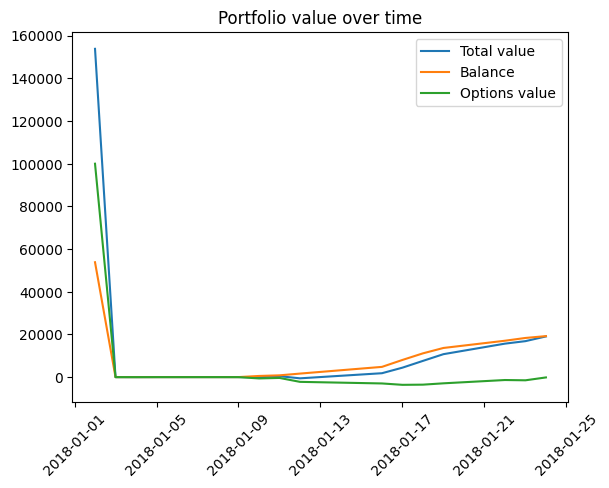

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,-9.35711


wandb: Agent Starting Run: kypfglcu with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 34564.52000001076
Number of trades 10934
sharpe_ratio -3.709428894066358


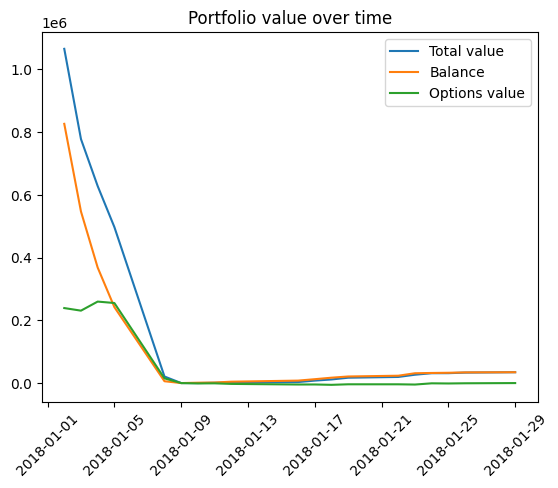

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,-3.70943


wandb: Agent Starting Run: uslt4phl with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 34558.090000011056
Number of trades 10227
sharpe_ratio -3.1367382363493803


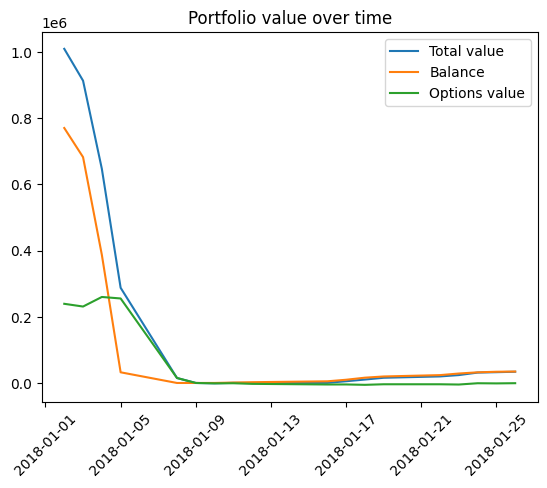

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,-3.13674


wandb: Agent Starting Run: v60d5dtw with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 26439.795000008813
Number of trades 9332
sharpe_ratio -5.159390445237635


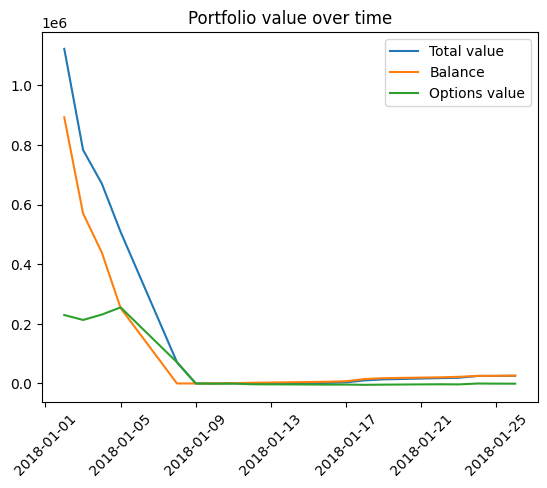

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,-5.15939


wandb: Agent Starting Run: ftwqlioq with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 19183.490000008253
Number of trades 8348
sharpe_ratio 4.106237067152648


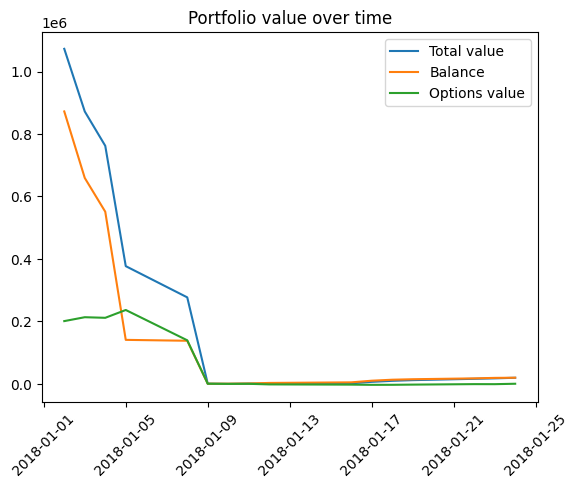

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,4.10624


wandb: Agent Starting Run: 05ejd04s with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 404589.2200000003
Number of trades 13852
sharpe_ratio 3.767551988278658


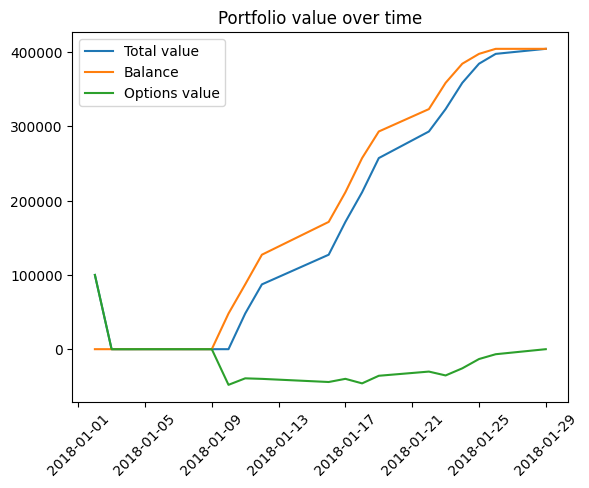

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.76755


wandb: Agent Starting Run: h28ebzwi with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 404580.0650000005
Number of trades 12495
sharpe_ratio 3.852803386595369


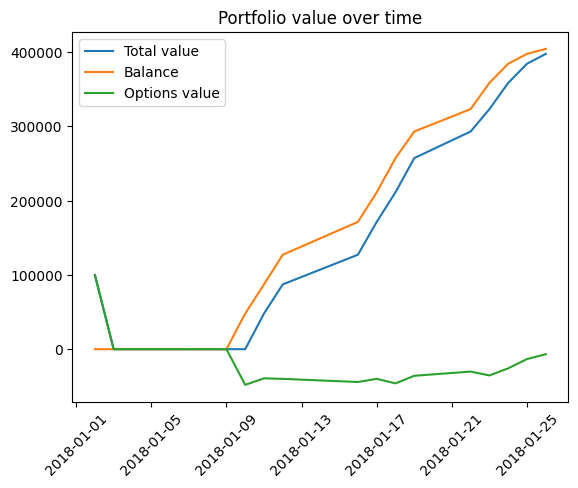

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.8528


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 6u7ann2f with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 321281.73000000033
Number of trades 11187
sharpe_ratio 3.8559462649267187


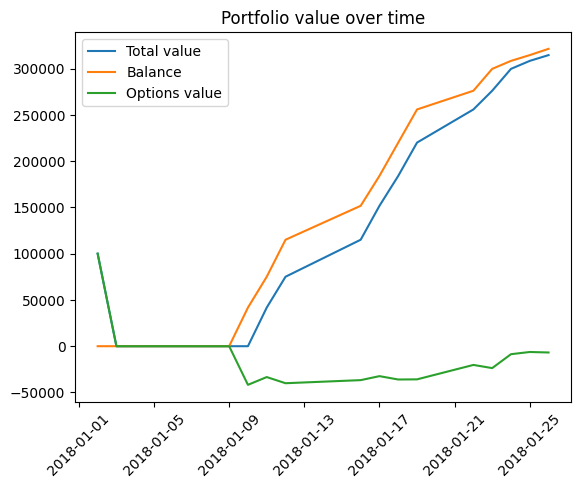

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.85595


wandb: Agent Starting Run: 8jbjkc4p with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 255953.28000000014
Number of trades 9873
sharpe_ratio 4.107033261663746


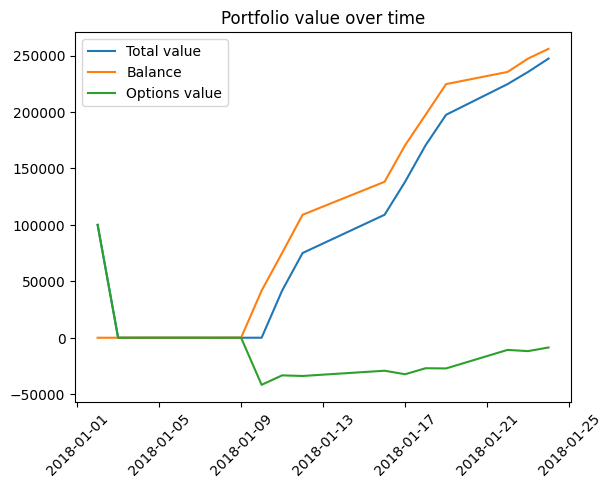

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,4.10703


wandb: Agent Starting Run: u6kcdzs0 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 404596.3450000012
Number of trades 13852
sharpe_ratio 3.7454114932122873


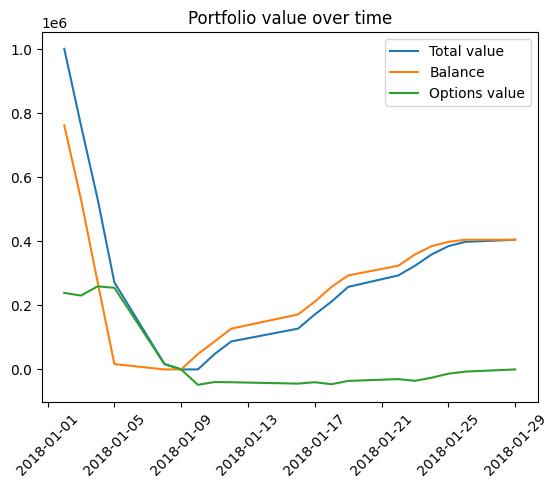

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.74541


wandb: Agent Starting Run: 7b3q2s9h with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 404580.94000000105
Number of trades 12495
sharpe_ratio 3.849681861466621


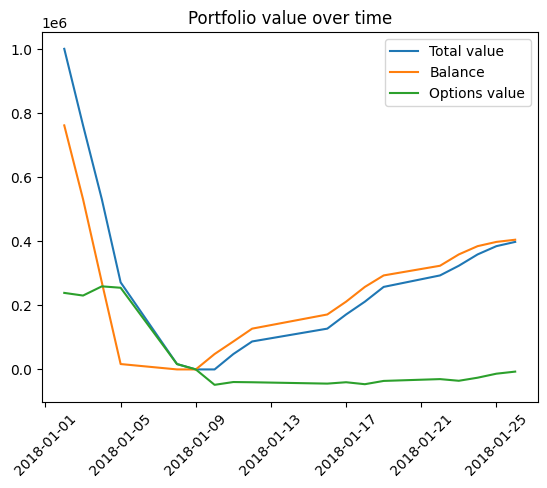

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.84968


wandb: Agent Starting Run: ojj5qrta with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 321296.24499999965
Number of trades 11187
sharpe_ratio 3.8501485981089645


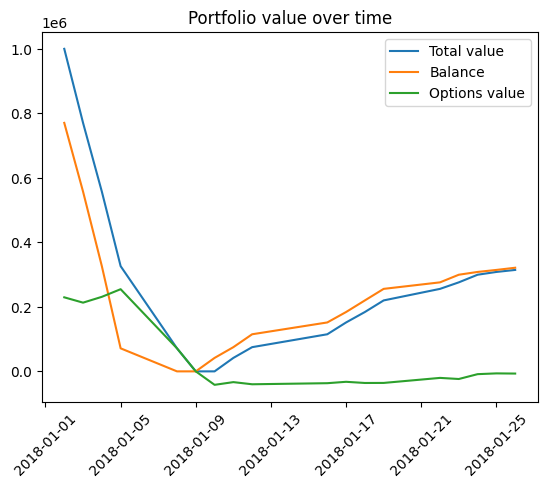

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.85015


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 62ct1gji with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 255947.255
Number of trades 9873
sharpe_ratio 4.09841984901777


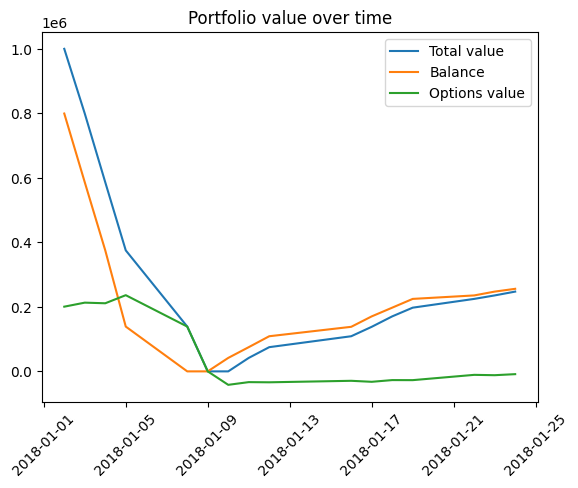

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,4.09842


wandb: Agent Starting Run: oew0o5jw with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 253474.24999999988
Number of trades 13051
sharpe_ratio 3.77834647845596


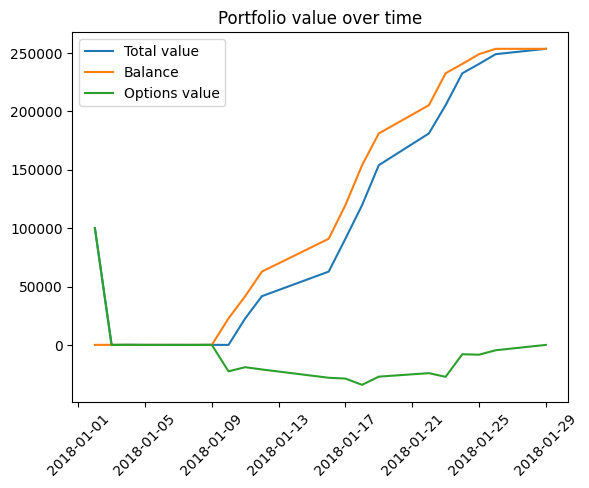

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.77835


wandb: Agent Starting Run: odom72j6 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 253482.5599999996
Number of trades 11817
sharpe_ratio 3.8653542029472687


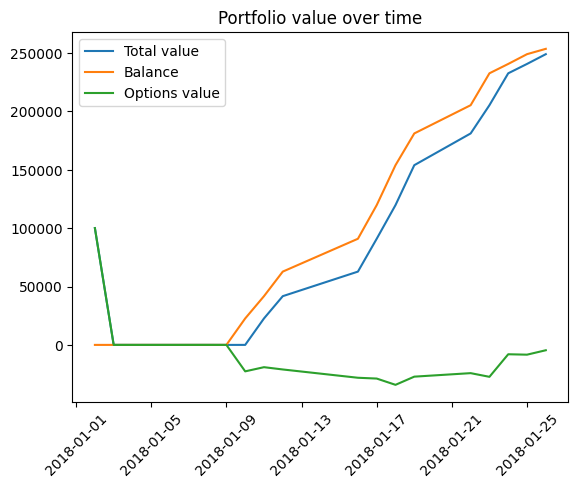

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.86535


wandb: Agent Starting Run: 0fnlxnen with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 201589.35500000004
Number of trades 10628
sharpe_ratio 4.041997393721179


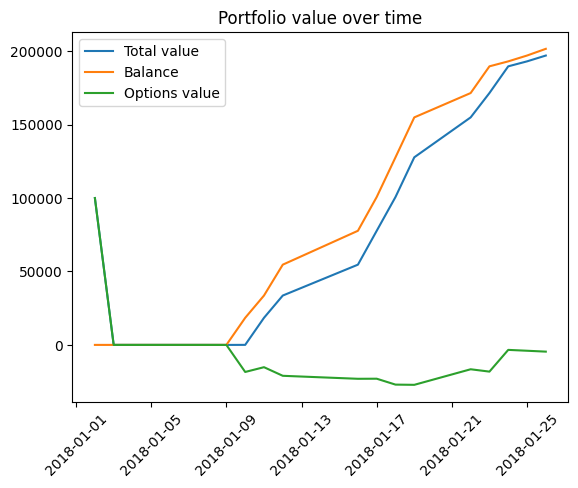

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,4.042


wandb: Agent Starting Run: ukjz1so7 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 153124.6199999999
Number of trades 9395
sharpe_ratio 4.101523257003802


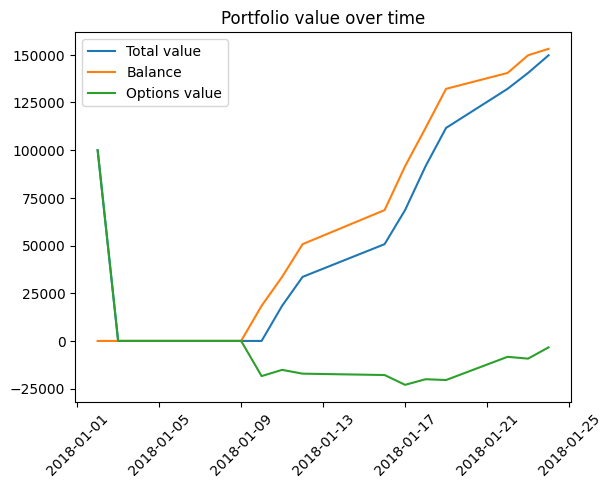

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,4.10152


wandb: Agent Starting Run: zdv5o9ow with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 253557.44500000039
Number of trades 13051
sharpe_ratio 3.755340661145462


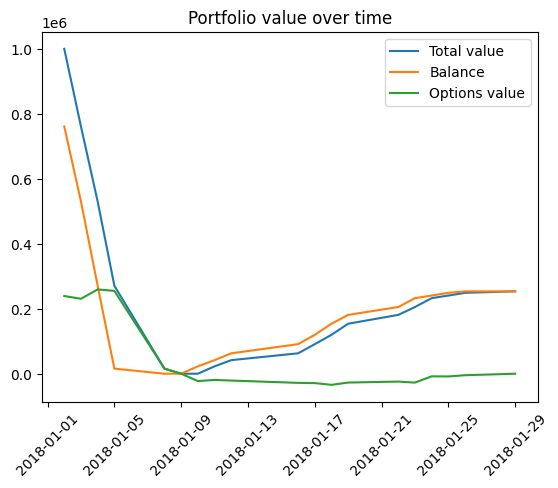

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.75534


wandb: Agent Starting Run: 3v8x8e0x with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 253487.5849999998
Number of trades 11817
sharpe_ratio 3.858868250663762


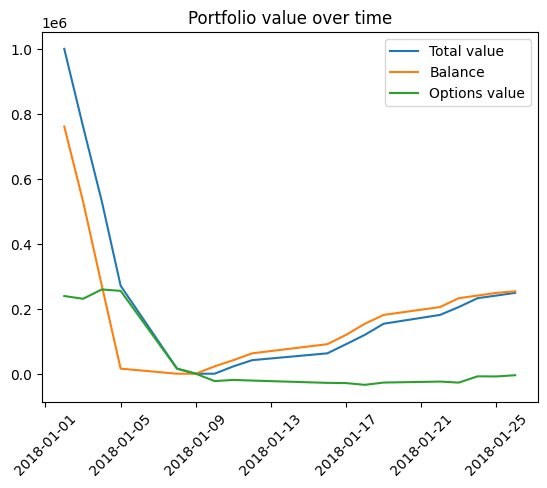

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.85887


wandb: Agent Starting Run: zahim9vz with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 201562.60499999998
Number of trades 10628
sharpe_ratio 3.850048691722307


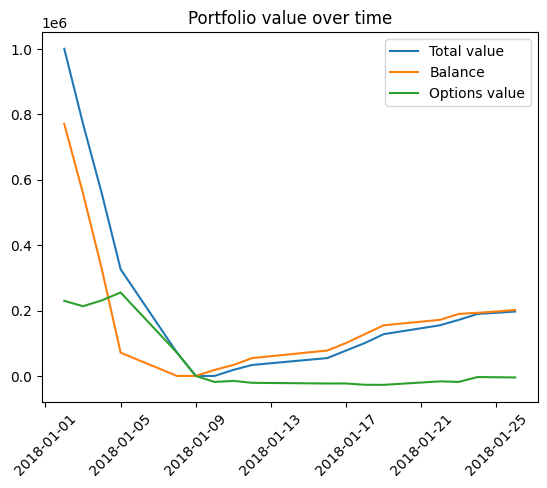

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.85005


wandb: Agent Starting Run: k30kqbva with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 153125.54999999914
Number of trades 9395
sharpe_ratio 4.098323812287997


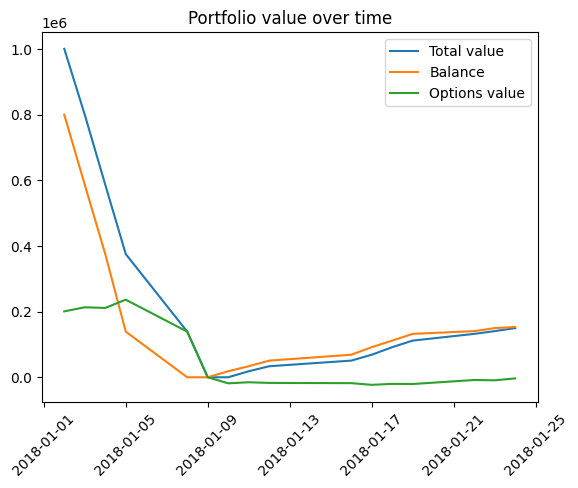

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,4.09832


wandb: Agent Starting Run: ww1hrglg with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 122220.65999999995
Number of trades 12070
sharpe_ratio 3.9430091186005325


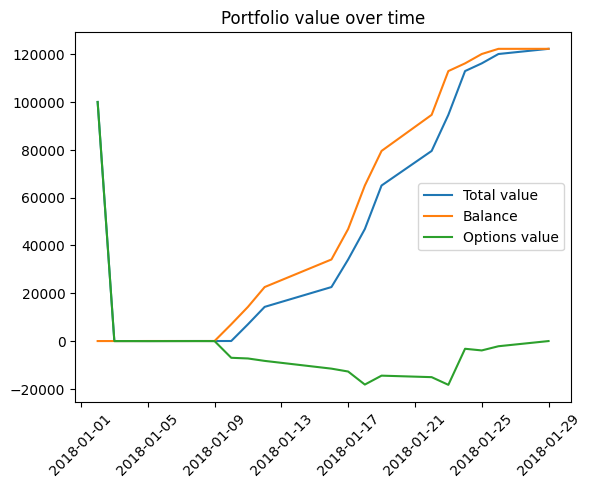

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.94301


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: v1uf5t0j with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 122204.89999999994
Number of trades 11029
sharpe_ratio 3.8828875599388915


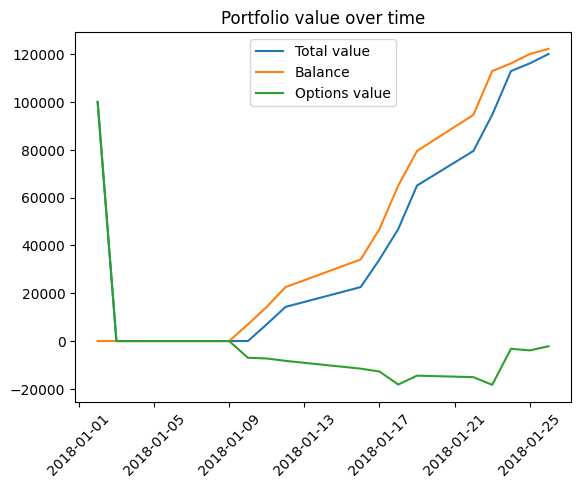

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.88289


wandb: Agent Starting Run: mn8buv18 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 95565.13500000008
Number of trades 9990
sharpe_ratio 4.619318692634124


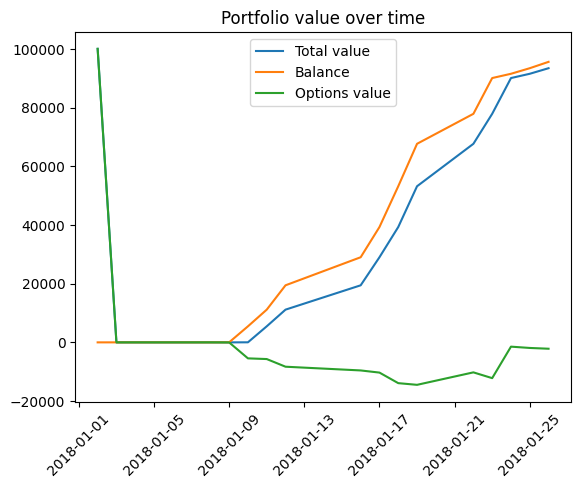

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,4.61932


wandb: Agent Starting Run: 0ryvnxna with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 69648.64000000006
Number of trades 8874
sharpe_ratio 4.432328543947016


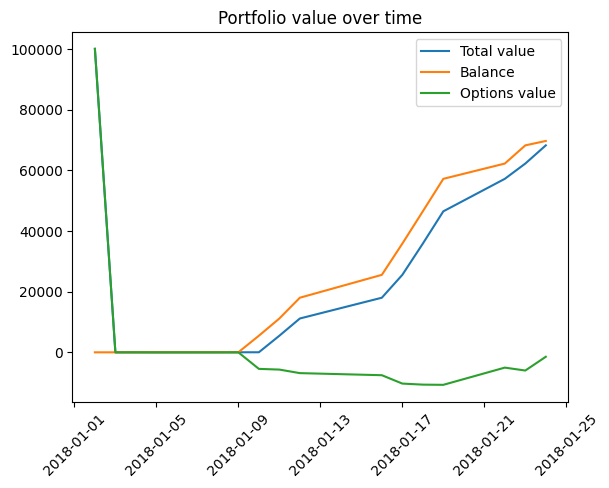

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,4.43233


wandb: Agent Starting Run: ys8zjp26 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 122197.85500000067
Number of trades 12070
sharpe_ratio 3.7427240220996136


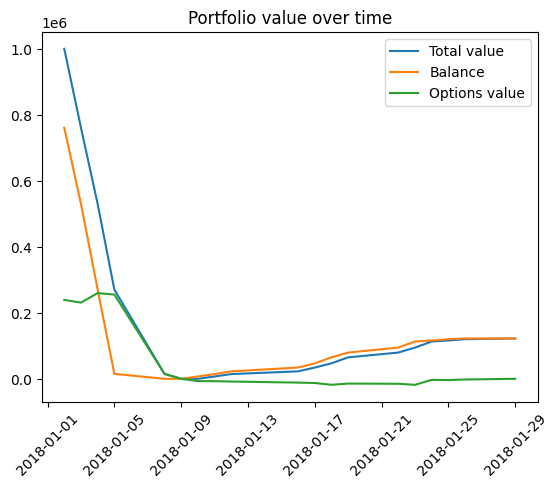

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.74272


wandb: Agent Starting Run: kyyl4gsc with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 122206.79000000031
Number of trades 11029
sharpe_ratio 3.85876848327254


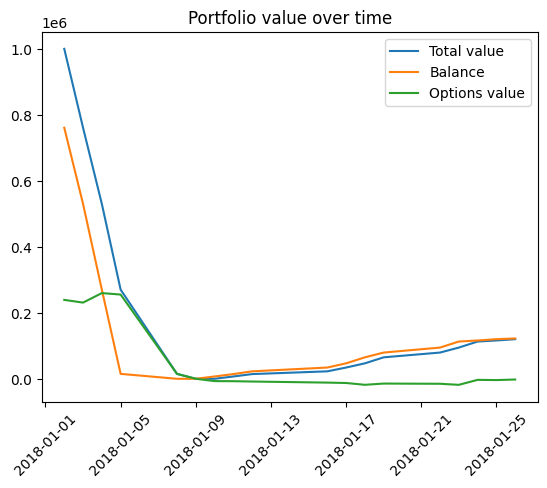

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.85877


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 577pygeu with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 95553.82999999993
Number of trades 9990
sharpe_ratio 3.8539478498258792


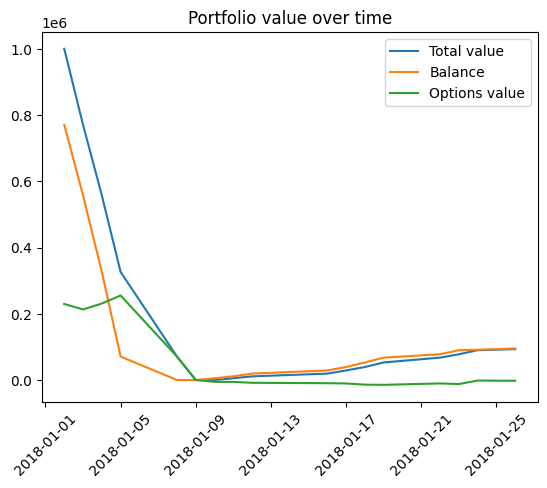

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.85395


wandb: Agent Starting Run: svh6ih3r with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 69637.41999999998
Number of trades 8874
sharpe_ratio 4.104640039910897


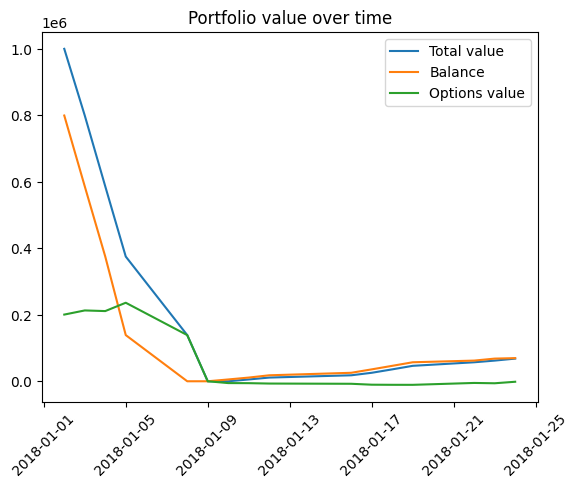

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,4.10464


wandb: Agent Starting Run: wqjmgj2d with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 68983.87000000023
Number of trades 11525
sharpe_ratio 3.7504403442892844


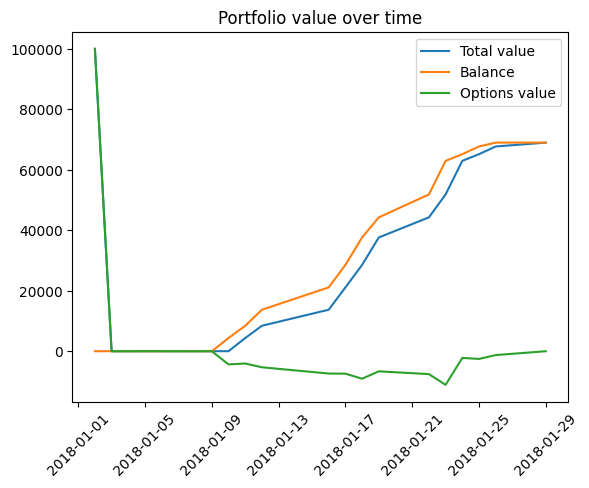

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.75044


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 6haai2pt with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 68996.26500000026
Number of trades 10627
sharpe_ratio 3.9353393075411645


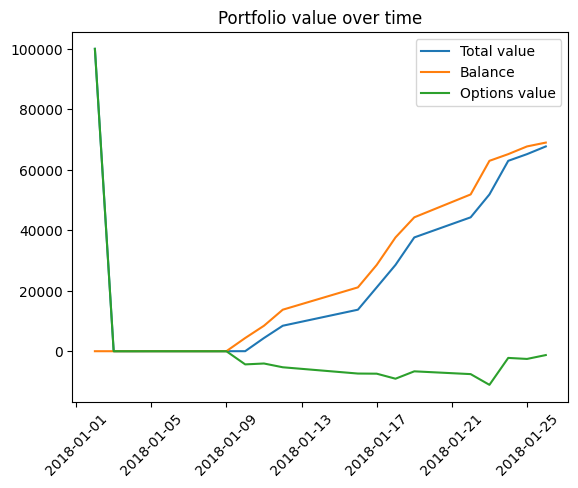

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.93534


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: lfbt437p with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 53472.64500000006
Number of trades 9663
sharpe_ratio 3.9671381273461557


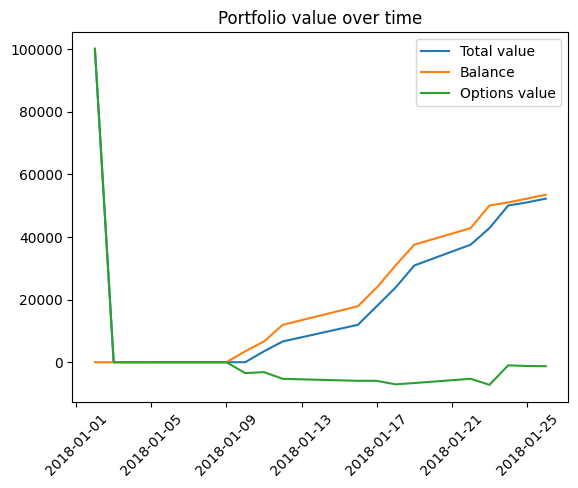

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.96714


wandb: Agent Starting Run: a57wvsqr with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 39409.63499999998
Number of trades 8622
sharpe_ratio 4.283430981704371


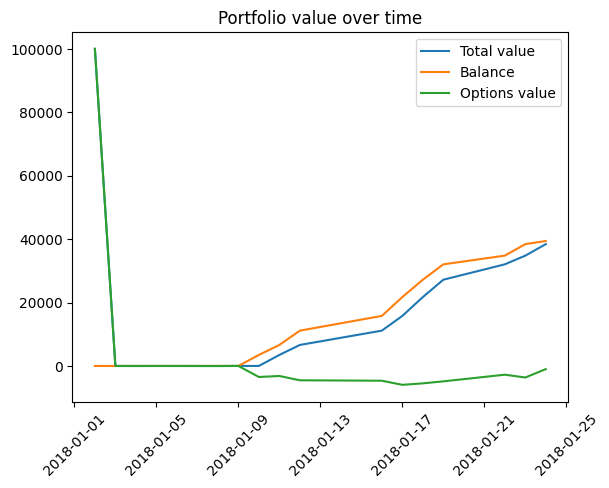

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,4.28343


wandb: Agent Starting Run: 2o3ldez9 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 69013.93500000068
Number of trades 11525
sharpe_ratio 3.926579479800169


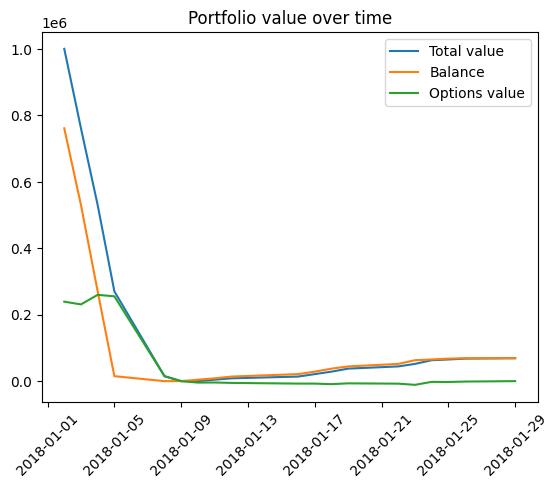

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.92658


wandb: Agent Starting Run: 8ao3rcb2 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 68990.77000000096
Number of trades 10627
sharpe_ratio 3.864607773076927


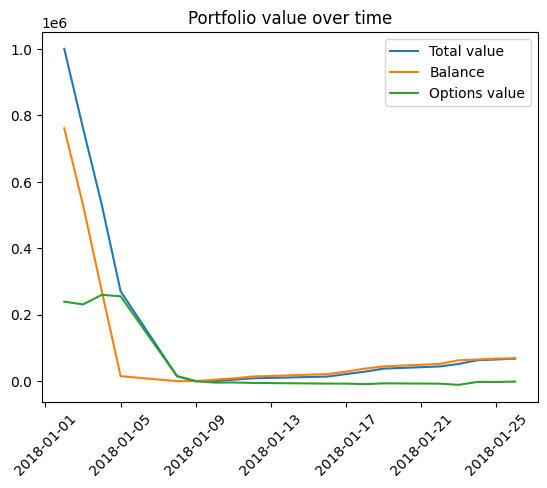

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.86461


wandb: Agent Starting Run: hqqmtwni with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 53480.15000000008
Number of trades 9663
sharpe_ratio 3.9042083140699817


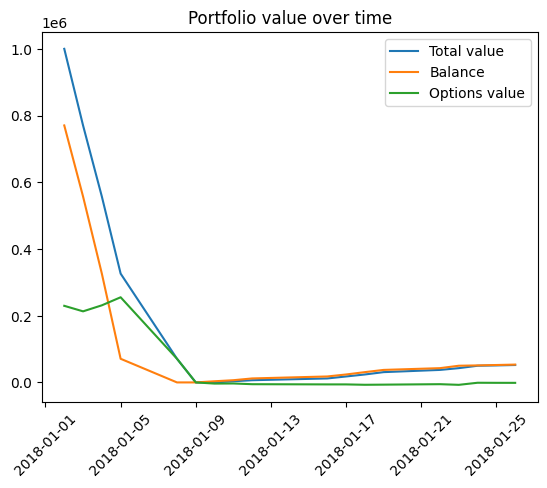

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.90421


wandb: Agent Starting Run: otjq3zbv with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 39406.939999998904
Number of trades 8622
sharpe_ratio 4.104995259254159


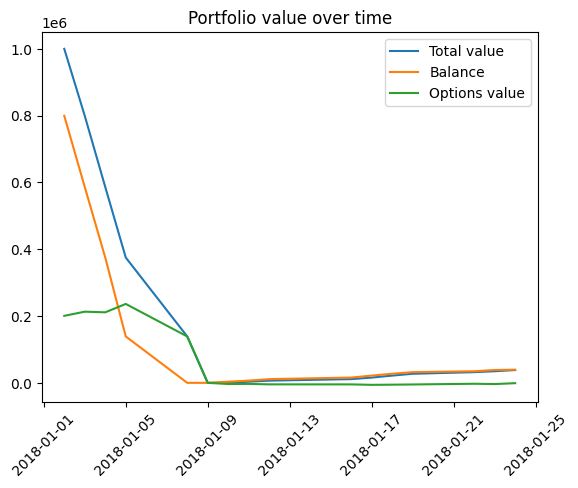

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,4.105


wandb: Agent Starting Run: r8ppesol with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 34322.33500000008
Number of trades 10934
sharpe_ratio 4.08875262871832


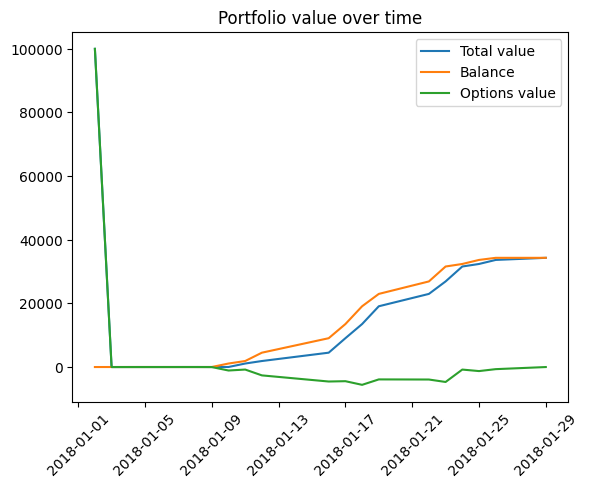

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,4.08875


wandb: Agent Starting Run: kfcm2p1l with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 34308.45499999996
Number of trades 10227
sharpe_ratio 3.8581252103419903


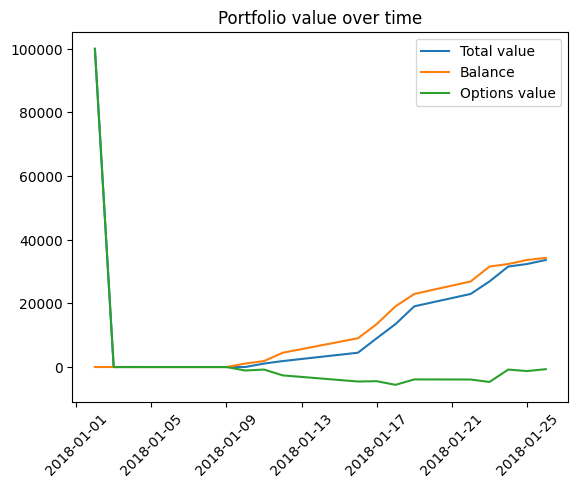

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,3.85813


wandb: Agent Starting Run: 6ledkrz0 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 26395.000000000102
Number of trades 9332
sharpe_ratio 5.080057681967839


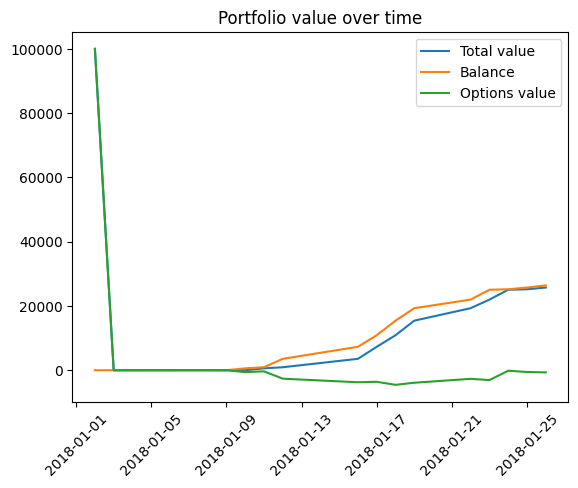

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,5.08006


wandb: Agent Starting Run: 2x3rqwre with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 19069.960000000025
Number of trades 8348
sharpe_ratio 4.359818658891129


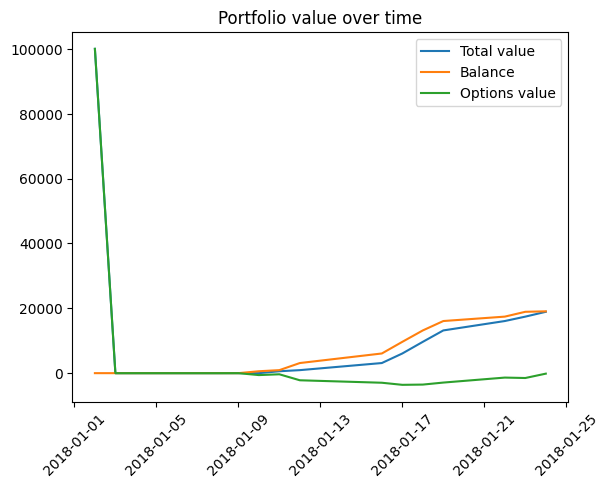

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,4.35982


wandb: Agent Starting Run: udjjah17 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 34312.08500000082
Number of trades 10934
sharpe_ratio 3.7561857844068745


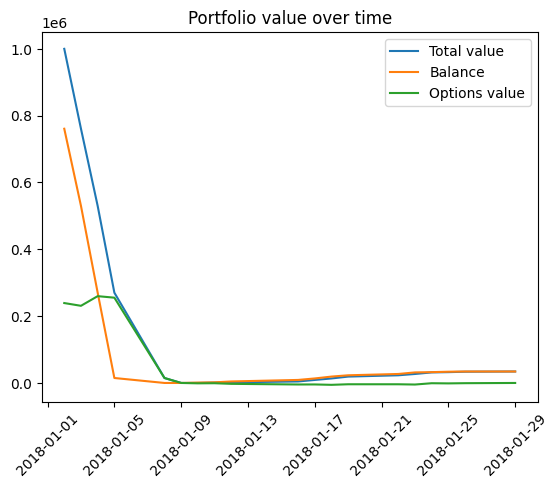

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,3.75619


wandb: Agent Starting Run: or5xp8w8 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 34310.21000000051
Number of trades 10227
sharpe_ratio 3.8591493353621766


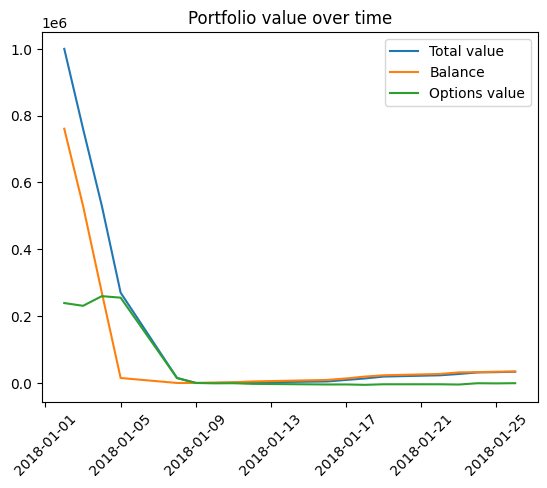

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,3.85915


wandb: Agent Starting Run: g2rnz364 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 26403.074999999168
Number of trades 9332
sharpe_ratio 4.125901716631618


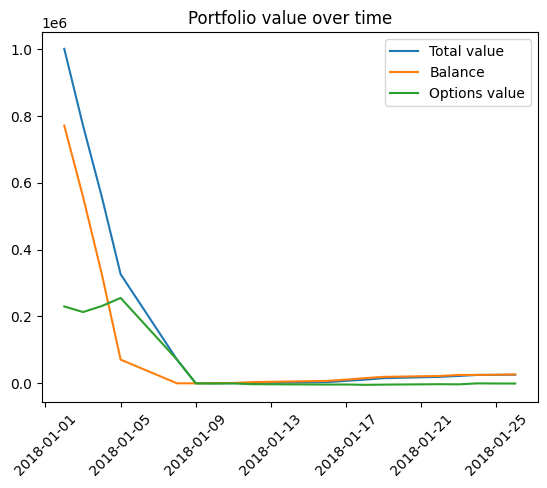

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,4.1259


wandb: Agent Starting Run: uugoxr31 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 19084.415000000725
Number of trades 8348
sharpe_ratio 4.156949738560803


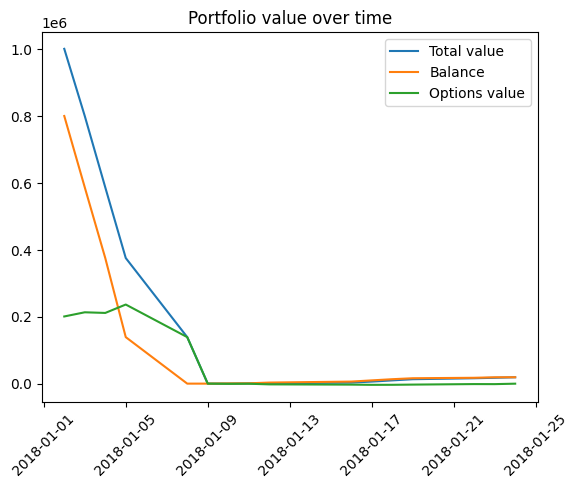

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,4.15695


wandb: Agent Starting Run: lugr7vr6 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 404254.6950000002
Number of trades 13852
sharpe_ratio 3.743897094731428


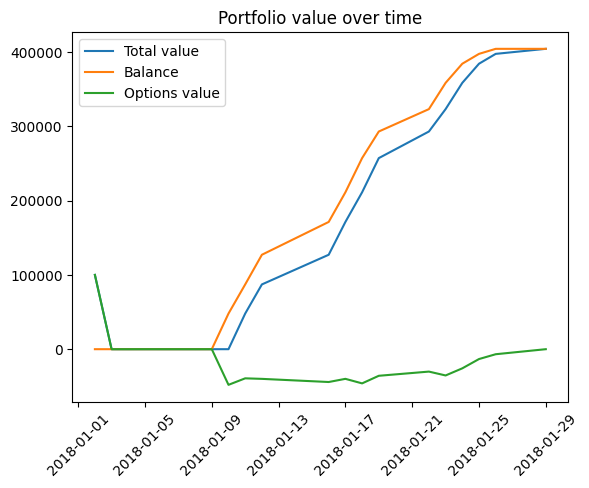

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.7439


wandb: Agent Starting Run: xra02pkk with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 404269.8250000003
Number of trades 12495
sharpe_ratio 3.865228198343701


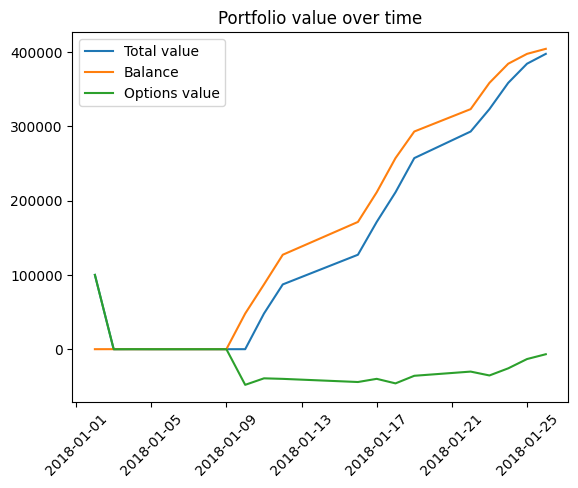

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.86523


wandb: Agent Starting Run: 6umlmayl with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 321000.16
Number of trades 11187
sharpe_ratio 3.8778637341595137


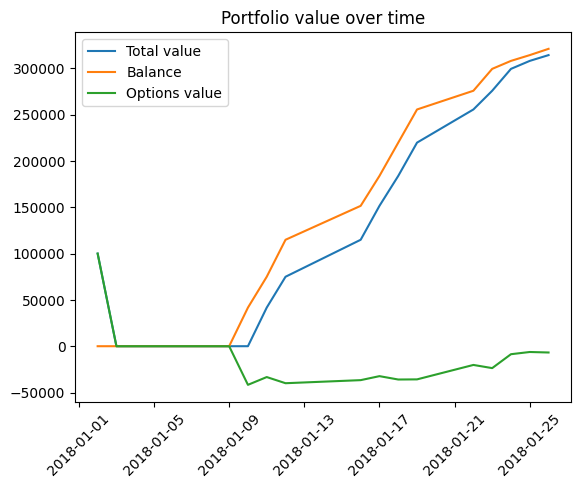

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.87786


wandb: Agent Starting Run: aatjcnvf with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 255718.1100000001
Number of trades 9873
sharpe_ratio 4.109564449102565


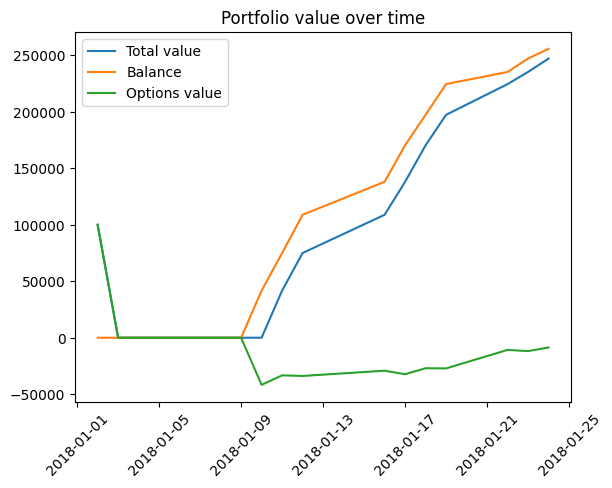

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,4.10956


wandb: Agent Starting Run: k7ly5f6z with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 404261.45000000054
Number of trades 13852
sharpe_ratio 3.7407538240412688


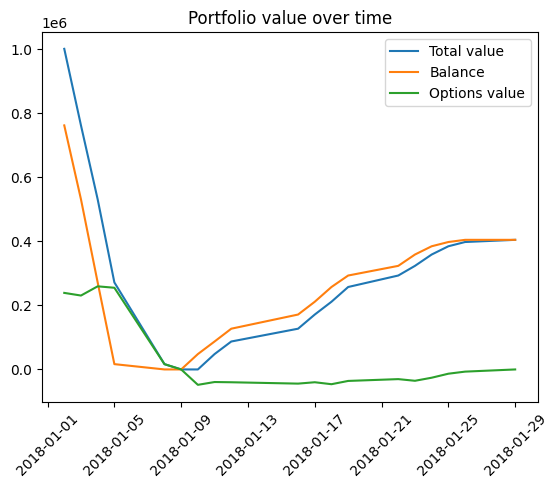

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.74075


wandb: Agent Starting Run: 2kyu666r with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 404309.20000000077
Number of trades 12495
sharpe_ratio 3.866348070877359


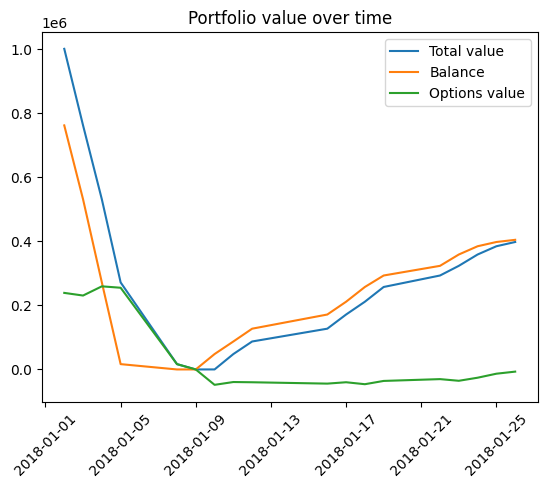

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.86635


wandb: Agent Starting Run: ve4qlbfl with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 321007.5749999992
Number of trades 11187
sharpe_ratio 3.8491459067780207


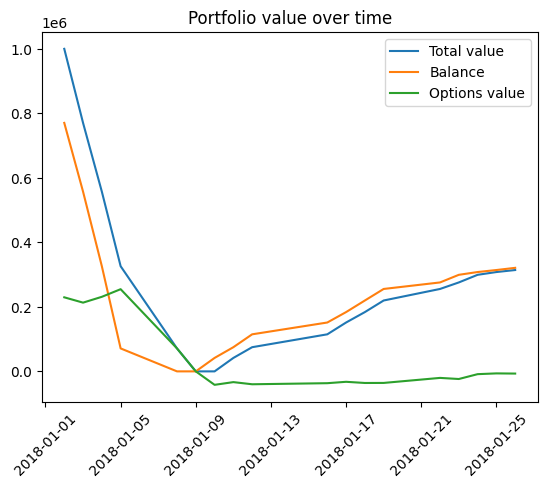

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.84915


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: cn9u23kk with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 255688.41499999928
Number of trades 9873
sharpe_ratio 4.0984661294425555


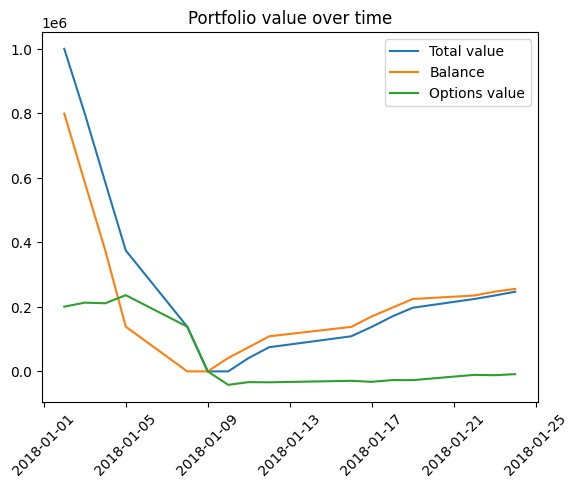

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,4.09847


wandb: Agent Starting Run: mi556wpo with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 253204.71999999986
Number of trades 13051
sharpe_ratio 3.9205481155759676


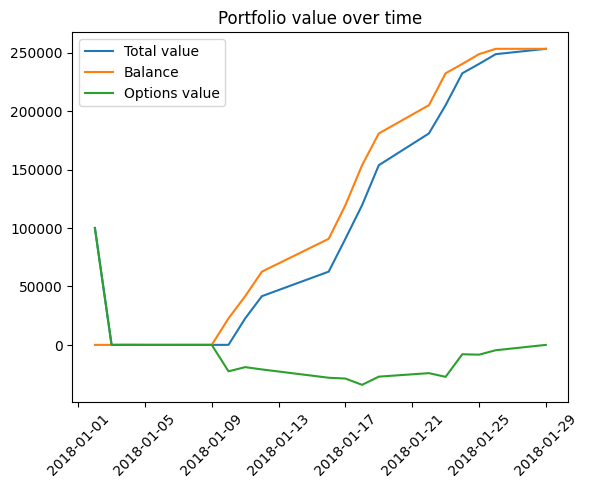

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.92055


wandb: Agent Starting Run: 7cehsk89 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 253170.67499999984
Number of trades 11817
sharpe_ratio 4.111018486409706


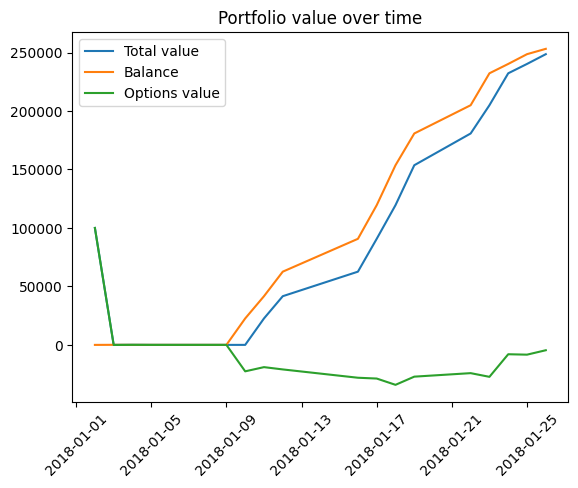

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,4.11102


wandb: Agent Starting Run: 3o6tdkl3 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 201306.46499999997
Number of trades 10628
sharpe_ratio 3.9799208882405104


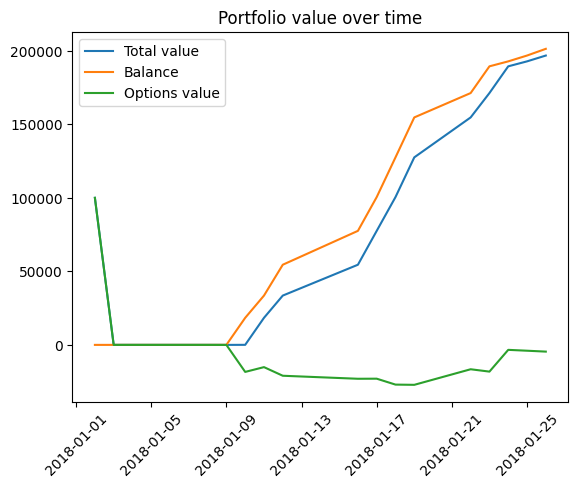

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.97992


wandb: Agent Starting Run: 309bg0h0 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 152887.76999999976
Number of trades 9395
sharpe_ratio 4.12520817283869


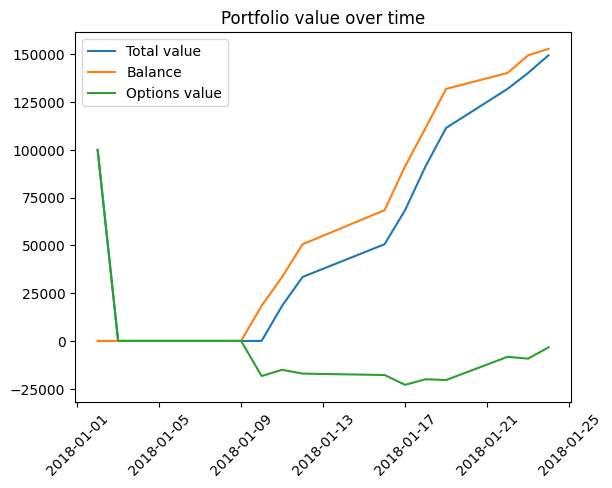

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,4.12521


wandb: Agent Starting Run: pc48nkfx with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 253146.85999999996
Number of trades 13051
sharpe_ratio 3.7414595254351455


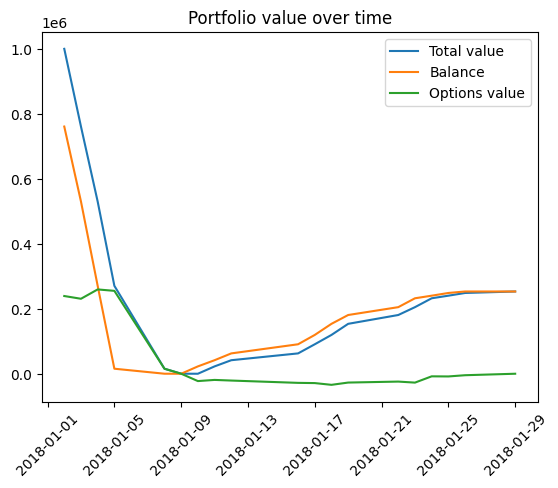

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.74146


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: aks7ztie with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 253157.04000000044
Number of trades 11817
sharpe_ratio 3.849531412310191


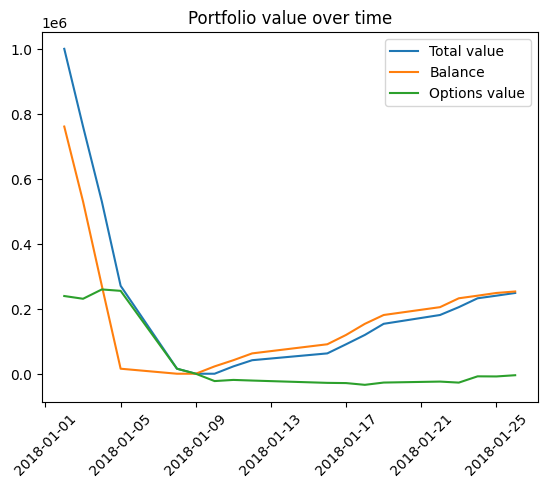

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.84953


wandb: Agent Starting Run: o9rtg5cn with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 201277.78000000006
Number of trades 10628
sharpe_ratio 3.849767053505759


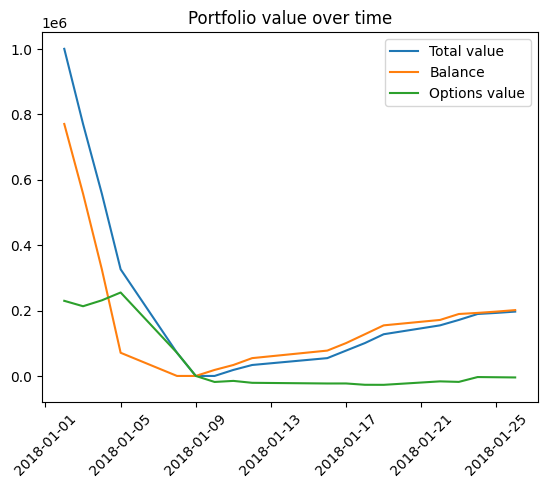

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.84977


wandb: Agent Starting Run: 51ijpvd9 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 152883.49000000028
Number of trades 9395
sharpe_ratio 4.102168109705163


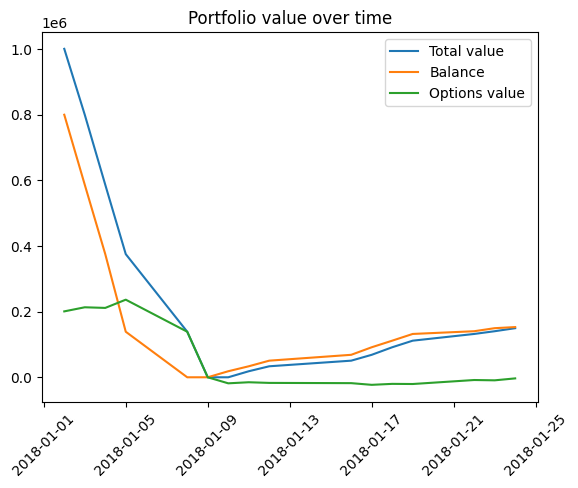

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,4.10217


wandb: Agent Starting Run: 3d46gb1t with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 121878.55999999998
Number of trades 12070
sharpe_ratio 4.063126446833919


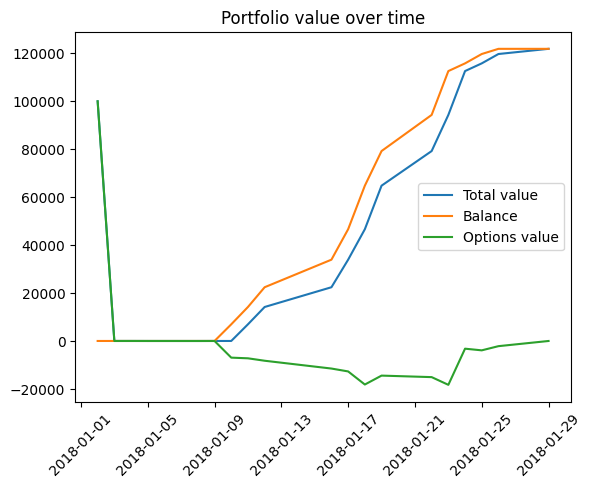

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,4.06313


wandb: Agent Starting Run: lweuu7si with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 121880.47999999997
Number of trades 11029
sharpe_ratio 3.986655730472769


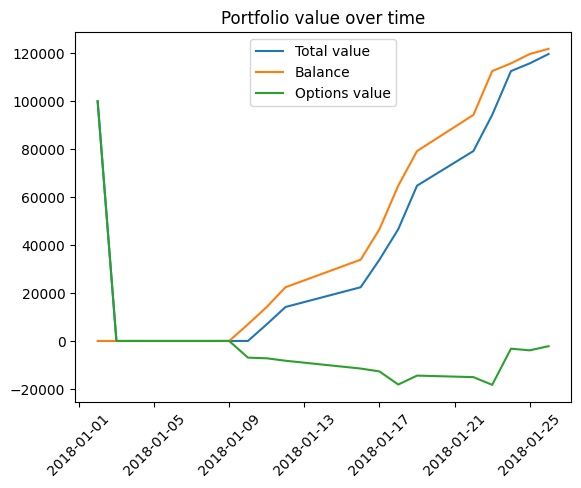

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.98666


wandb: Agent Starting Run: ztwhxkw7 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 95265.28000000014
Number of trades 9990
sharpe_ratio 4.103980911931271


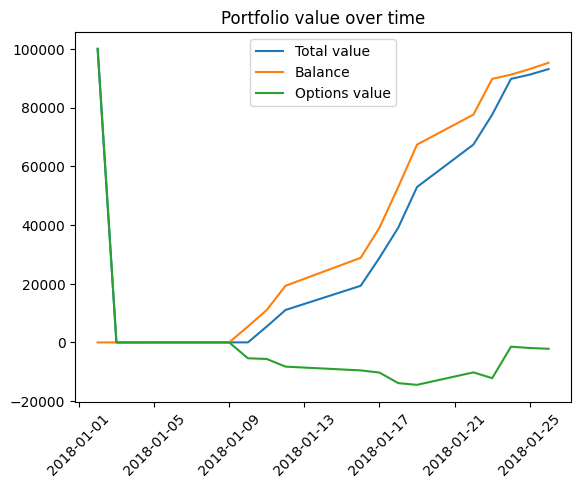

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,4.10398


wandb: Agent Starting Run: mmml737i with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 69399.70499999996
Number of trades 8874
sharpe_ratio 4.1196641837916825


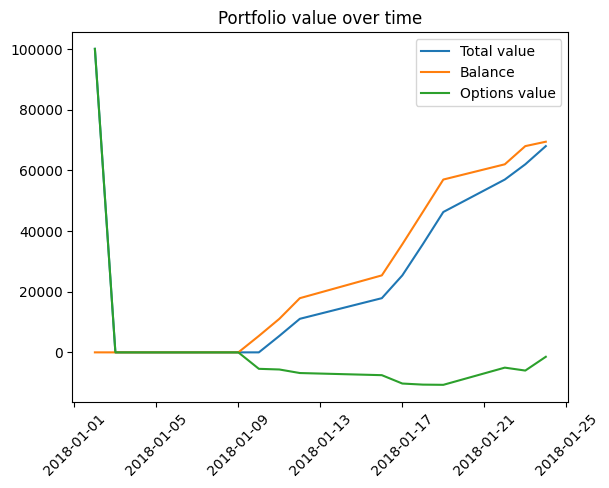

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,4.11966


wandb: Agent Starting Run: mauewh3p with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 121889.1200000004
Number of trades 12070
sharpe_ratio 3.846345448042537


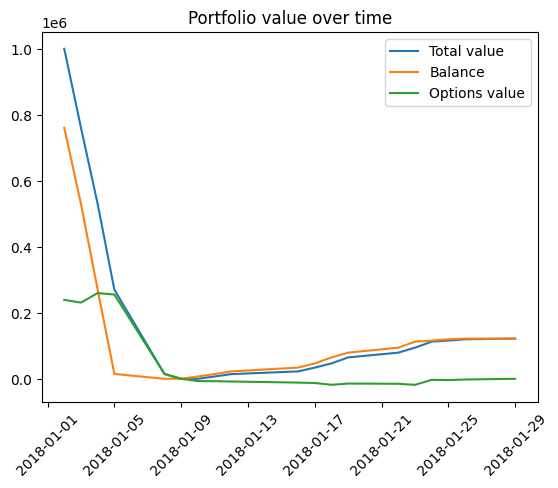

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.84635


wandb: Agent Starting Run: lnav41mn with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 121878.92499999968
Number of trades 11029
sharpe_ratio 3.8509927150733967


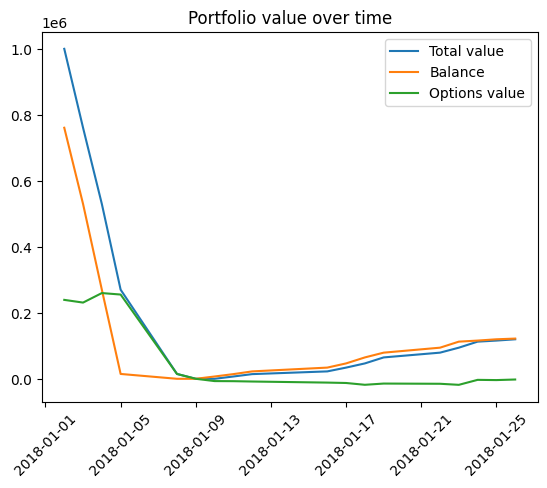

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.85099


wandb: Agent Starting Run: cogx9bw9 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 95255.12499999939
Number of trades 9990
sharpe_ratio 3.8516838963391637


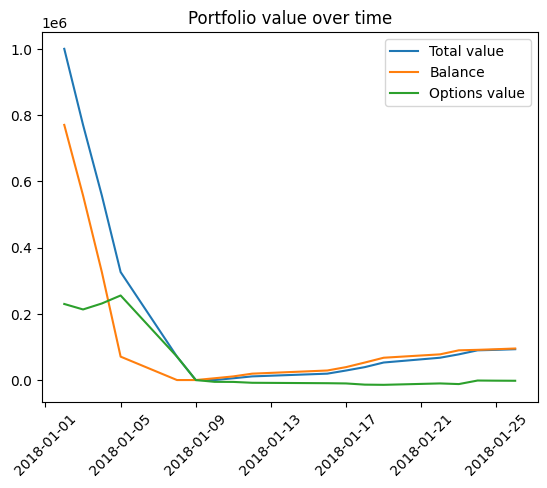

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.85168


wandb: Agent Starting Run: 8mhkf98k with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 69378.53999999905
Number of trades 8874
sharpe_ratio 4.098578105071138


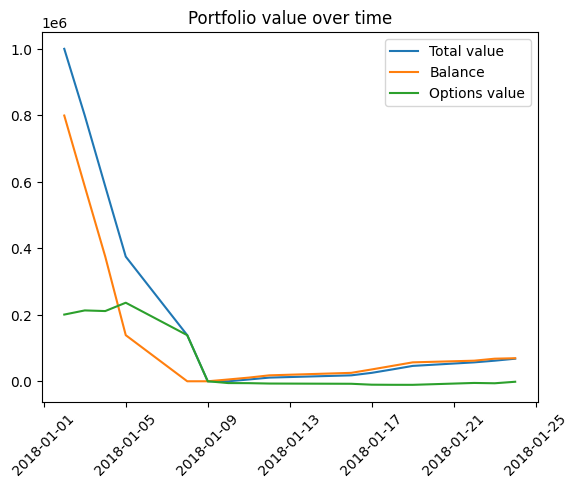

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,4.09858


wandb: Agent Starting Run: qrtw7jg4 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 68675.73500000013
Number of trades 11525
sharpe_ratio 3.9223001444062806


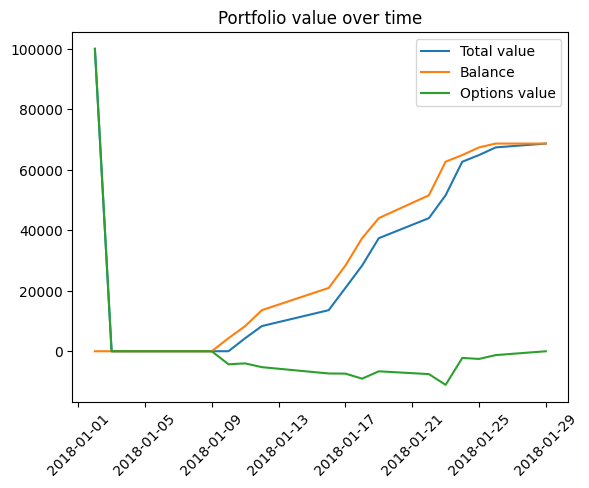

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.9223


wandb: Agent Starting Run: e9wq5pbo with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 68669.0550000002
Number of trades 10627
sharpe_ratio 4.108188737055884


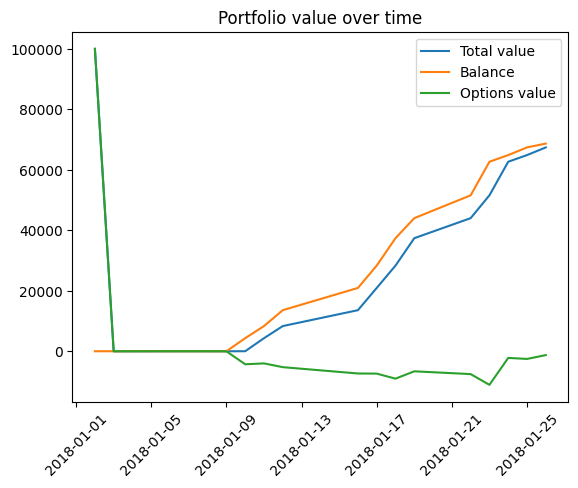

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,4.10819


wandb: Agent Starting Run: zq238vki with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 53177.415000000095
Number of trades 9663
sharpe_ratio 3.858287105145097


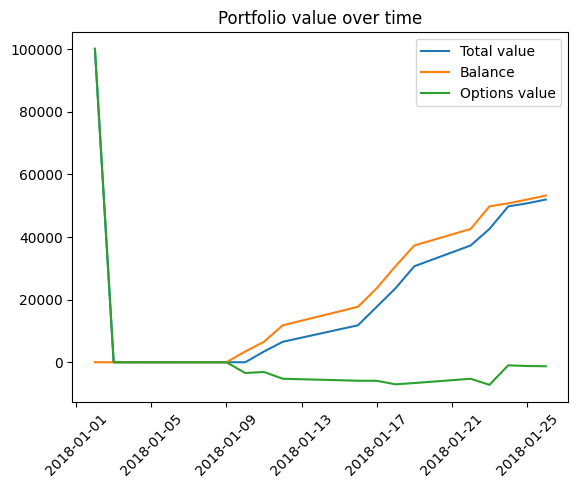

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.85829


wandb: Agent Starting Run: f8ib674w with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 39161.34999999991
Number of trades 8622
sharpe_ratio 4.177905462252195


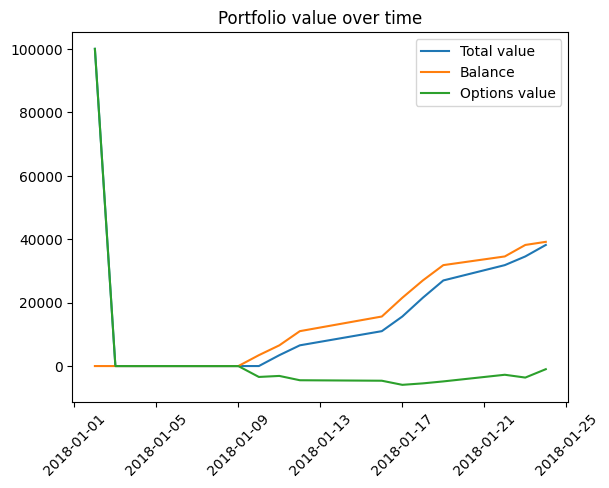

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,4.17791


wandb: Agent Starting Run: gr5ijtsn with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 68658.04000000026
Number of trades 11525
sharpe_ratio 3.7418122014144855


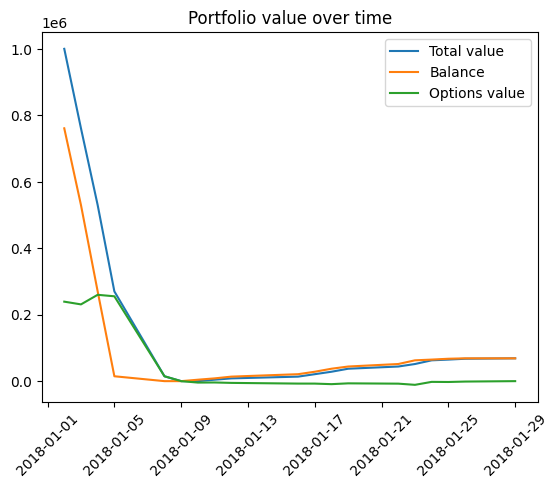

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.74181


wandb: Agent Starting Run: qwy09leq with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 68666.13500000011
Number of trades 10627
sharpe_ratio 3.8607624703124577


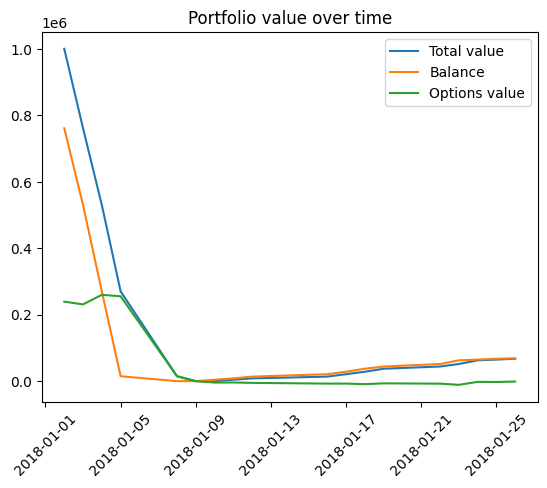

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.86076


wandb: Agent Starting Run: ra7enyjf with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 53179.75500000002
Number of trades 9663
sharpe_ratio 3.849562183464033


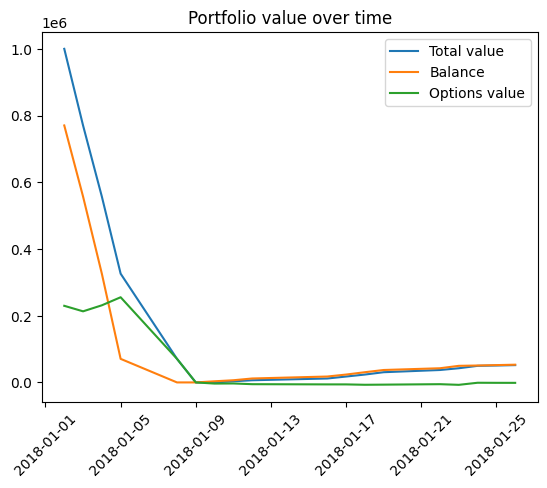

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.84956


wandb: Agent Starting Run: t40a6sop with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 39157.39500000048
Number of trades 8622
sharpe_ratio 4.099633924079316


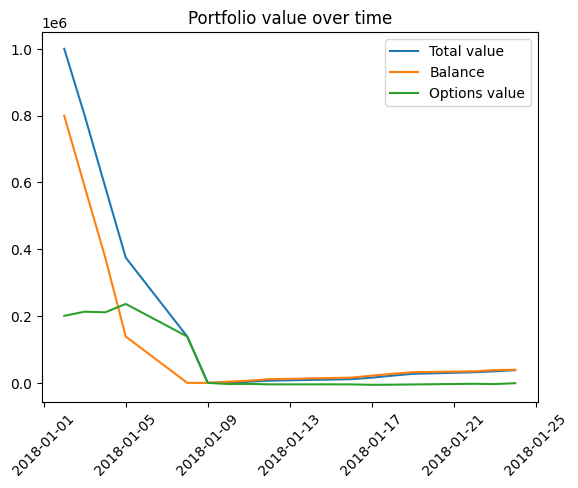

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,4.09963


wandb: Agent Starting Run: 0m3ijwpq with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 34014.94000000011
Number of trades 10934
sharpe_ratio 3.895357978913233


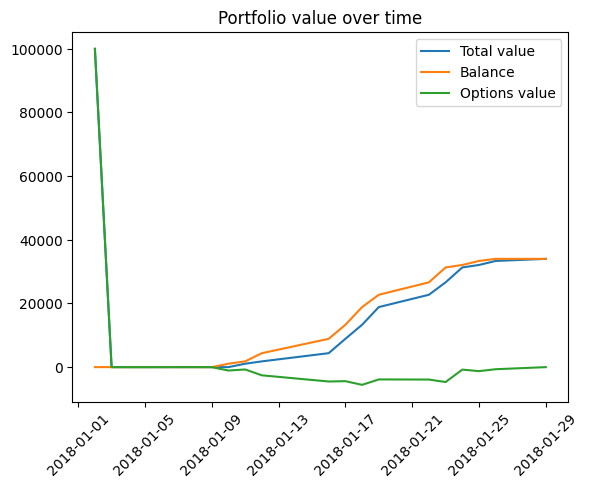

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,3.89536


wandb: Agent Starting Run: 1dg5ixq3 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 33989.82500000002
Number of trades 10227
sharpe_ratio 4.108783128385808


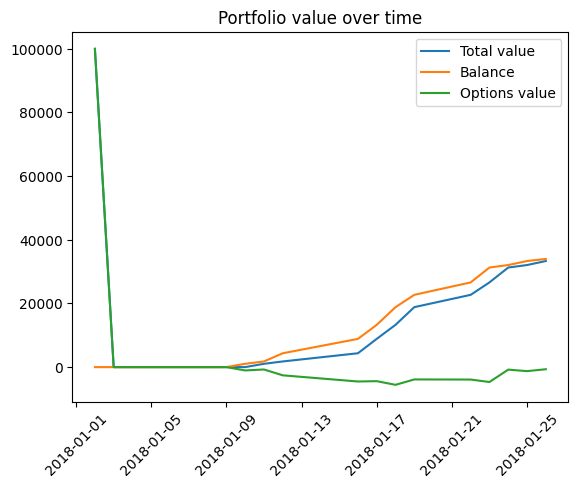

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,4.10878


wandb: Agent Starting Run: ki3aefa8 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 26112.48499999991
Number of trades 9332
sharpe_ratio 6.04105344227658


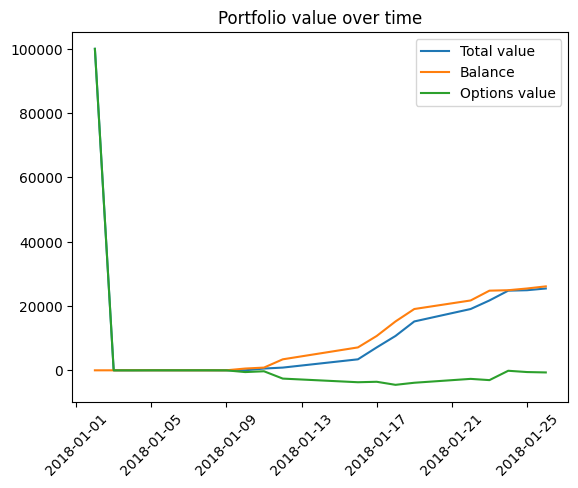

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,6.04105


wandb: Agent Starting Run: yn931axh with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 18827.400000000056
Number of trades 8348
sharpe_ratio 4.842057543623066


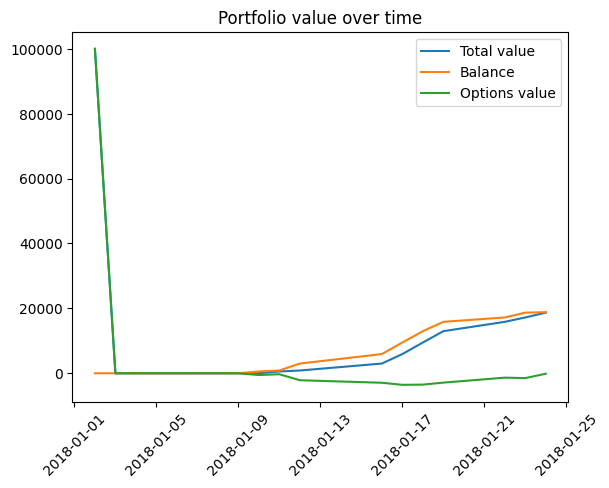

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,4.84206


wandb: Agent Starting Run: utq75wuj with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 33998.33500000021
Number of trades 10934
sharpe_ratio 4.107078298877853


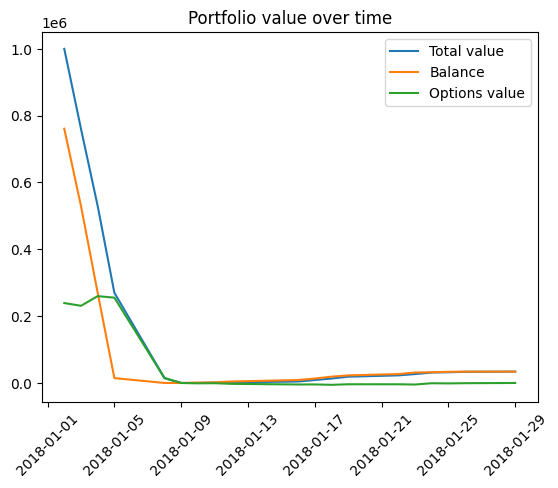

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,4.10708


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: y0do5nvc with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 33995.2700000004
Number of trades 10227
sharpe_ratio 3.9445092646276363


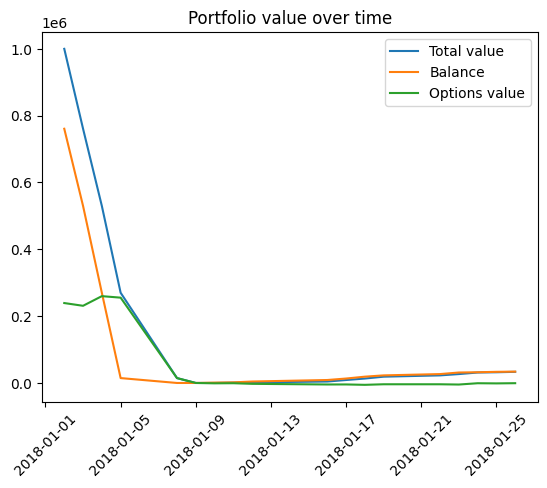

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,3.94451


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: geg9tjm7 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 26123.18499999992
Number of trades 9332
sharpe_ratio 3.945843359332057


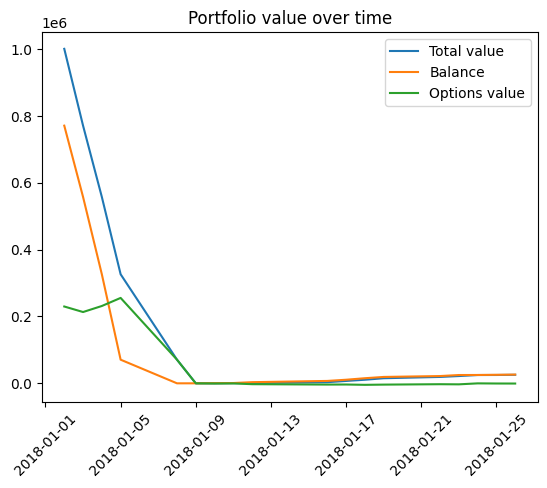

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,3.94584


wandb: Agent Starting Run: ywpbs1de with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 18840.770000000663
Number of trades 8348
sharpe_ratio 4.317862717094726


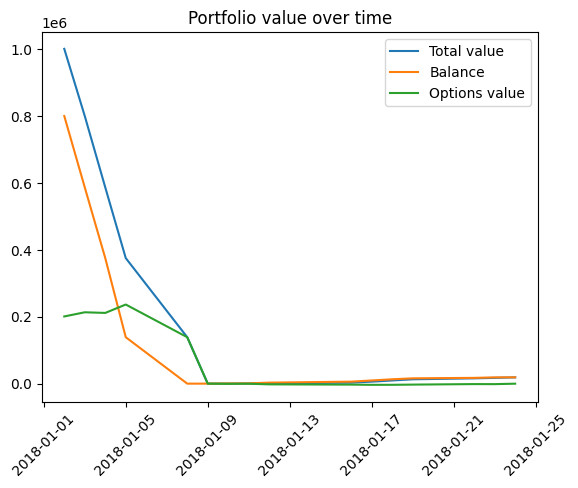

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,4.31786


wandb: Agent Starting Run: sb25ycdy with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 403996.80000000045
Number of trades 13852
sharpe_ratio 4.254940057262834


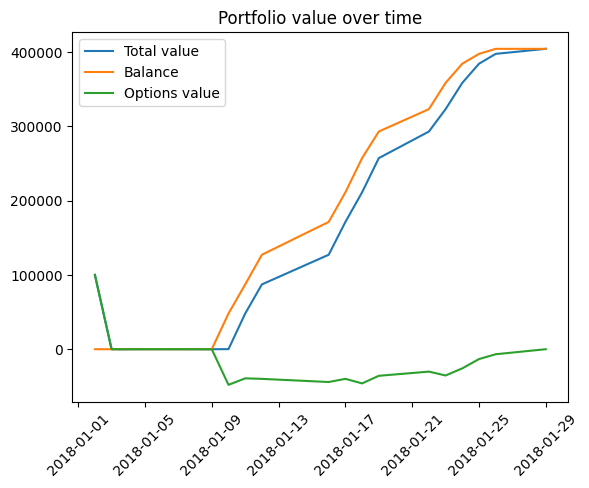

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,4.25494


wandb: Agent Starting Run: fcpzjq6r with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 403947.5850000003
Number of trades 12495
sharpe_ratio 4.565066992824484


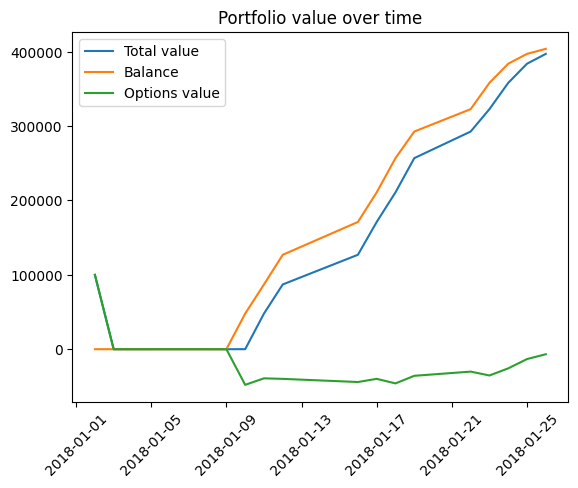

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,4.56507


wandb: Agent Starting Run: 0wuq7ezg with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 320675.3050000003
Number of trades 11187
sharpe_ratio 3.8581733642601597


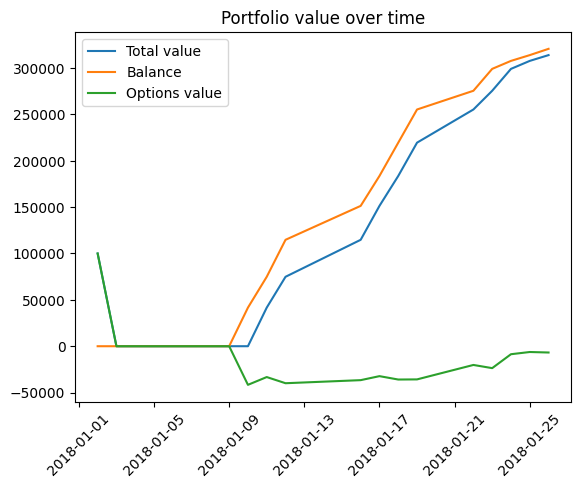

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.85817


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: dpwh4mmu with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 100000
Ending balance 255419.69000000035
Number of trades 9873
sharpe_ratio 4.106516116104588


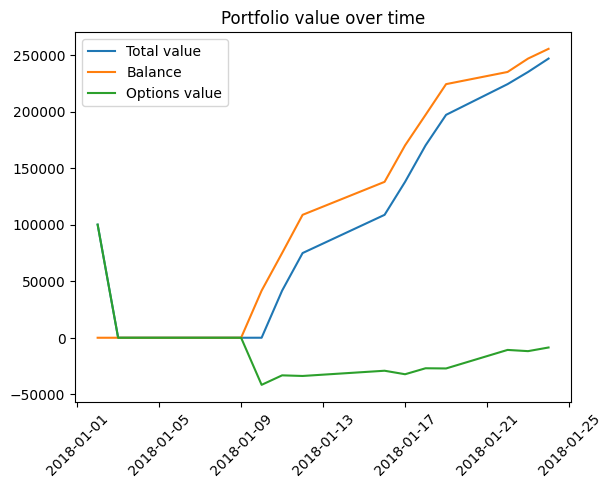

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,4.10652


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: qbcrkncu with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 404021.47000000096
Number of trades 13852
sharpe_ratio 4.0104381346383144


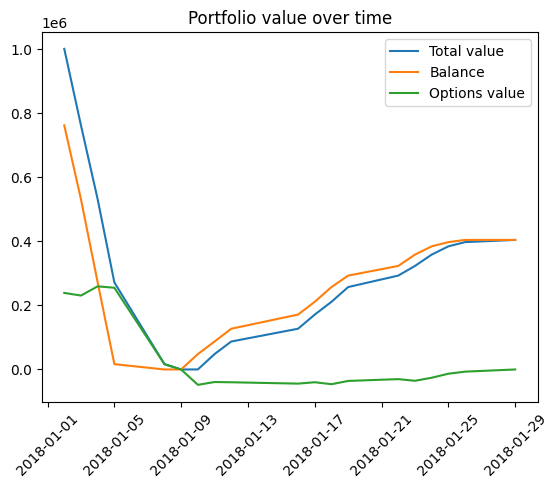

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,4.01044


wandb: Agent Starting Run: eeyes9iv with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 403930.4900000008
Number of trades 12495
sharpe_ratio 3.8482383149406623


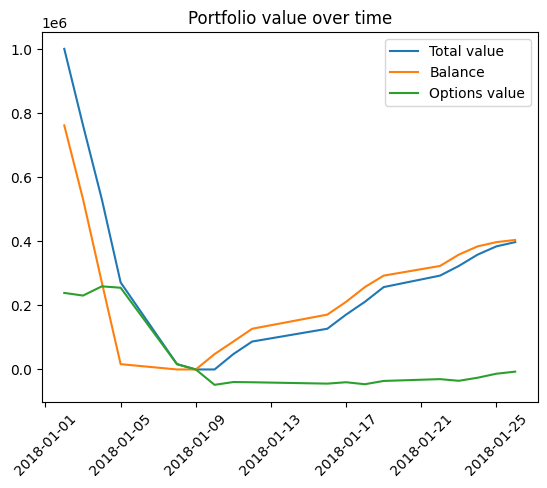

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.84824


wandb: Agent Starting Run: 74gicih8 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 320665.05499999964
Number of trades 11187
sharpe_ratio 3.8499356040528894


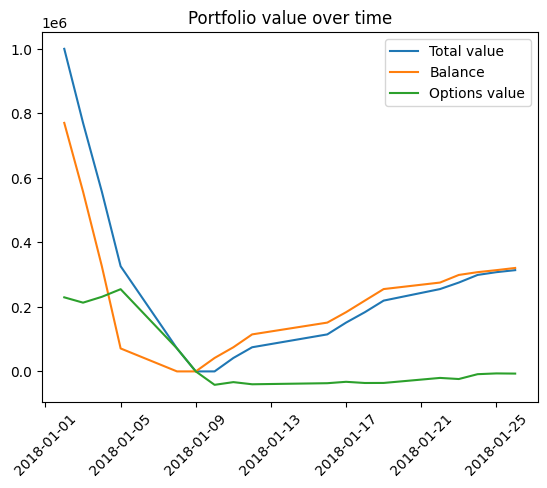

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,3.84994


wandb: Agent Starting Run: xl3y20kq with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.01
starting_balance 1000000
Ending balance 255405.67500000002
Number of trades 9873
sharpe_ratio 4.099079224688593


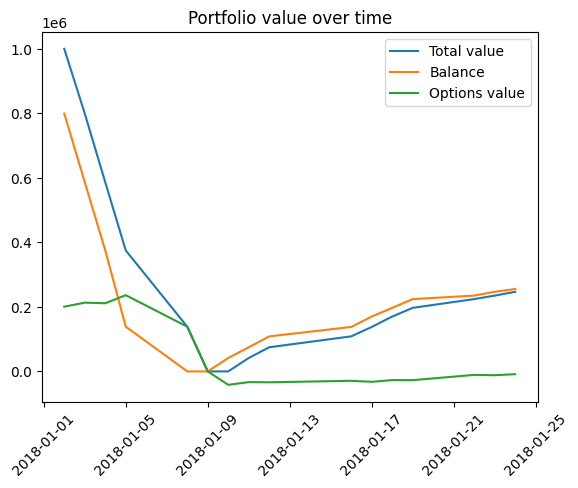

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.01
sharpe_ratio,4.09908


wandb: Agent Starting Run: rckrgw27 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 252870.58999999997
Number of trades 13051
sharpe_ratio 4.440624475747858


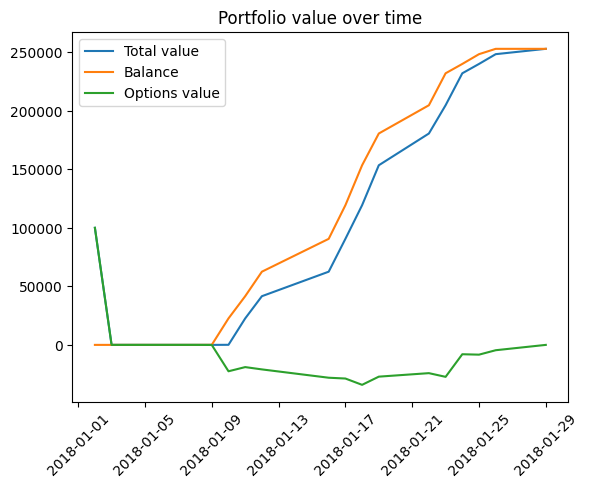

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,4.44062


wandb: Agent Starting Run: t9rqkbue with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 252806.2949999998
Number of trades 11817
sharpe_ratio 3.8558215686723565


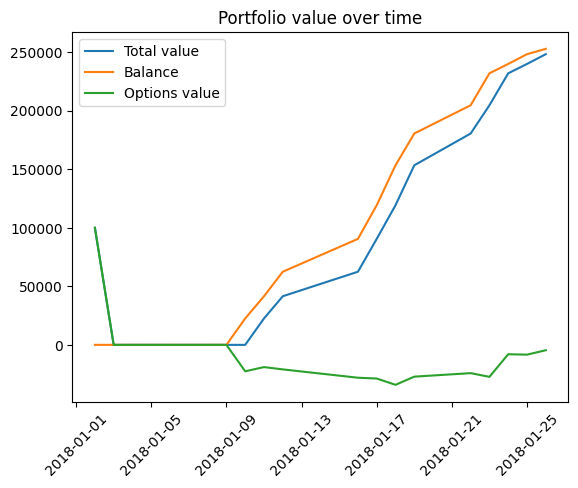

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.85582


wandb: Agent Starting Run: mq5hojyo with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 201014.15500000012
Number of trades 10628
sharpe_ratio 4.567382017887051


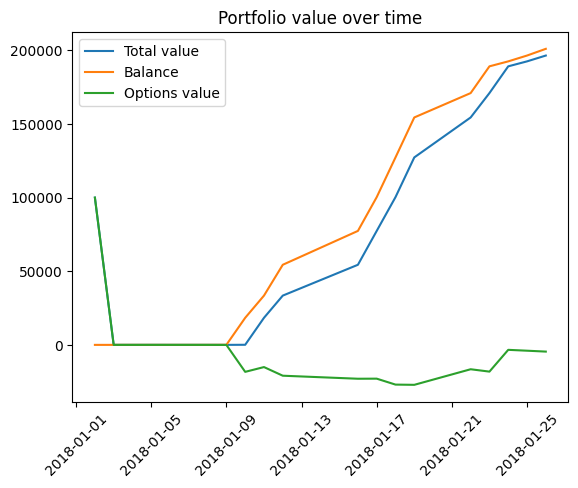

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,4.56738


wandb: Agent Starting Run: n5fbdney with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 100000
Ending balance 152595.42499999984
Number of trades 9395
sharpe_ratio 4.106674220631355


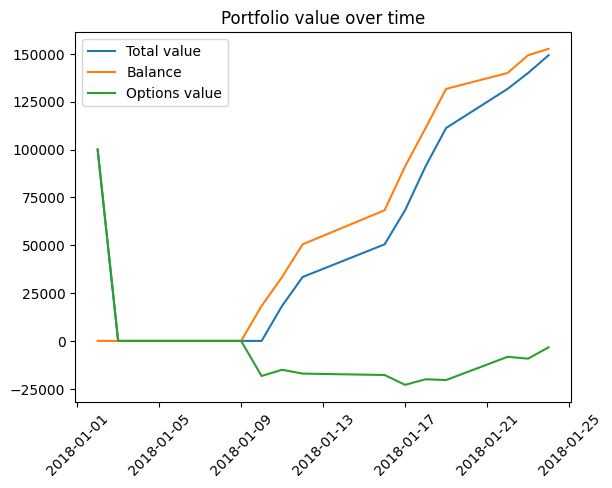

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,4.10667


wandb: Agent Starting Run: 8og5vumu with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 252841.19000000026
Number of trades 13051
sharpe_ratio 3.799641718579586


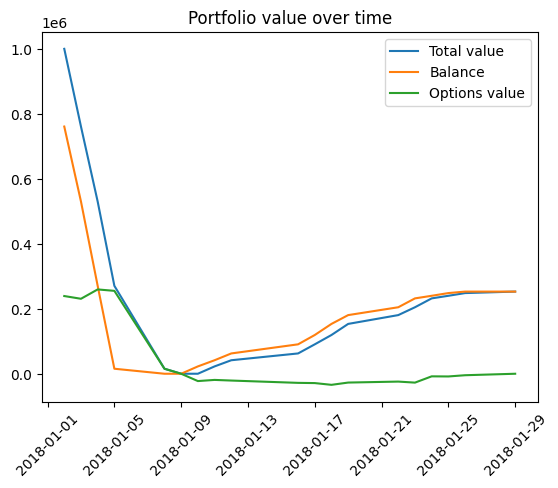

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.79964


wandb: Agent Starting Run: 1eik33wj with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 252803.84500000064
Number of trades 11817
sharpe_ratio 3.8496785687161843


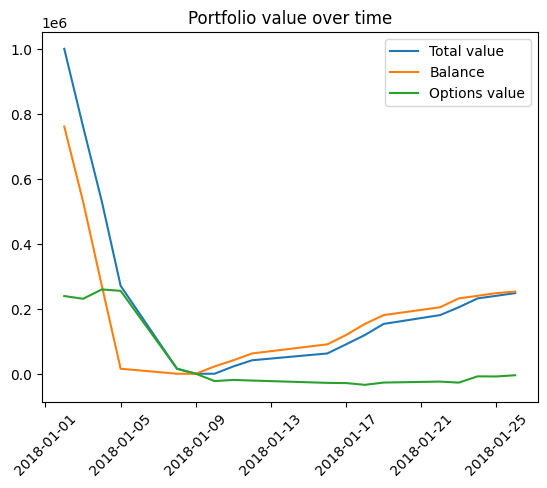

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.84968


wandb: Agent Starting Run: w5c40xyi with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 200953.79999999865
Number of trades 10628
sharpe_ratio 3.852151305721878


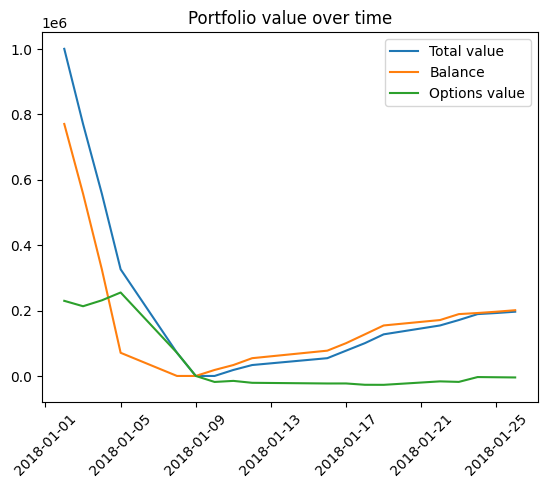

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,3.85215


wandb: Agent Starting Run: z7tl2n9j with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.02
starting_balance 1000000
Ending balance 152592.95499999987
Number of trades 9395
sharpe_ratio 4.098748005355699


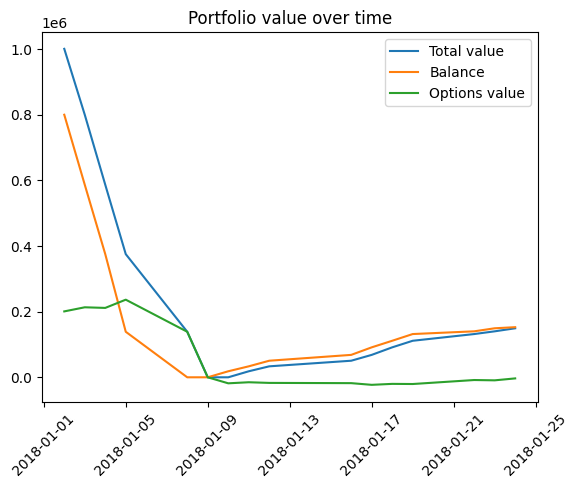

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.02
sharpe_ratio,4.09875


wandb: Agent Starting Run: 0apt4rgi with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 121535.68999999989
Number of trades 12070
sharpe_ratio 3.9541775888232933


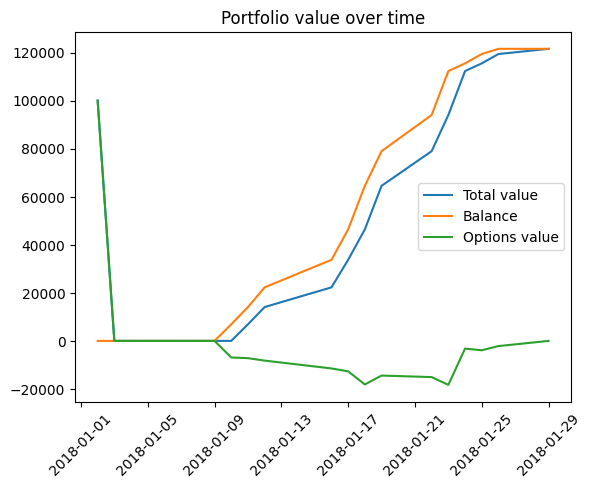

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.95418


wandb: Agent Starting Run: npuoc2wk with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 121536.90999999993
Number of trades 11029
sharpe_ratio 4.426852876388268


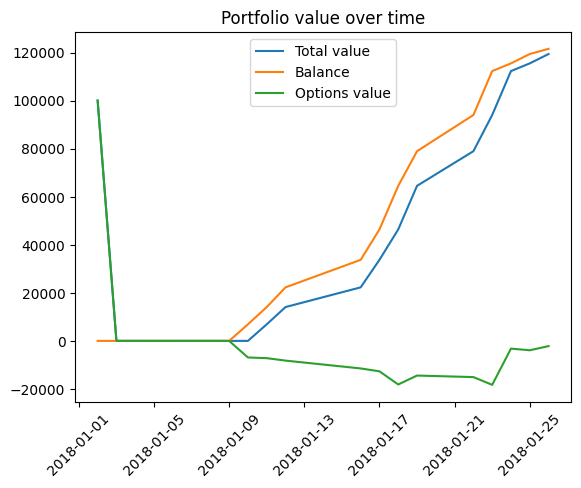

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,4.42685


wandb: Agent Starting Run: 7znzumje with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 94944.48500000018
Number of trades 9990
sharpe_ratio 3.9854086048568895


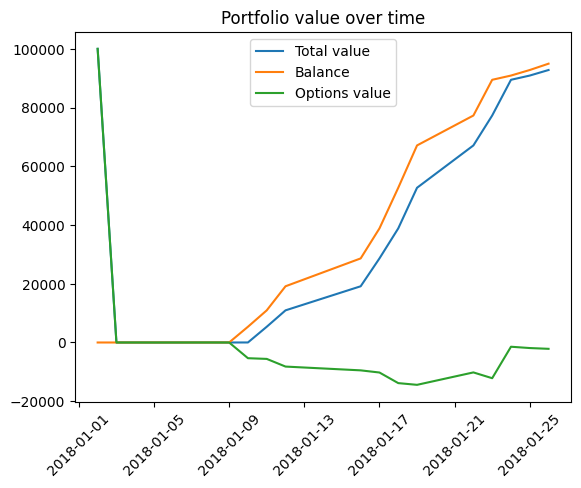

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.98541


wandb: Agent Starting Run: 9ur8gdvq with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 100000
Ending balance 69096.13000000002
Number of trades 8874
sharpe_ratio 4.1143314621514255


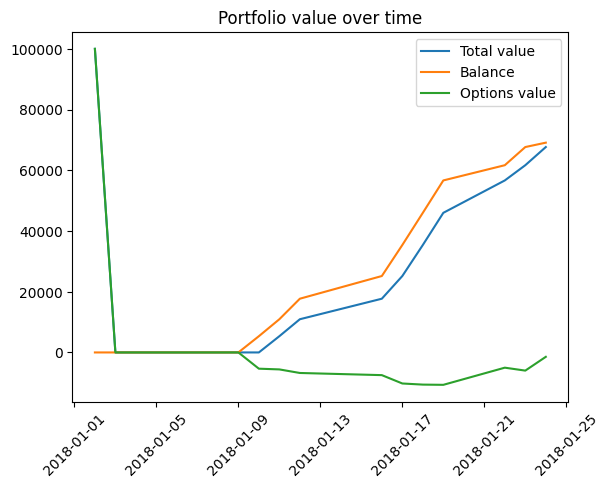

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,4.11433


wandb: Agent Starting Run: 49r2rfv5 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 121529.56000000017
Number of trades 12070
sharpe_ratio 3.903351298520224


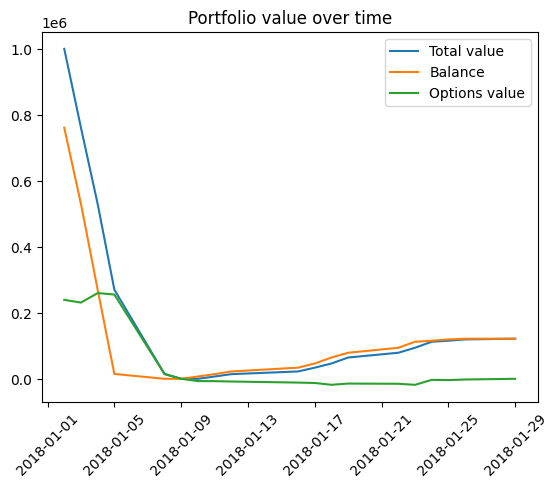

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.90335


wandb: Agent Starting Run: yv3tsr8g with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 121527.31500000012
Number of trades 11029
sharpe_ratio 3.8504664344051975


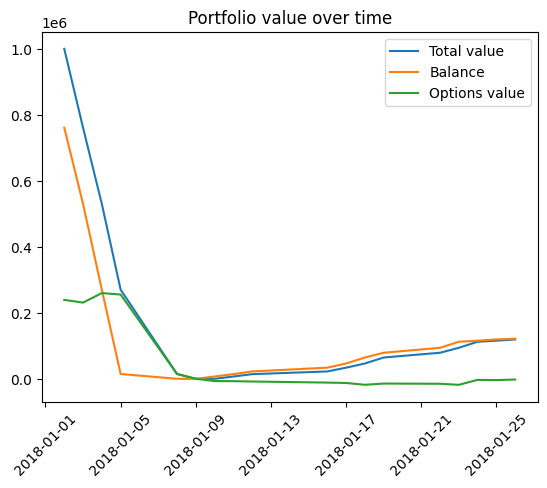

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.85047


wandb: Agent Starting Run: 5f58h3c1 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 94940.03999999988
Number of trades 9990
sharpe_ratio 3.8660701109623665


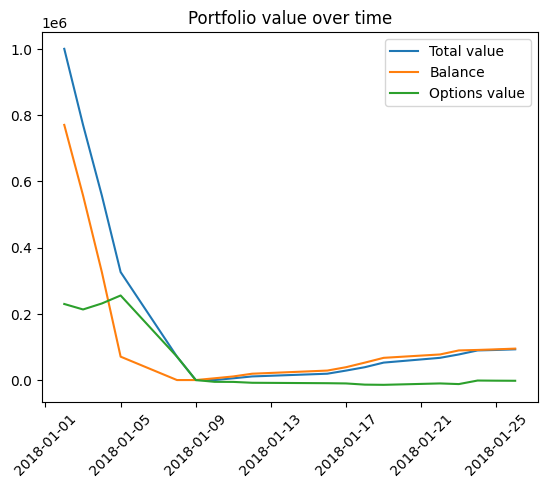

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,3.86607


wandb: Agent Starting Run: 0towpq6t with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.04
starting_balance 1000000
Ending balance 69104.65499999994
Number of trades 8874
sharpe_ratio 4.1060996481827186


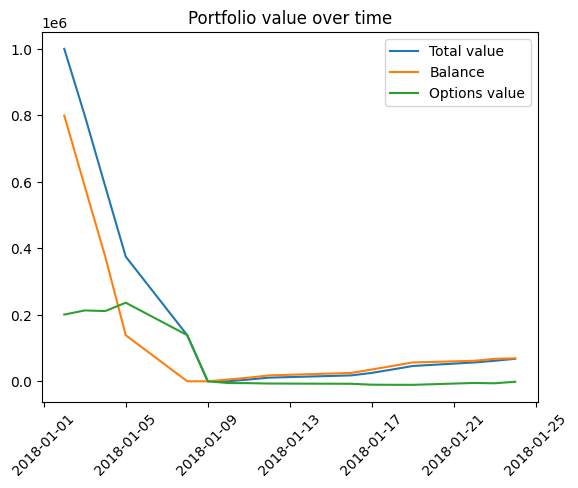

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.04
sharpe_ratio,4.1061


wandb: Agent Starting Run: vlq4hiyt with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 68310.11500000014
Number of trades 11525
sharpe_ratio 3.7489506158740213


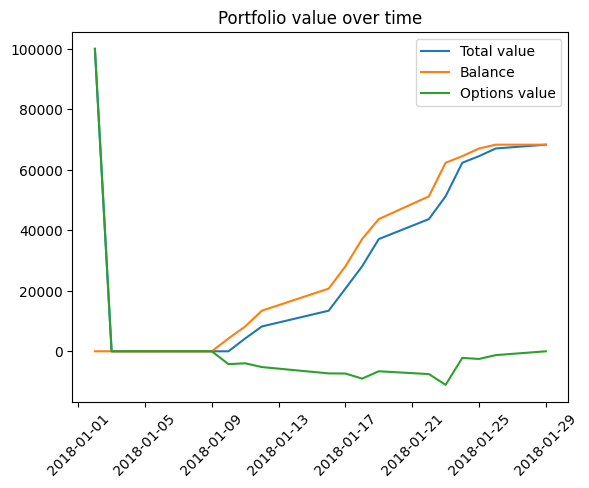

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.74895


wandb: Agent Starting Run: h6xupi6g with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 68313.0650000002
Number of trades 10627
sharpe_ratio 3.8943733205433513


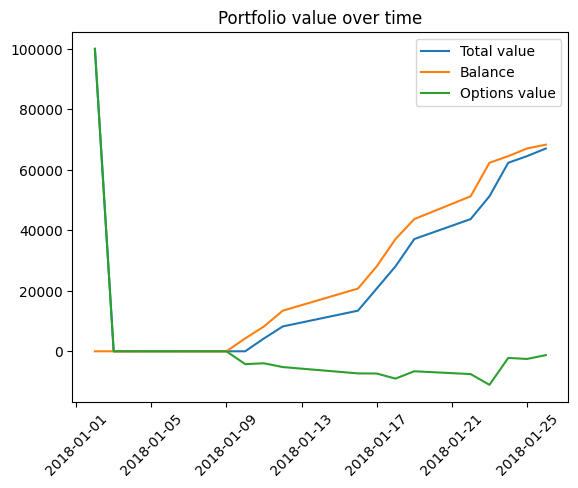

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.89437


wandb: Agent Starting Run: p8mt8hft with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 52865.0750000001
Number of trades 9663
sharpe_ratio 3.9044855582383535


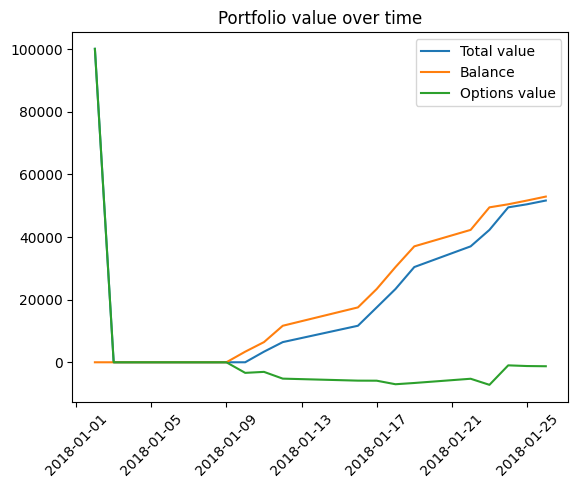

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.90449


wandb: Agent Starting Run: to3a2jtj with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 100000
Ending balance 38870.229999999996
Number of trades 8622
sharpe_ratio 4.0996988512003725


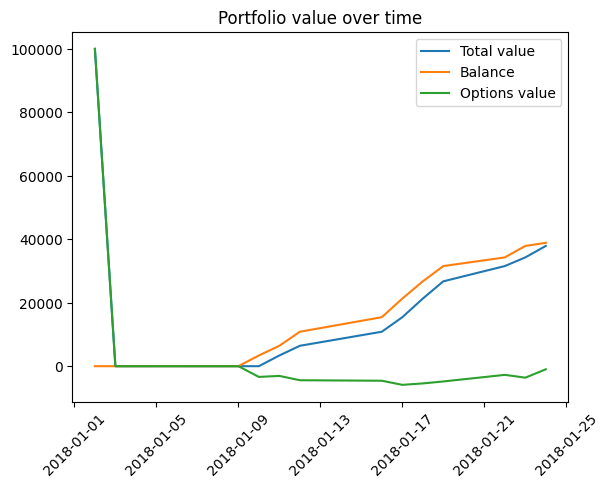

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,4.0997


wandb: Agent Starting Run: 47m7tb0k with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 68340.36500000086
Number of trades 11525
sharpe_ratio 4.07942367613888


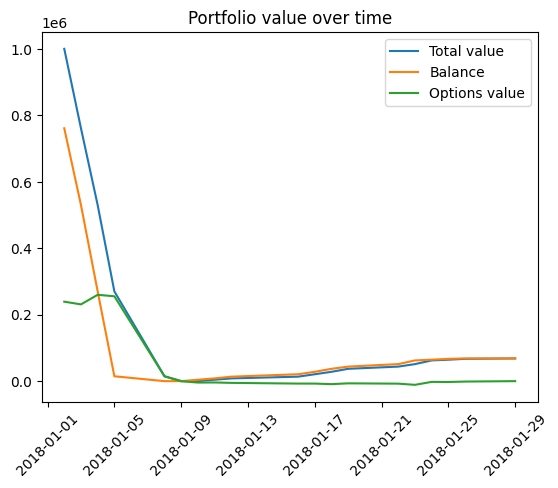

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,4.07942


wandb: Agent Starting Run: tvwy34lb with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 68316.57000000028
Number of trades 10627
sharpe_ratio 3.85639506092518


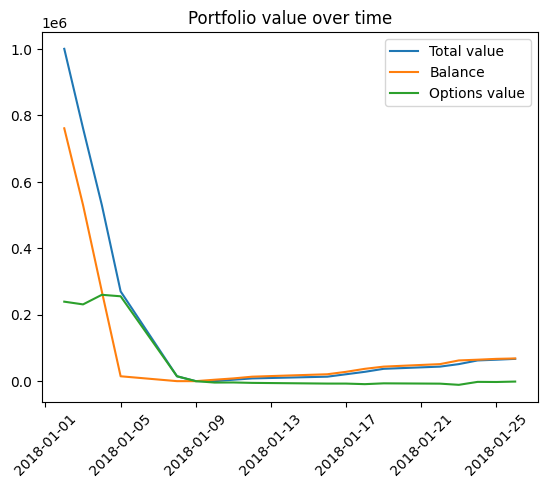

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.8564


wandb: Agent Starting Run: xw6ancfg with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 52860.154999999984
Number of trades 9663
sharpe_ratio 3.8502422736043163


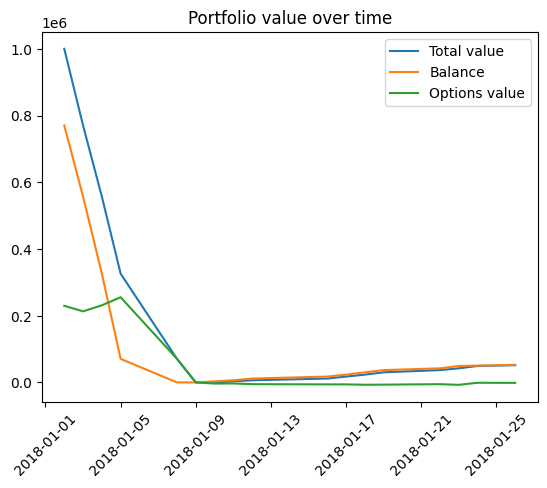

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,3.85024


wandb: Agent Starting Run: uvu4ayix with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.06
starting_balance 1000000
Ending balance 38879.649999999456
Number of trades 8622
sharpe_ratio 4.143883848162657


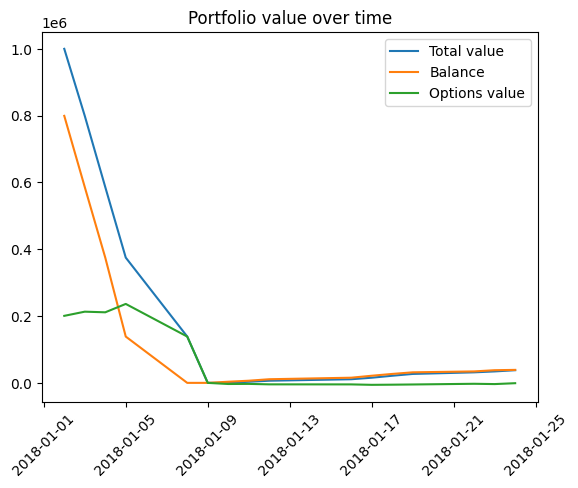

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.06
sharpe_ratio,4.14388


wandb: Agent Starting Run: x3kmy3kh with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 33648.53500000002
Number of trades 10934
sharpe_ratio 3.762232331035415


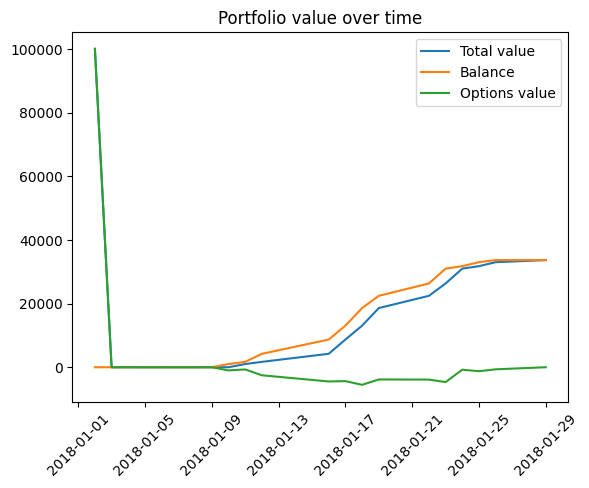

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,3.76223


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: xrm631u3 with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 33641.11500000009
Number of trades 10227
sharpe_ratio 4.015503455673402


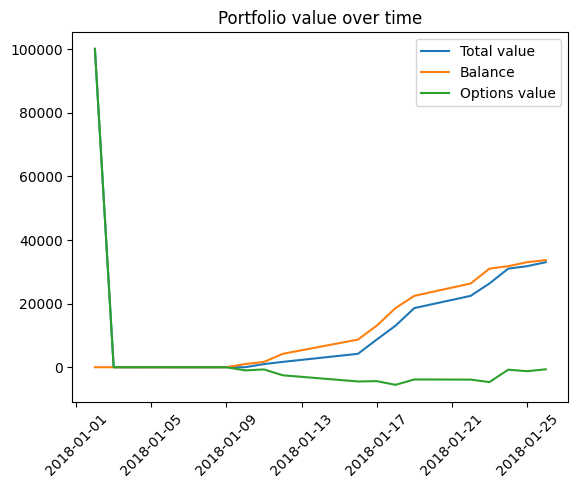

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,4.0155


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 3j6g90rh with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 25802.25500000009
Number of trades 9332
sharpe_ratio 4.7820019868404255


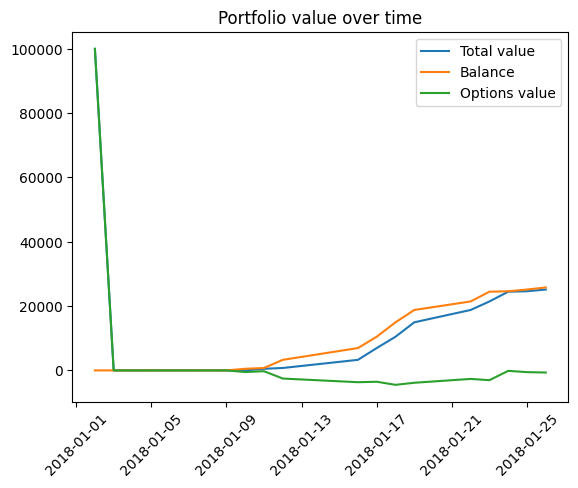

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,4.782


wandb: Agent Starting Run: 2ts6kvoj with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 100000
Ending balance 18536.465000000066
Number of trades 8348
sharpe_ratio 4.504178146340385


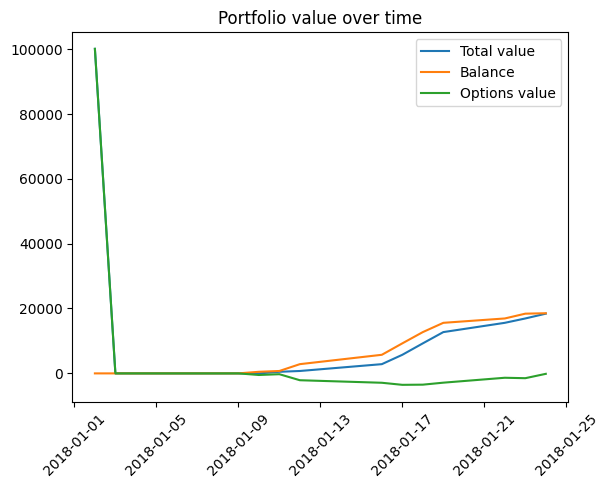

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,4.50418


wandb: Agent Starting Run: oxm3emqf with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 33642.65000000052
Number of trades 10934
sharpe_ratio 3.8001779850313513


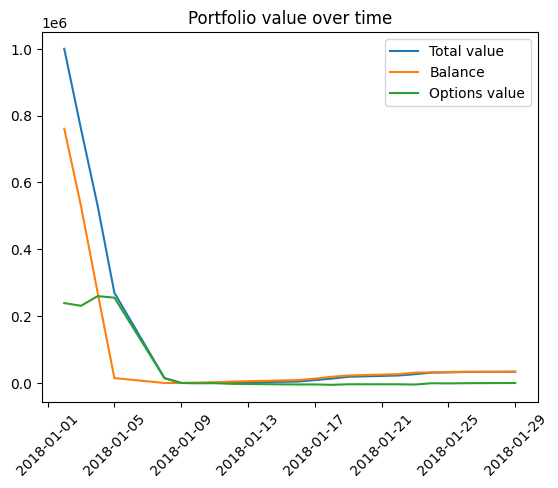

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,3.80018


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: nxlvkf4s with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 33660.435000000565
Number of trades 10227
sharpe_ratio 3.886839954369803


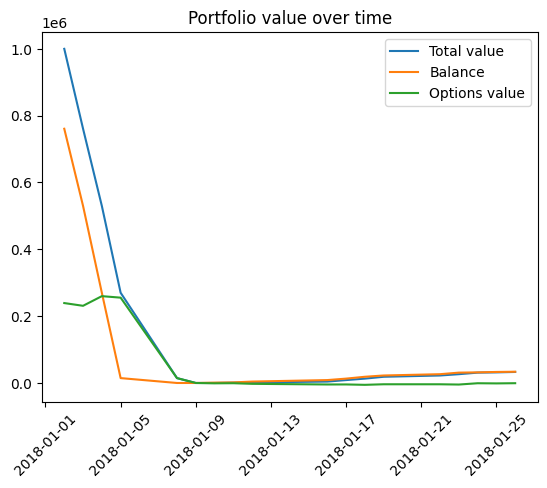

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,3.88684


wandb: Agent Starting Run: ng372tsi with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 25784.87499999994
Number of trades 9332
sharpe_ratio 3.8909764524274877


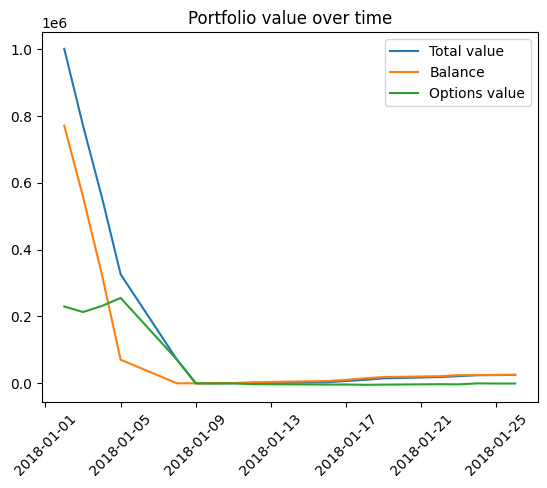

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,3.89098


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 4n32n81h with config:
wandb: 	buy_threshold: 1.01
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.01
sell_threshold 1.1
starting_balance 1000000
Ending balance 18536.345000000154
Number of trades 8348
sharpe_ratio 4.19530491953624


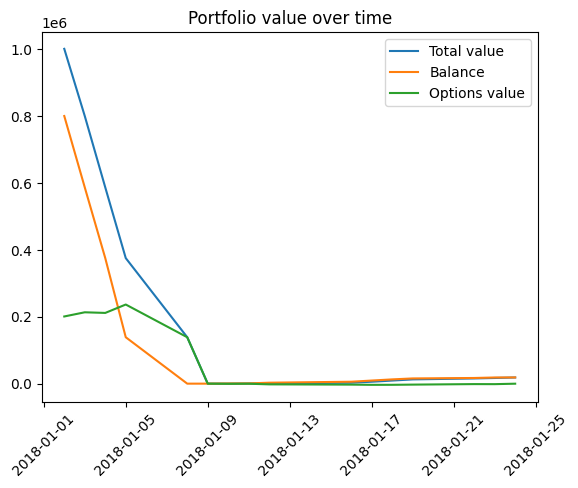

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.01
sell_threshold,1.1
sharpe_ratio,4.1953


wandb: Agent Starting Run: zz4hw1yz with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 404854.5450000032
Number of trades 10474
sharpe_ratio 3.7411602322148383


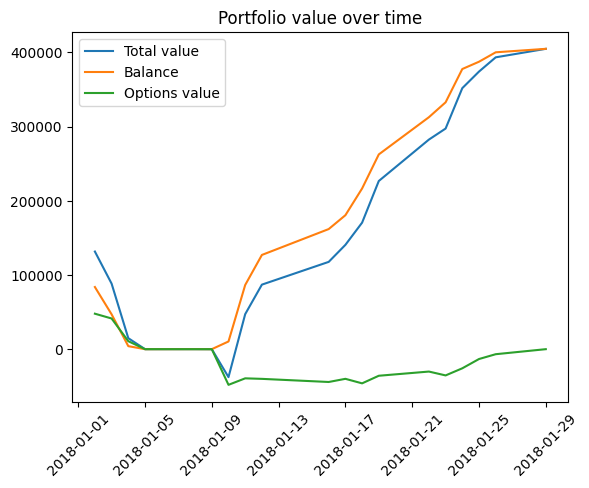

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,3.74116


wandb: Agent Starting Run: 8gzg49sg with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 398969.97500000306
Number of trades 9150
sharpe_ratio -3.9312832042612658


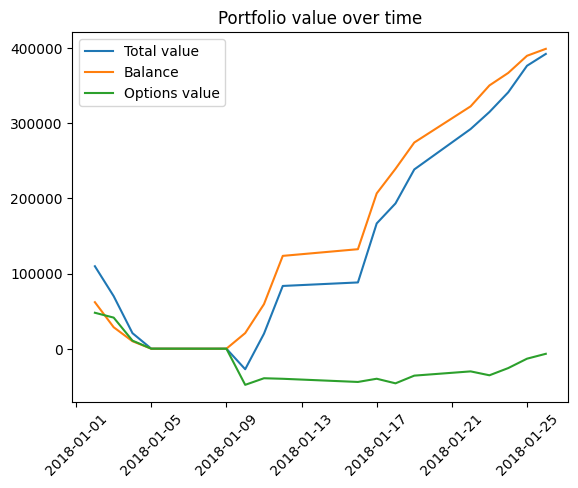

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,-3.93128


wandb: Agent Starting Run: faj4vgah with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 316037.1050000001
Number of trades 8111
sharpe_ratio -3.8494329318116254


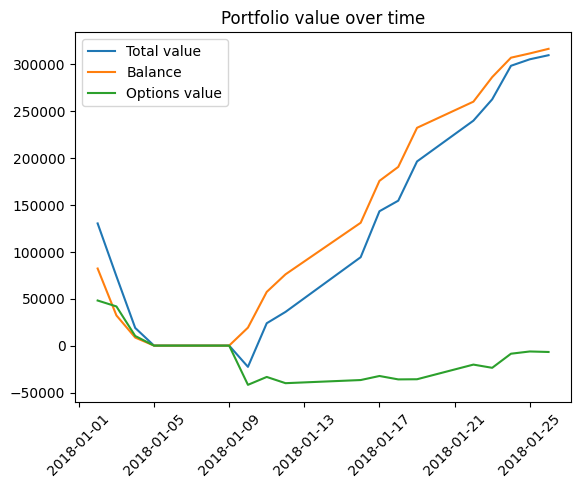

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,-3.84943


wandb: Agent Starting Run: unymj0lq with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 253628.47499999963
Number of trades 7184
sharpe_ratio -4.103765773352263


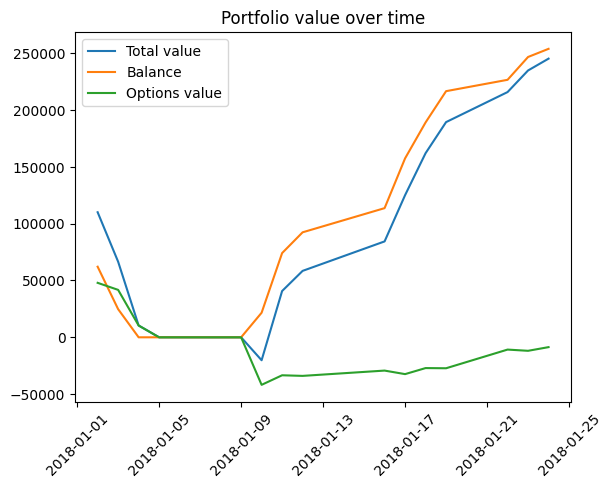

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,-4.10377


wandb: Agent Starting Run: m0zd6jg1 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 1118910.3350000195
Number of trades 10474
sharpe_ratio 1.0303718009570688


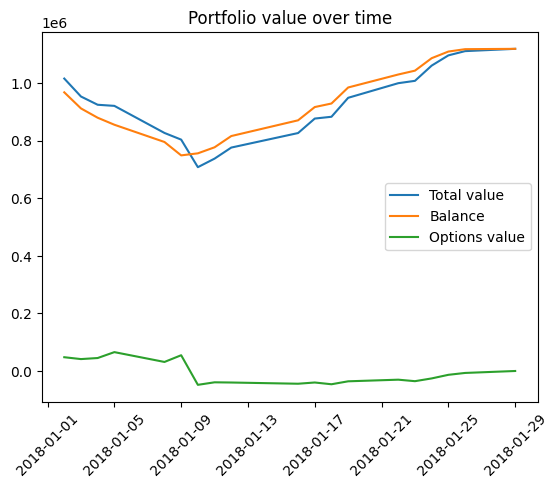

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,1.03037


wandb: Agent Starting Run: clj7qygh with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 1118175.2200000188
Number of trades 9150
sharpe_ratio 0.8361607899552687


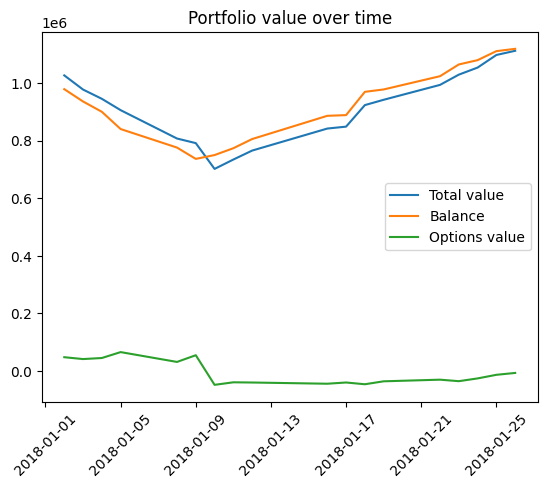

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,0.83616


wandb: Agent Starting Run: h6940ppa with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 1035164.480000018
Number of trades 8111
sharpe_ratio -0.17945628769971406


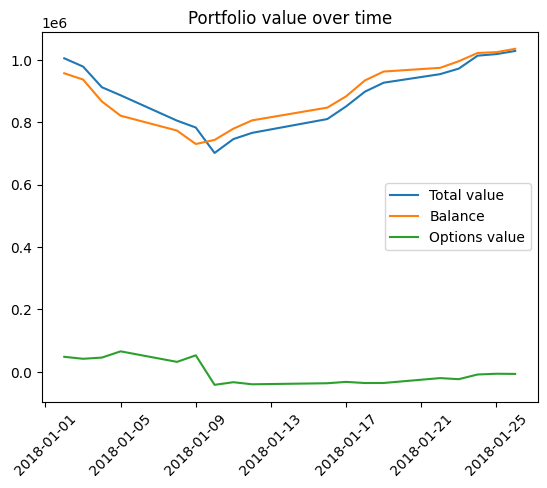

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,-0.17946


wandb: Agent Starting Run: 6bxgv7j5 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 971612.920000016
Number of trades 7184
sharpe_ratio -1.5611531540181176


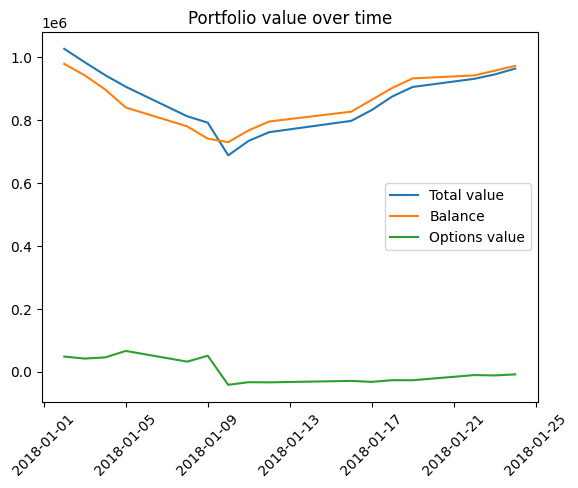

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,-1.56115


wandb: Agent Starting Run: u4om3rld with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 253774.67999999807
Number of trades 9673
sharpe_ratio 3.562323283575897


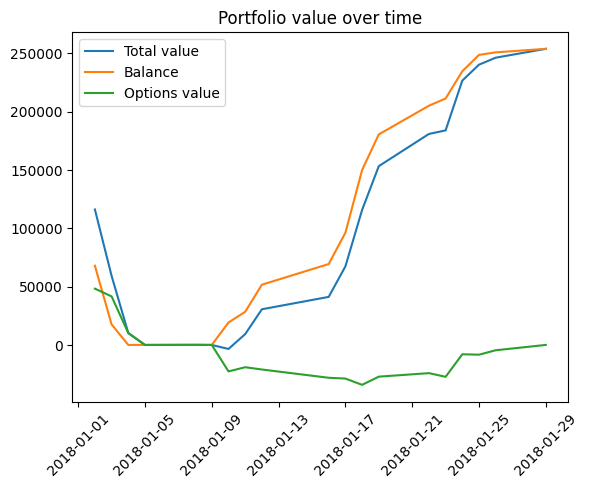

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,3.56232


wandb: Agent Starting Run: has8op03 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 250976.20499999807
Number of trades 8472
sharpe_ratio -4.2784305673845


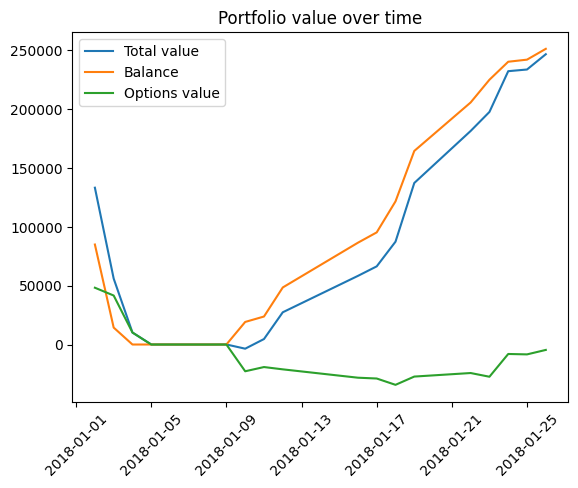

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-4.27843


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: huujf6am with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 200064.57999999938
Number of trades 7552
sharpe_ratio -3.847531125105174


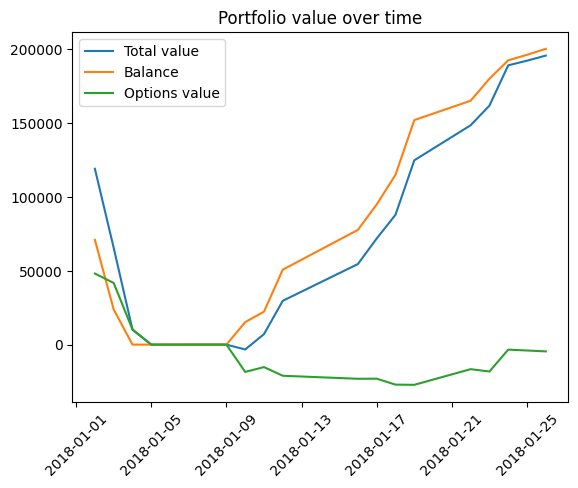

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-3.84753


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: edi0zntz with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 151724.41499999975
Number of trades 6706
sharpe_ratio -4.061619589195431


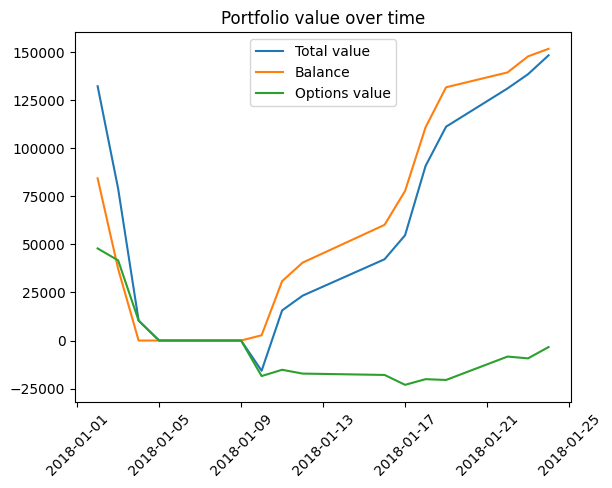

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-4.06162


wandb: Agent Starting Run: 51o02t5d with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 965627.8450000263
Number of trades 9673
sharpe_ratio -1.8665810474453763


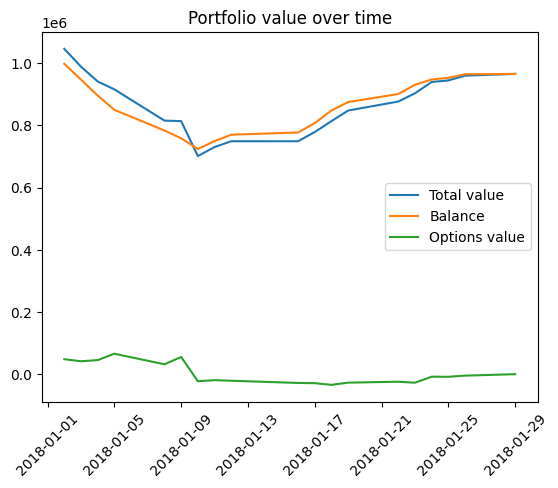

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-1.86658


wandb: Agent Starting Run: ik8xvigc with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 961987.5750000263
Number of trades 8472
sharpe_ratio -1.8867890930929114


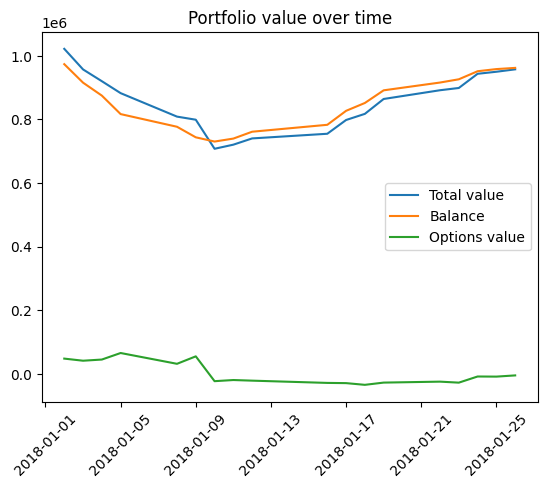

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-1.88679


wandb: Agent Starting Run: orkstedr with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 913565.0700000183
Number of trades 7552
sharpe_ratio -3.37269865315306


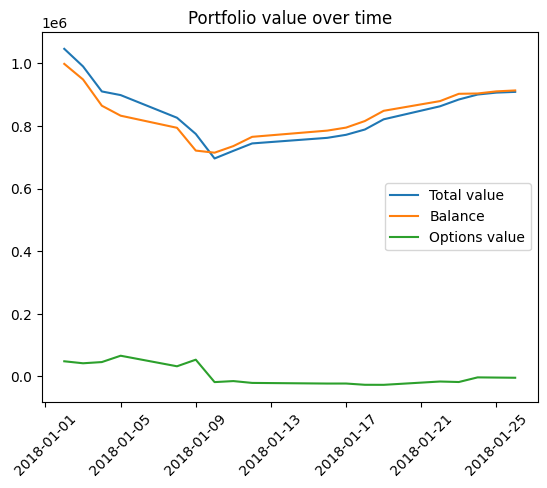

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-3.3727


wandb: Agent Starting Run: a5wc3xux with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 868447.8900000162
Number of trades 6706
sharpe_ratio -4.307909854745303


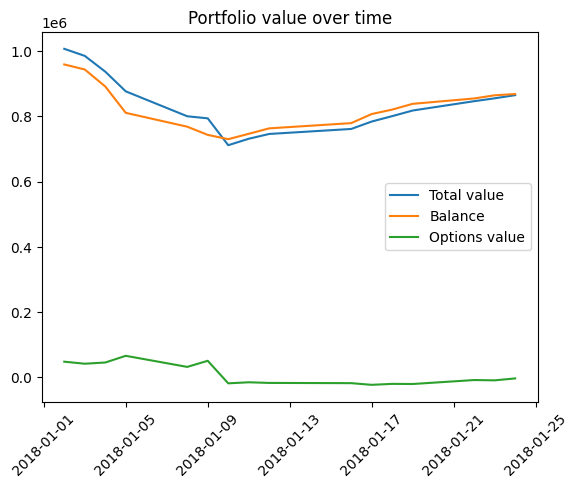

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-4.30791


wandb: Agent Starting Run: cmxu2tck with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 122466.01499999923
Number of trades 8692
sharpe_ratio -2.943506258942904


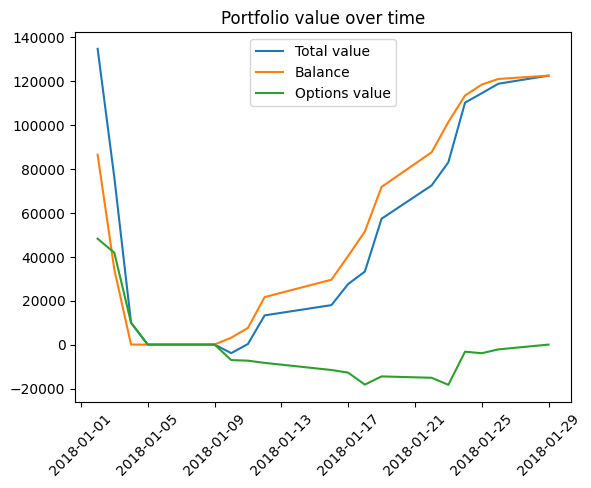

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-2.94351


wandb: Agent Starting Run: cn19n2l2 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 121544.37499999948
Number of trades 7684
sharpe_ratio -3.656975079737642


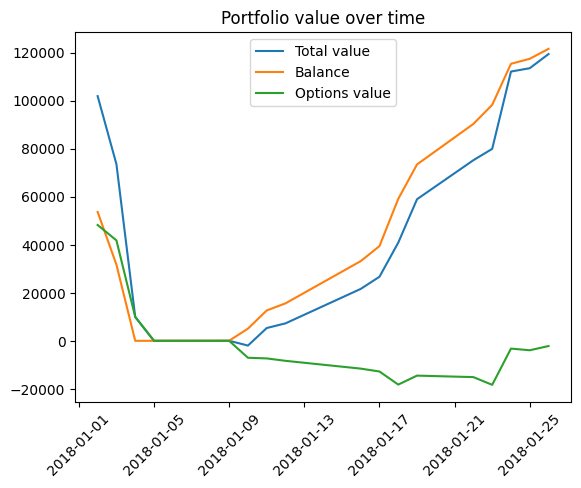

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-3.65698


wandb: Agent Starting Run: vdxxspla with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 95325.13500000013
Number of trades 6914
sharpe_ratio -3.825986102025481


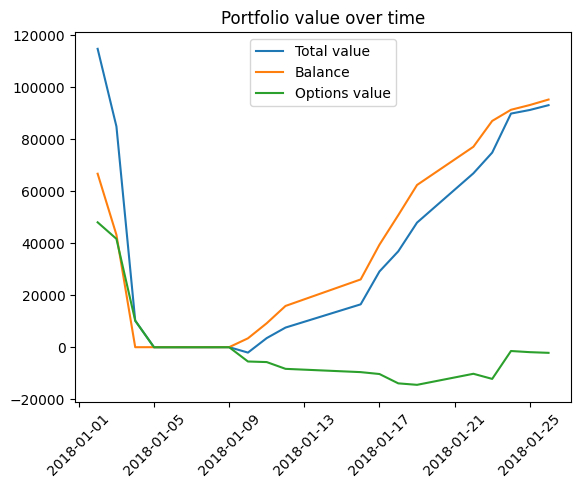

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-3.82599


wandb: Agent Starting Run: i21547du with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 69532.21500000017
Number of trades 6185
sharpe_ratio -4.49764181870924


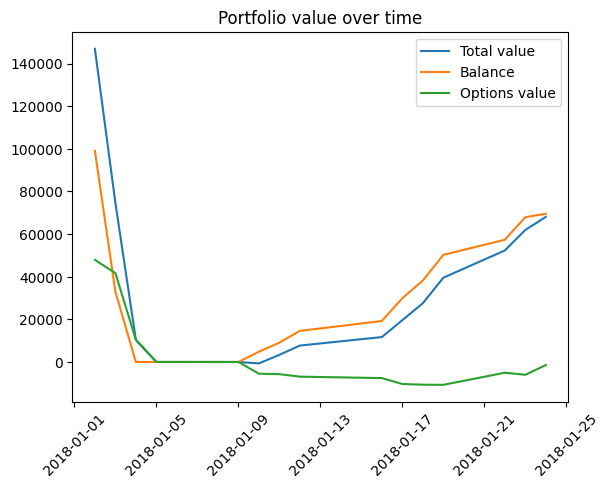

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-4.49764


wandb: Agent Starting Run: c2pzgin1 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 832694.170000029
Number of trades 8692
sharpe_ratio -6.0852118232064765


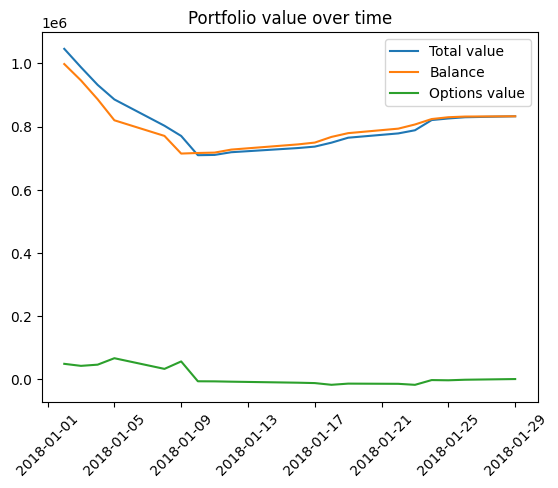

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-6.08521


wandb: Agent Starting Run: juhl3tjx with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 831366.1800000288
Number of trades 7684
sharpe_ratio -4.478219183518945


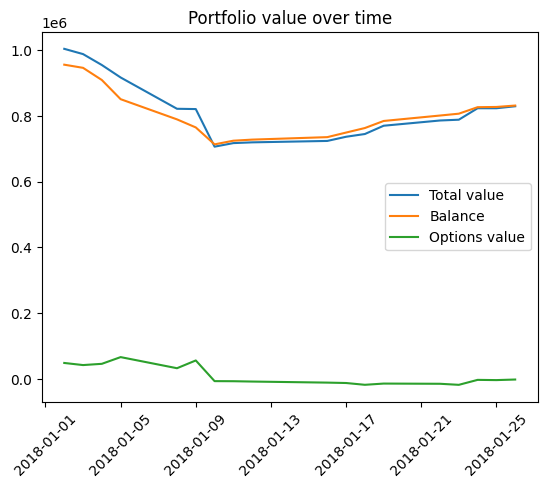

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-4.47822


wandb: Agent Starting Run: 677ufjid with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 807713.4950000208
Number of trades 6914
sharpe_ratio -6.782745335750832


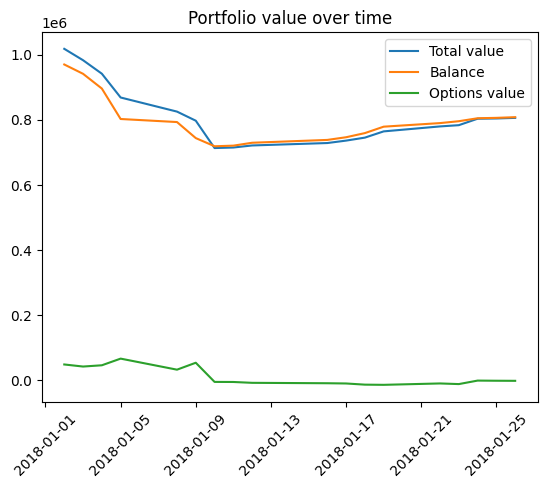

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-6.78275


wandb: Agent Starting Run: i5jt1bkj with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 785665.4150000173
Number of trades 6185
sharpe_ratio -7.417878325073552


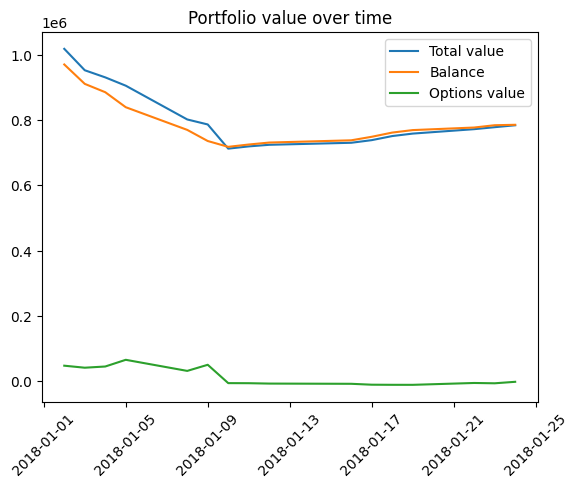

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-7.41788


wandb: Agent Starting Run: p45gsyip with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 69257.50000000015
Number of trades 8147
sharpe_ratio 3.733846140845527


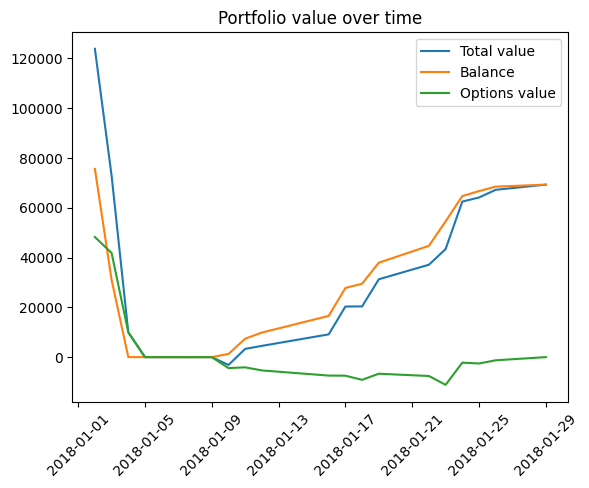

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,3.73385


wandb: Agent Starting Run: l8da15mr with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 69061.01000000014
Number of trades 7282
sharpe_ratio 3.7858637637798243


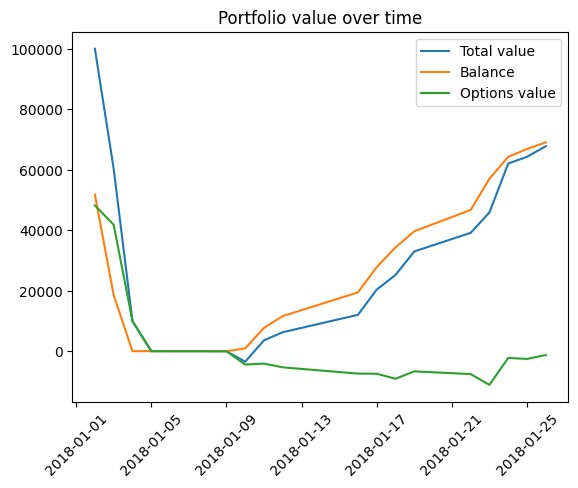

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,3.78586


wandb: Agent Starting Run: 1atquy08 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 53318.08000000031
Number of trades 6587
sharpe_ratio -3.391722430006913


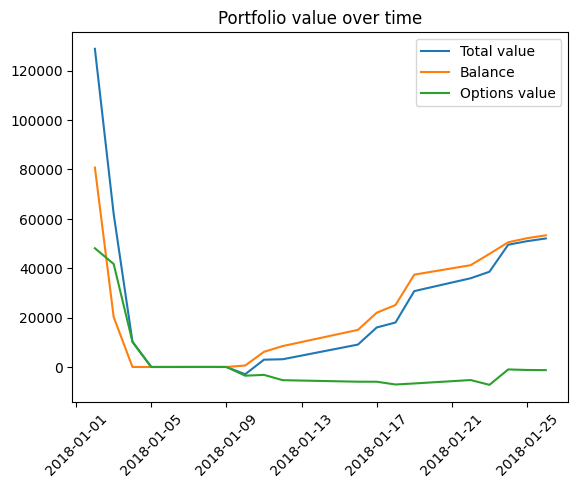

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-3.39172


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: d1h19hro with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 39321.63000000018
Number of trades 5933
sharpe_ratio -4.100221030035214


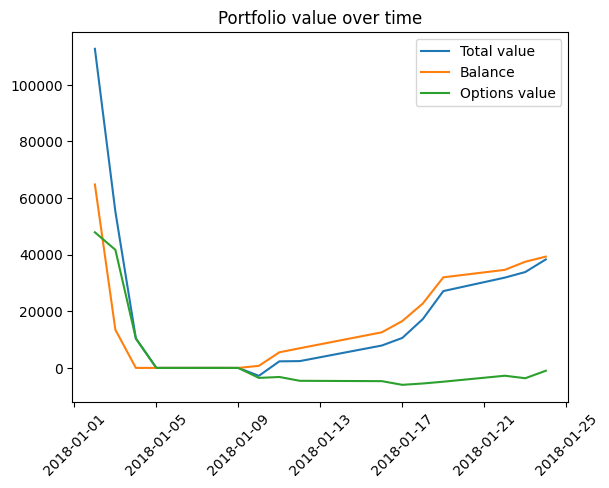

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-4.10022


wandb: Agent Starting Run: bha7o9n9 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 779155.6750000296
Number of trades 8147
sharpe_ratio -7.2620525744199345


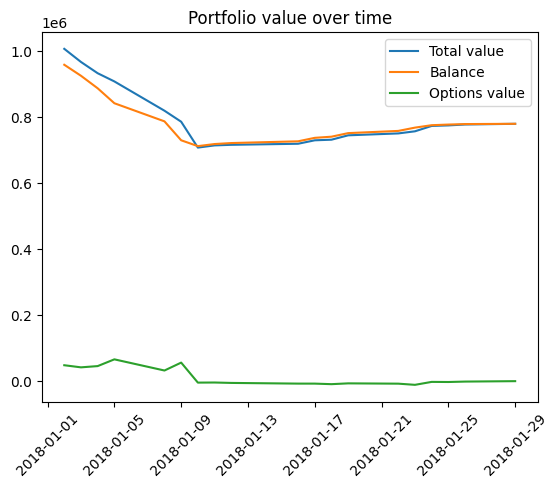

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-7.26205


wandb: Agent Starting Run: cnfm5px3 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 777985.1700000295
Number of trades 7282
sharpe_ratio -6.866506021713865


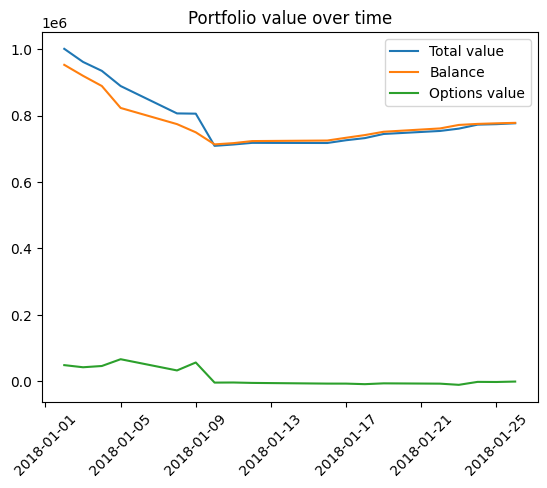

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-6.86651


wandb: Agent Starting Run: 6af25lh5 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 766523.9200000219
Number of trades 6587
sharpe_ratio -8.738017538897255


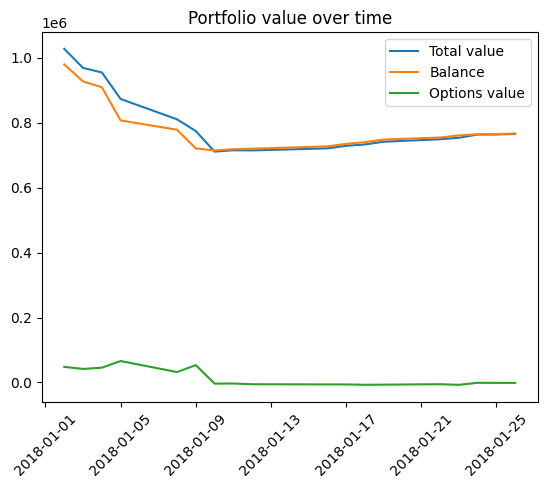

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-8.73802


wandb: Agent Starting Run: 9wedj0cl with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 755846.3250000173
Number of trades 5933
sharpe_ratio -8.341911369565384


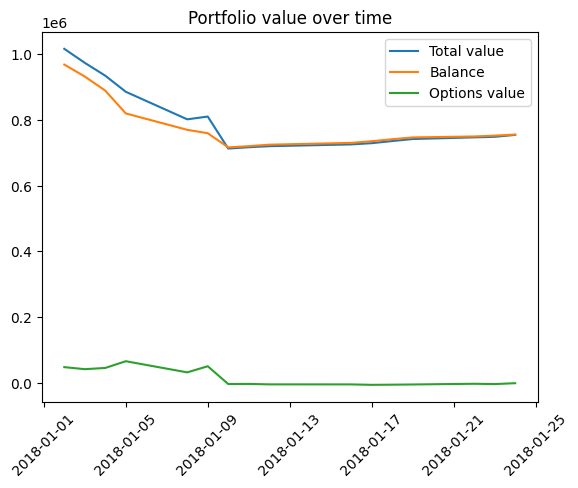

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-8.34191


wandb: Agent Starting Run: 6y3tq34l with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 34585.85500000016
Number of trades 7556
sharpe_ratio 5.000699796651916


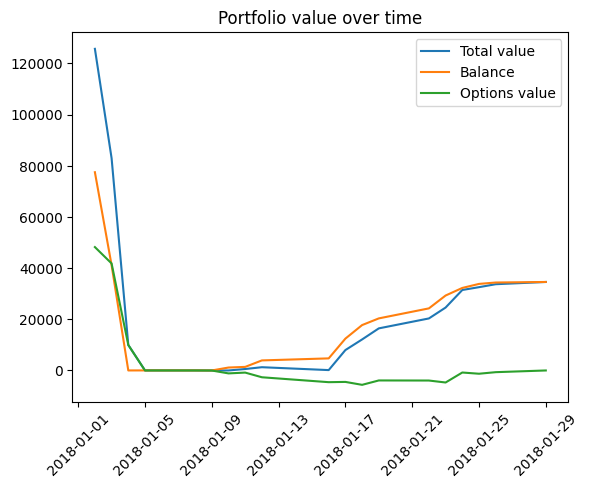

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,5.0007


wandb: Agent Starting Run: 75p5mcd7 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 34438.280000000144
Number of trades 6882
sharpe_ratio 4.142373710957308


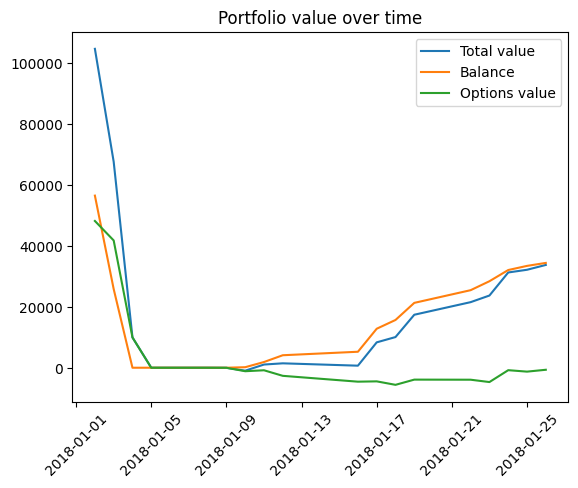

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,4.14237


wandb: Agent Starting Run: znv67s36 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 25984.2000000002
Number of trades 6256
sharpe_ratio 4.6203729194008405


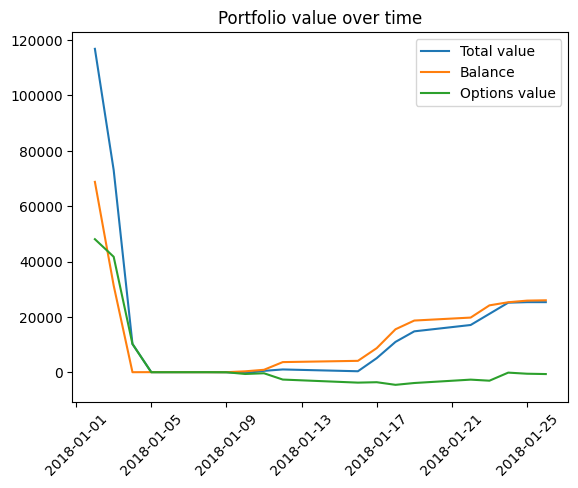

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,4.62037


wandb: Agent Starting Run: d5h3n3av with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 19292.110000000146
Number of trades 5659
sharpe_ratio -4.153887513072323


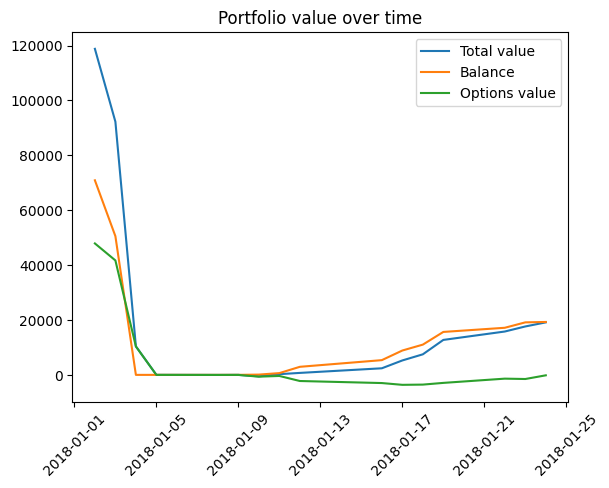

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-4.15389


wandb: Agent Starting Run: 8j75adtp with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 744429.0850000286
Number of trades 7556
sharpe_ratio -7.523962895755301


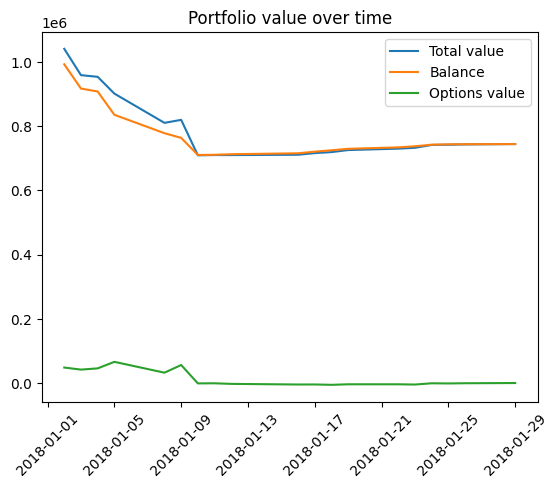

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-7.52396


wandb: Agent Starting Run: 11p7akju with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 743834.5100000286
Number of trades 6882
sharpe_ratio -8.272893301966802


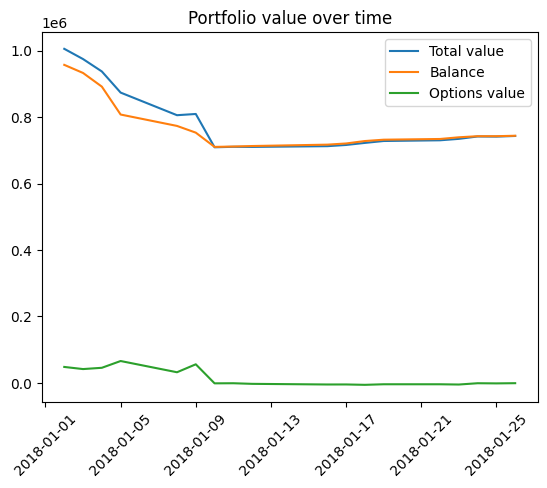

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-8.27289


wandb: Agent Starting Run: 4huxvfsi with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 739415.630000021
Number of trades 6256
sharpe_ratio -9.663483651895463


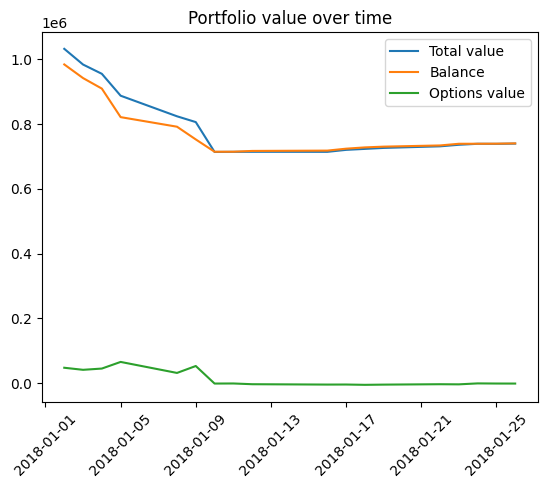

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-9.66348


wandb: Agent Starting Run: xa0valp5 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 735662.8500000169
Number of trades 5659
sharpe_ratio -11.575876130064913


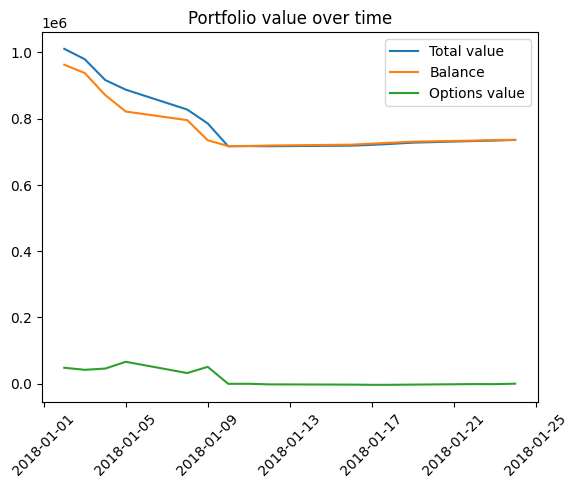

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-11.57588


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 7a14qzus with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 404607.48500000045
Number of trades 10474
sharpe_ratio 3.746283552864625


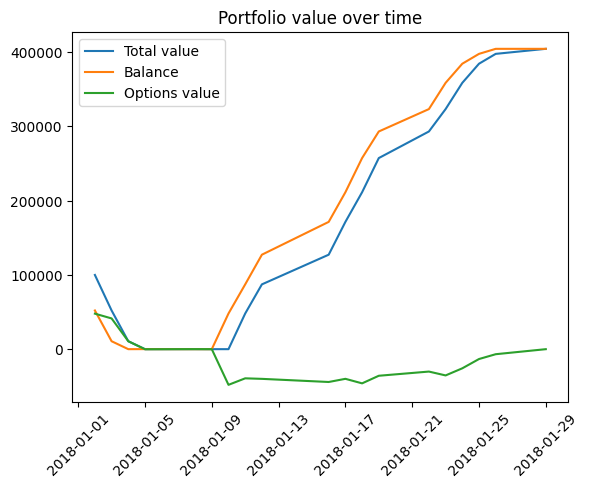

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,3.74628


wandb: Agent Starting Run: 4bvxlbkv with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 404666.38500000077
Number of trades 9150
sharpe_ratio 4.054930389130359


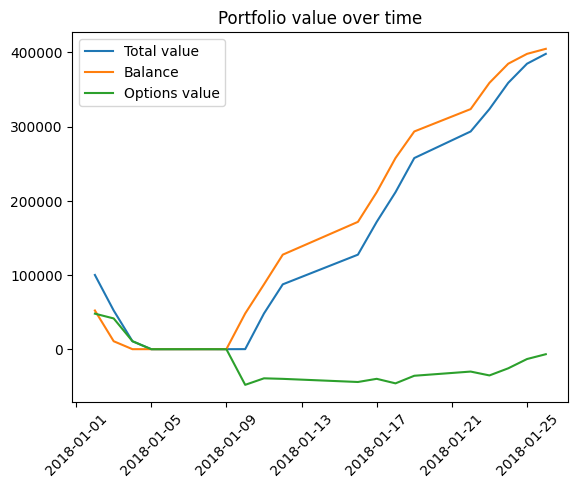

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,4.05493


wandb: Agent Starting Run: iv255tvm with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 321296.54499999987
Number of trades 8111
sharpe_ratio 3.8511583526766544


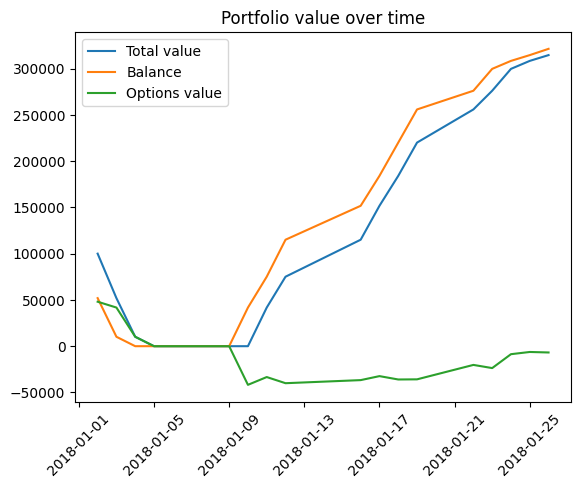

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,3.85116


wandb: Agent Starting Run: mo0ibr7g with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 255957.91500000044
Number of trades 7184
sharpe_ratio 4.098701324004557


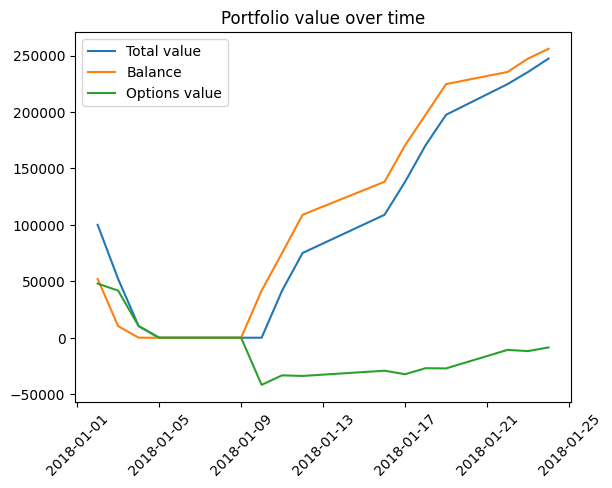

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,4.0987


wandb: Agent Starting Run: s1d5n3u3 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 1118397.1399999985
Number of trades 10474
sharpe_ratio 1.3424743422167675


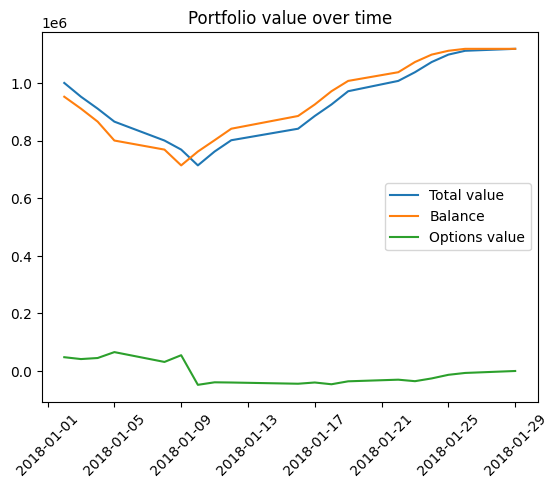

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,1.34247


wandb: Agent Starting Run: jb8mj2kz with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 1118397.1400000006
Number of trades 9150
sharpe_ratio 1.3244163880673228


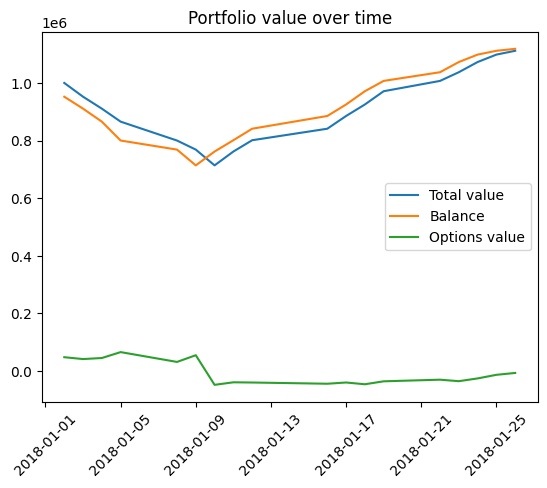

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,1.32442


wandb: Agent Starting Run: komgpq00 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 1035585.2599999957
Number of trades 8111
sharpe_ratio -0.20316337676842938


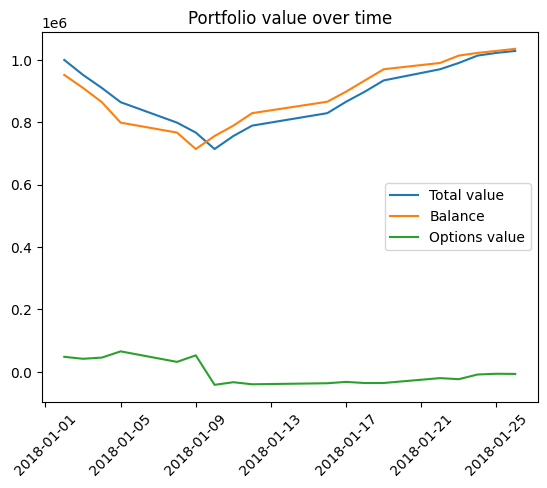

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,-0.20316


wandb: Agent Starting Run: anxi8vp8 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 972130.139999999
Number of trades 7184
sharpe_ratio -1.6143390971384406


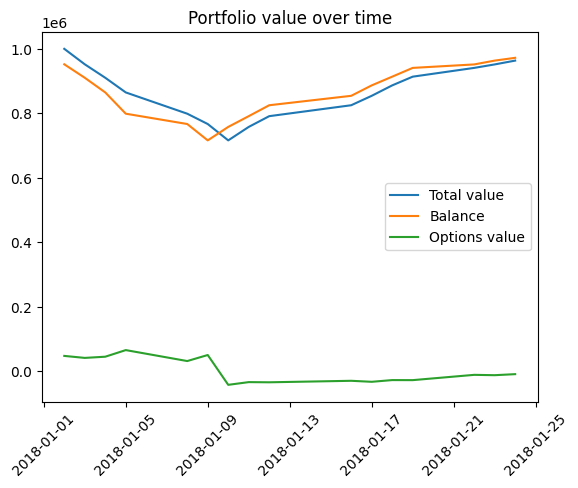

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,-1.61434


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: e6tk0zma with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 253571.8049999999
Number of trades 9673
sharpe_ratio 3.8908137868545256


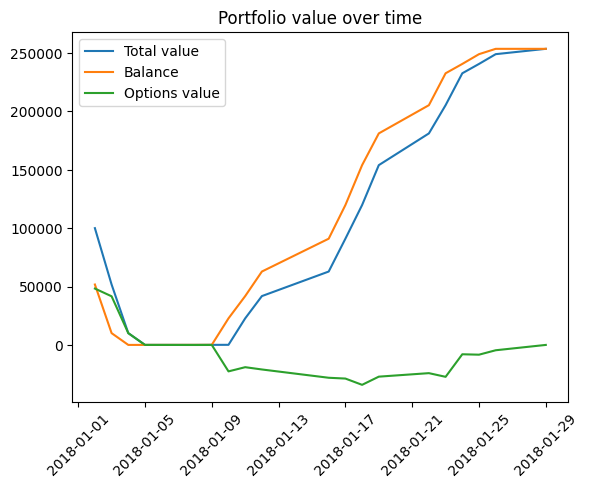

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,3.89081


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: c3yimhwm with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 253510.2999999997
Number of trades 8472
sharpe_ratio 3.8789992878485995


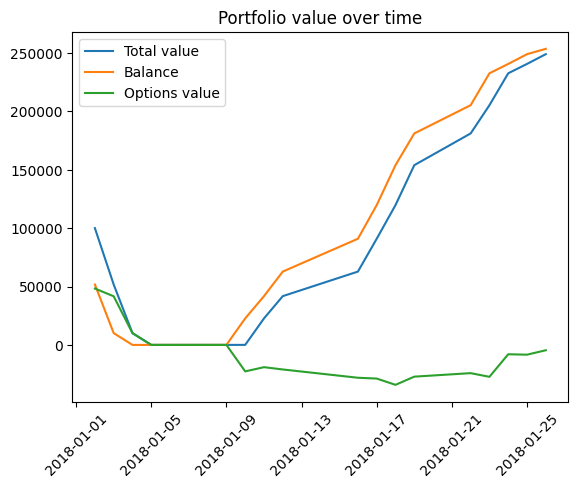

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,3.879


wandb: Agent Starting Run: f6y9bwak with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 201581.7350000003
Number of trades 7552
sharpe_ratio 3.8506153604964535


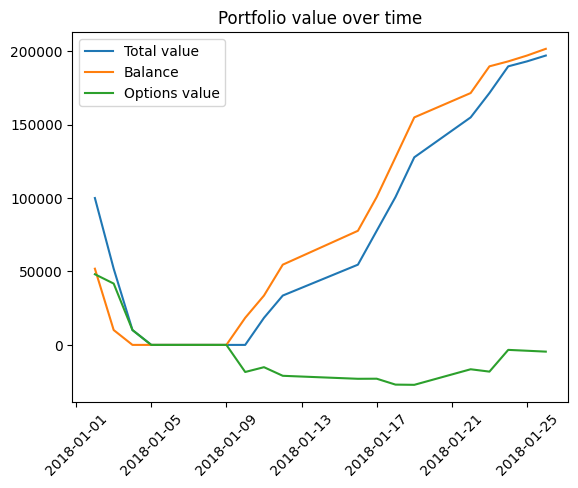

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,3.85062


wandb: Agent Starting Run: 3nx84j3m with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 153150.245
Number of trades 6706
sharpe_ratio 4.100915737915839


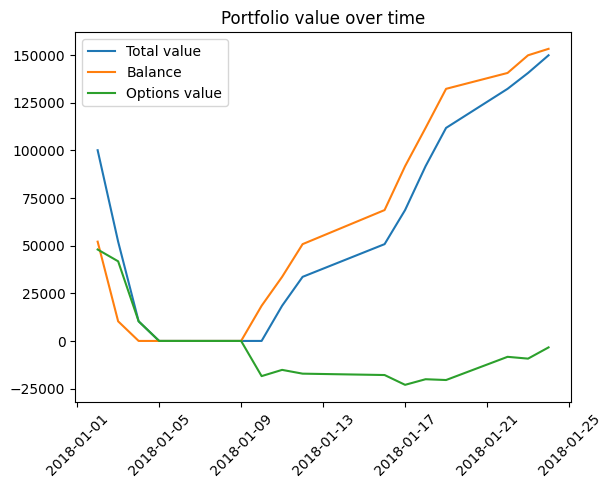

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,4.10092


wandb: Agent Starting Run: wv3cxykk with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 965114.6499999973
Number of trades 9673
sharpe_ratio -1.706642993973186


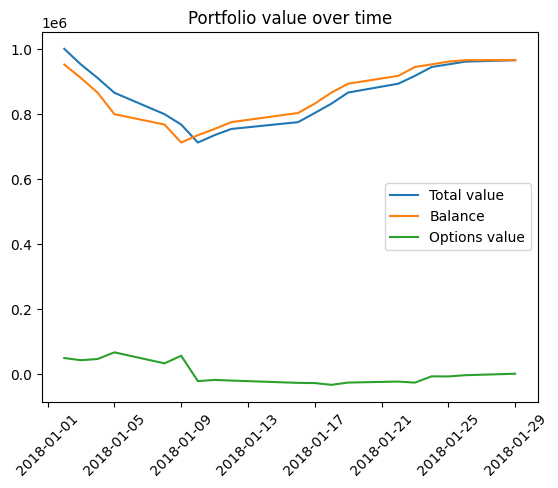

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-1.70664


wandb: Agent Starting Run: r9k5u8vf with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 965114.6499999973
Number of trades 8472
sharpe_ratio -1.7883828266074135


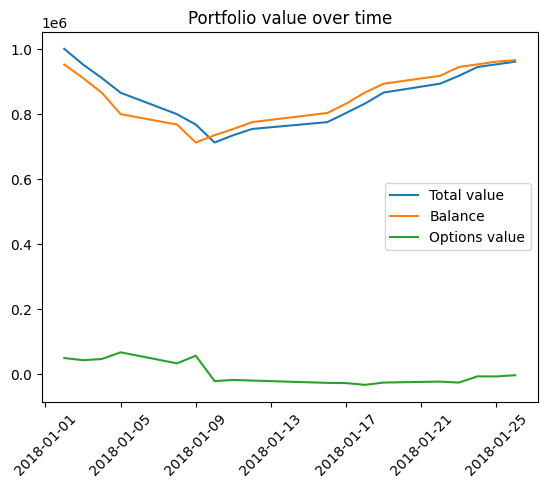

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-1.78838


wandb: Agent Starting Run: y4rdumam with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 914880.1999999959
Number of trades 7552
sharpe_ratio -3.213078674008675


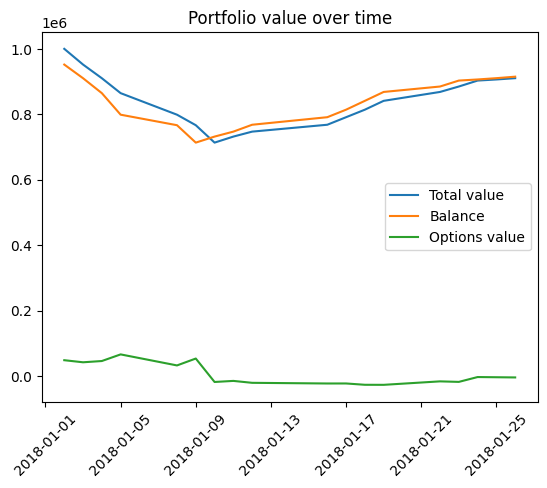

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-3.21308


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 53hugnbx with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 869302.1899999988
Number of trades 6706
sharpe_ratio -4.867529623109429


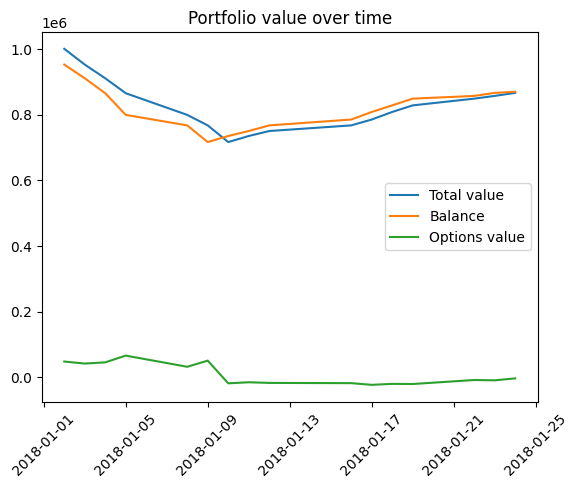

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-4.86753


wandb: Agent Starting Run: pecuj4r6 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 122218.87500000006
Number of trades 8692
sharpe_ratio 3.7657614953850995


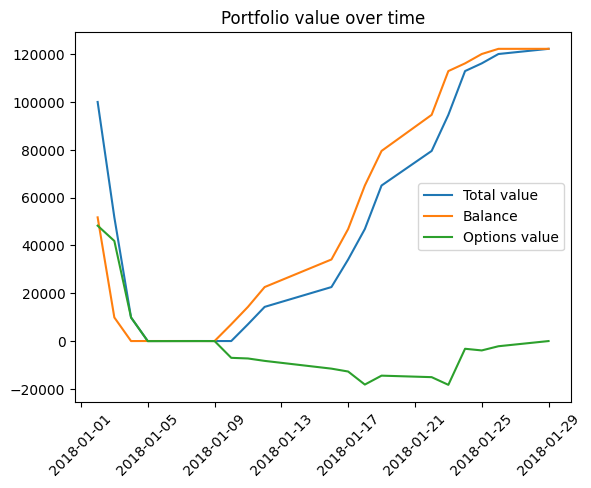

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,3.76576


wandb: Agent Starting Run: ymmls831 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 122223.11499999998
Number of trades 7684
sharpe_ratio 3.893812195563243


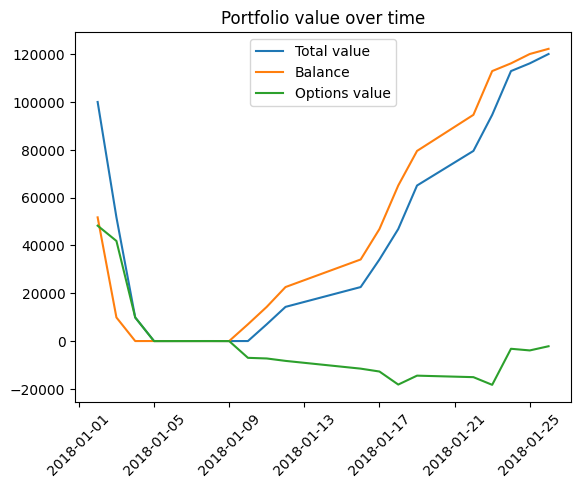

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,3.89381


wandb: Agent Starting Run: bgyk8j38 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 95562.99000000024
Number of trades 6914
sharpe_ratio 3.855496381927252


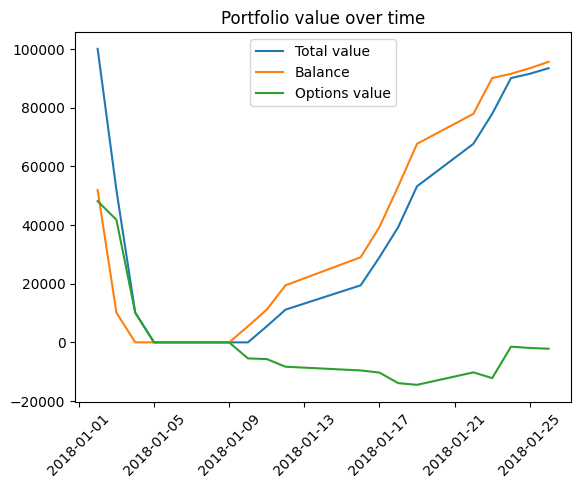

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,3.8555


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: xrgm7fkw with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 69664.64500000002
Number of trades 6185
sharpe_ratio 4.291635750790867


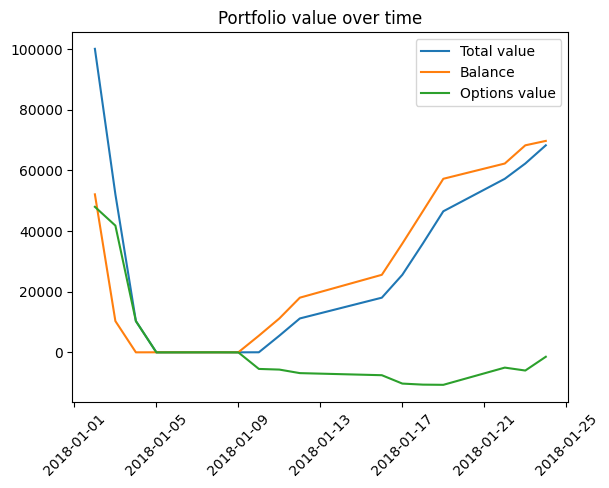

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,4.29164


wandb: Agent Starting Run: x015qhus with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 832180.9750000001
Number of trades 8692
sharpe_ratio -5.843661511071524


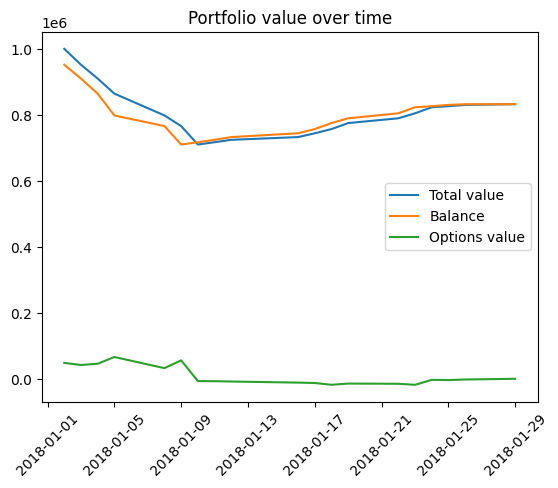

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-5.84366


wandb: Agent Starting Run: yhpbp8ed with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 832180.9750000001
Number of trades 7684
sharpe_ratio -6.010234874411063


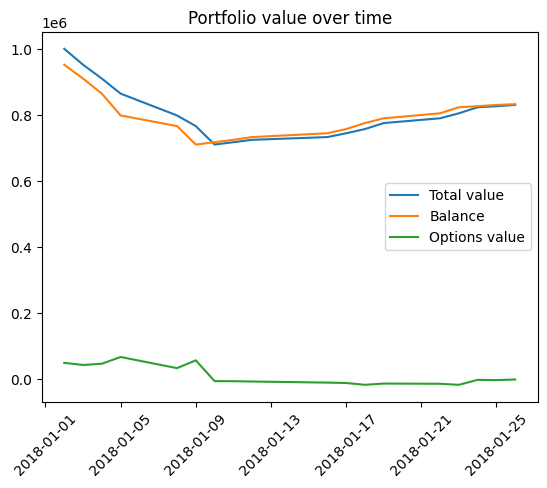

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-6.01023


wandb: Agent Starting Run: arpp34sw with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 808419.3549999982
Number of trades 6914
sharpe_ratio -7.177440341681006


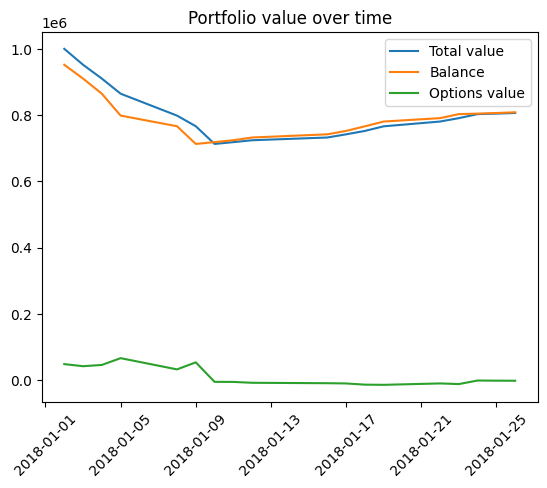

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-7.17744


wandb: Agent Starting Run: wp8dx2az with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 785793.3699999999
Number of trades 6185
sharpe_ratio -8.858116208931664


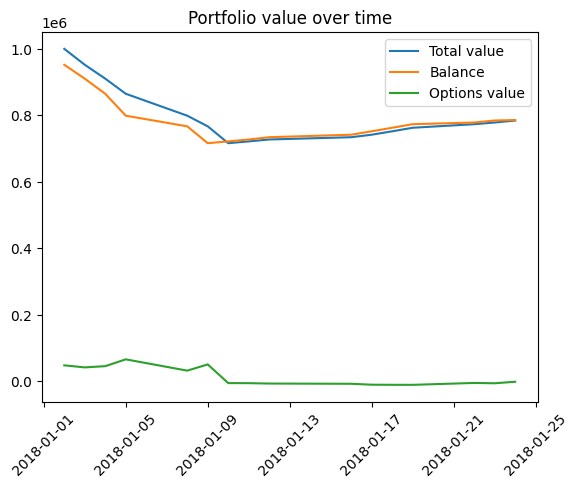

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-8.85812


wandb: Agent Starting Run: 7rqqabiv with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 69036.10500000033
Number of trades 8147
sharpe_ratio 3.7934025118389


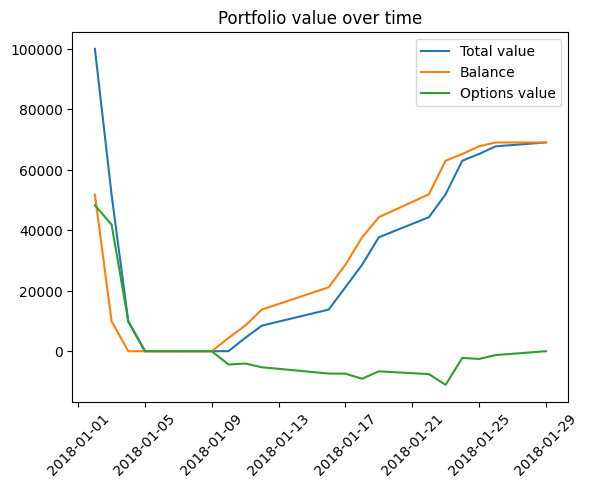

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,3.7934


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: yzlcbglf with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 69011.9600000004
Number of trades 7282
sharpe_ratio 3.879041878216827


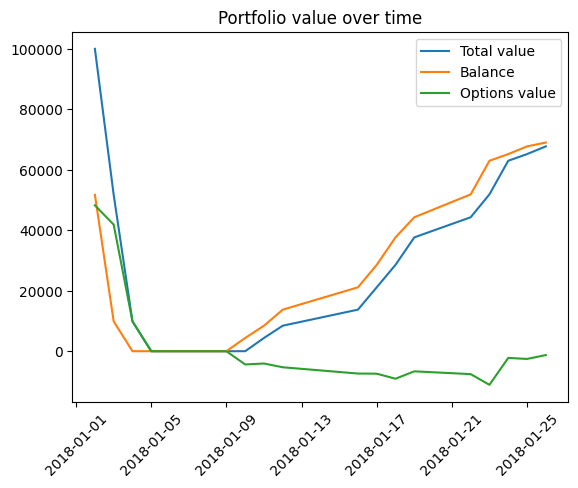

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,3.87904


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: yh7s3y6r with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 53492.85000000009
Number of trades 6587
sharpe_ratio 3.8574061980341603


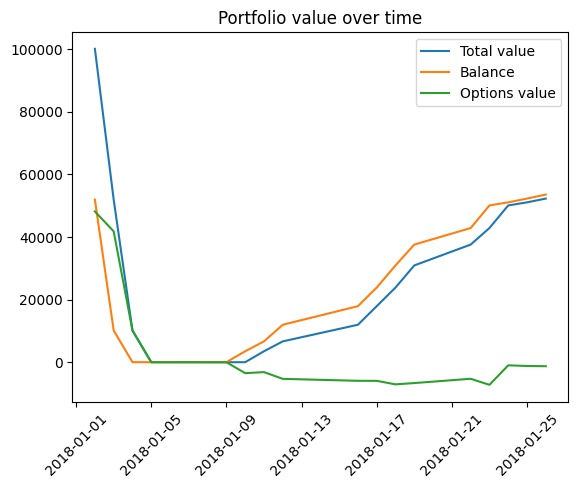

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,3.85741


wandb: Agent Starting Run: 49htfjg7 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 39441.9300000001
Number of trades 5933
sharpe_ratio 4.155793046511022


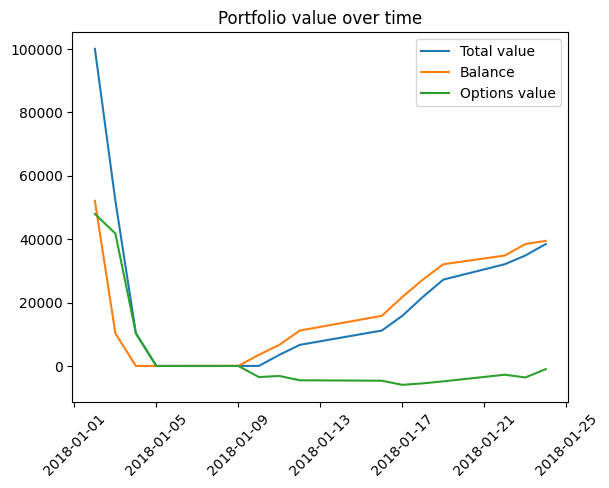

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,4.15579


wandb: Agent Starting Run: ioxun4qg with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 778642.4800000007
Number of trades 8147
sharpe_ratio -8.2339271928244


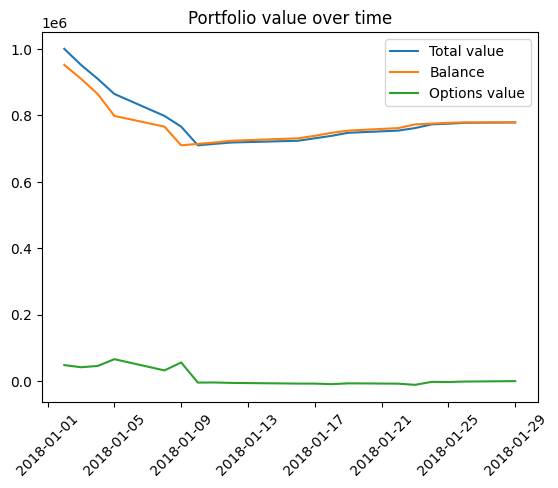

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-8.23393


wandb: Agent Starting Run: q7tbv9dq with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 778642.4800000007
Number of trades 7282
sharpe_ratio -8.471856907517084


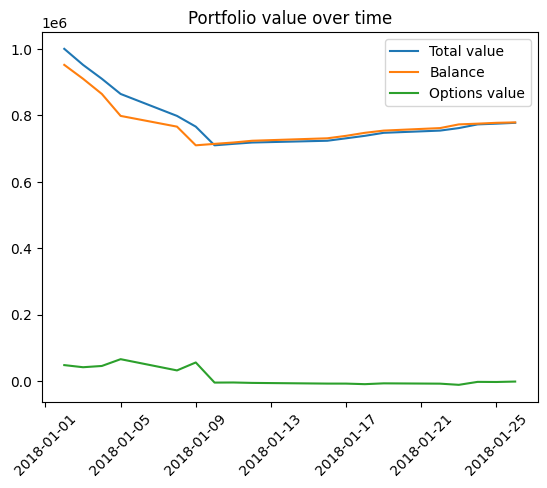

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-8.47186


wandb: Agent Starting Run: xfdymhez with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 766278.7649999997
Number of trades 6587
sharpe_ratio -9.33168763782556


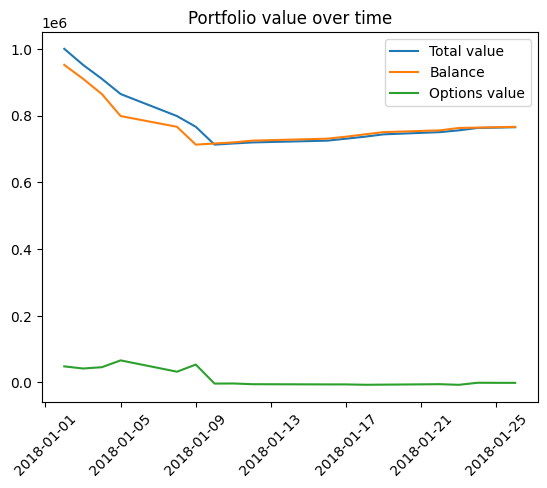

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-9.33169


wandb: Agent Starting Run: 6u36lu20 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 755561.3200000001
Number of trades 5933
sharpe_ratio -10.78189129409941


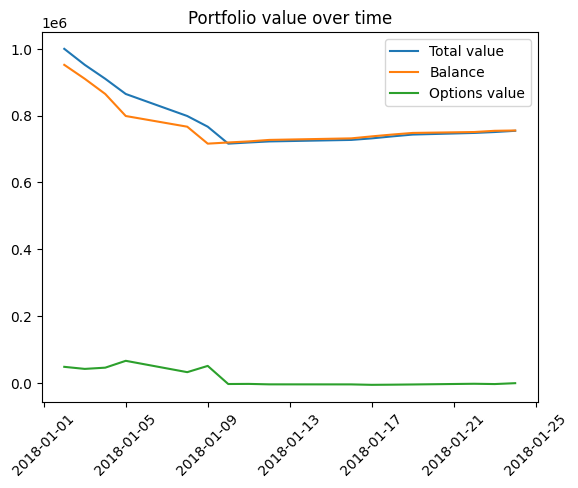

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-10.78189


wandb: Agent Starting Run: 9eg64iq7 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 34345.36000000013
Number of trades 7556
sharpe_ratio 4.013905178325401


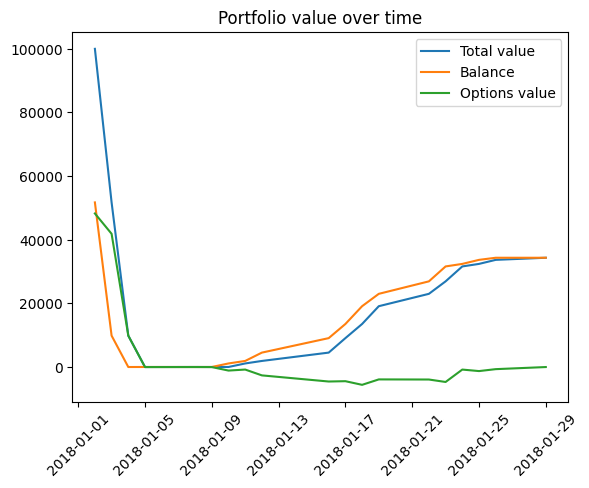

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,4.01391


wandb: Agent Starting Run: 5xegyt3h with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 34336.93000000017
Number of trades 6882
sharpe_ratio 3.9894603790799104


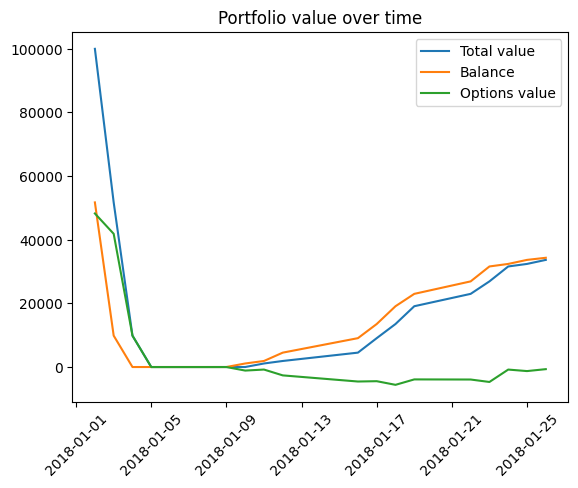

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,3.98946


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: v5lc5p71 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 26426.295000000093
Number of trades 6256
sharpe_ratio 4.10999590202921


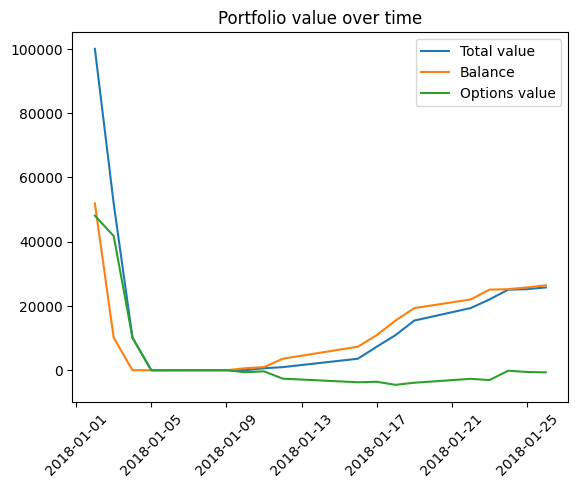

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,4.11


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 8ekcdd2s with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 19096.365000000016
Number of trades 5659
sharpe_ratio 4.213692751960866


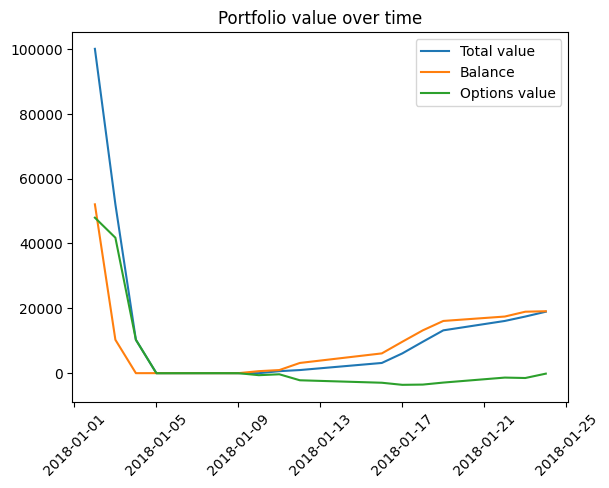

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,4.21369


wandb: Agent Starting Run: ez33npww with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 743915.8899999997
Number of trades 7556
sharpe_ratio -10.091188387207541


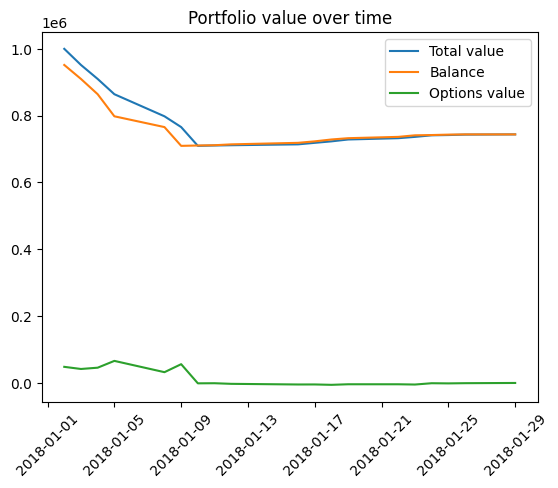

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-10.09119


wandb: Agent Starting Run: nzqdv8a7 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 743915.8899999997
Number of trades 6882
sharpe_ratio -10.397751158205347


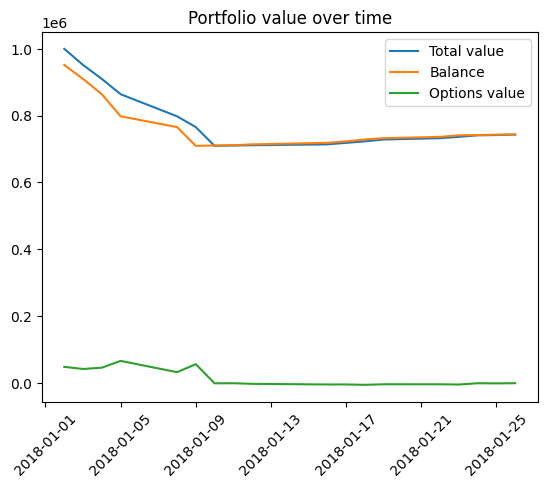

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-10.39775


wandb: Agent Starting Run: 66623d5q with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 739196.9699999986
Number of trades 6256
sharpe_ratio -10.929853750010253


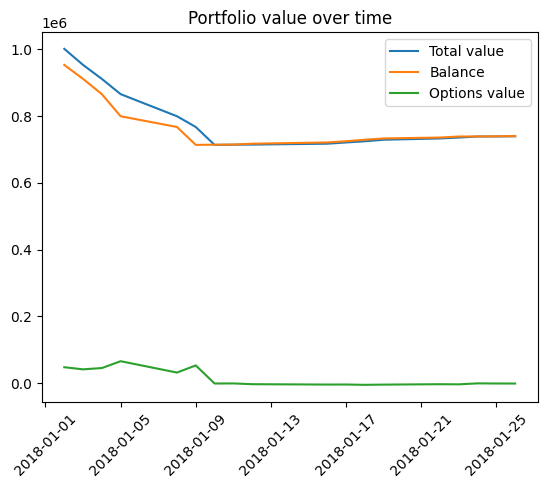

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-10.92985


wandb: Agent Starting Run: 4lkeexud with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 1
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 735216.8349999996
Number of trades 5659
sharpe_ratio -12.213418904660061


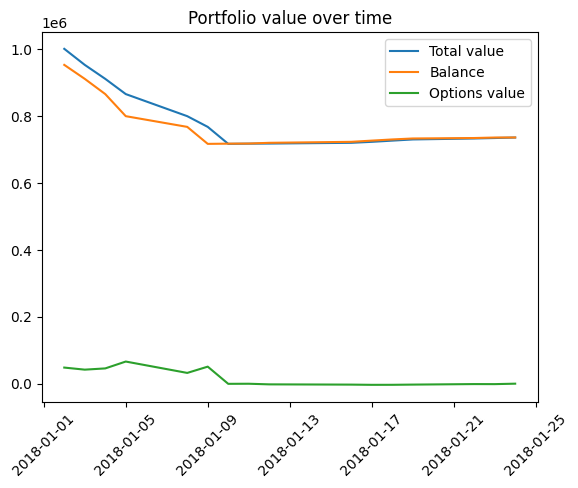

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-12.21342


wandb: Agent Starting Run: klvawhu6 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 404295.89500000066
Number of trades 10474
sharpe_ratio 3.7475354966893866


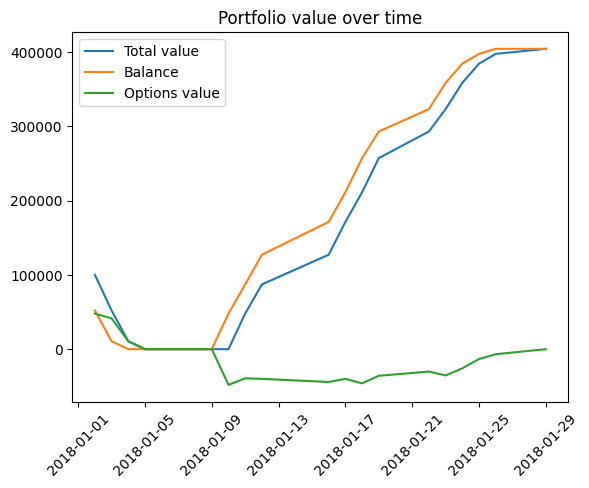

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,3.74754


wandb: Agent Starting Run: wxs0gxm7 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 404356.6600000005
Number of trades 9150
sharpe_ratio 4.026000803366023


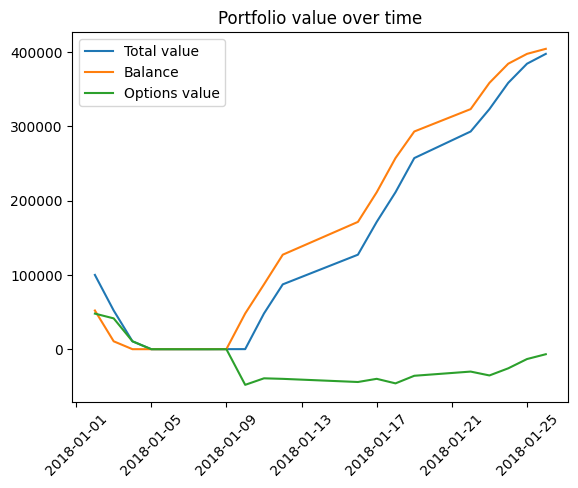

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,4.026


wandb: Agent Starting Run: cmk7xu7y with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 321018.23499999987
Number of trades 8111
sharpe_ratio 3.870822356001105


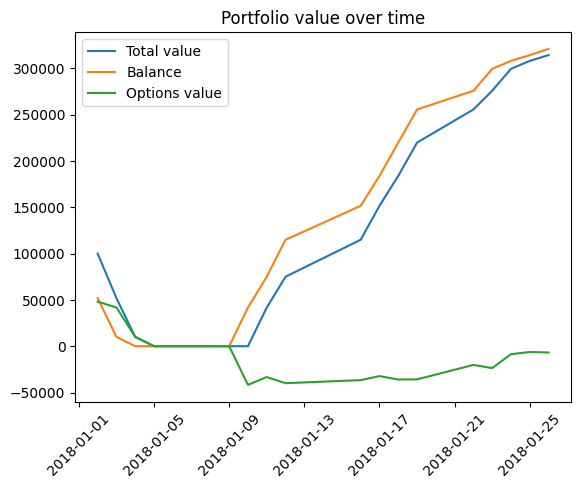

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,3.87082


wandb: Agent Starting Run: jsei79sx with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 255717.46000000028
Number of trades 7184
sharpe_ratio 4.106904750919098


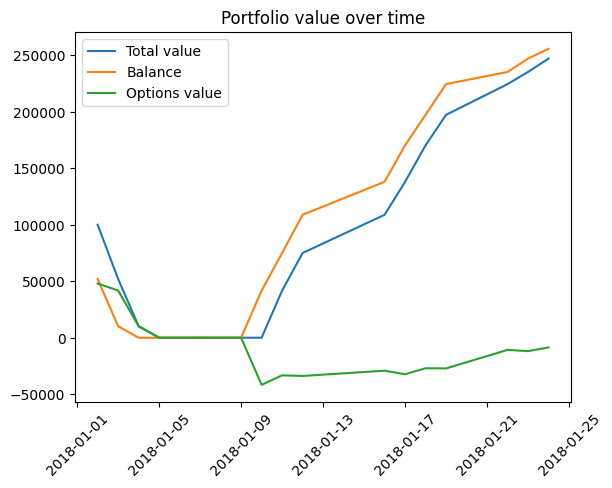

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,4.1069


wandb: Agent Starting Run: sw2wfmxs with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 1117743.8899999978
Number of trades 10474
sharpe_ratio 1.3313603267964726


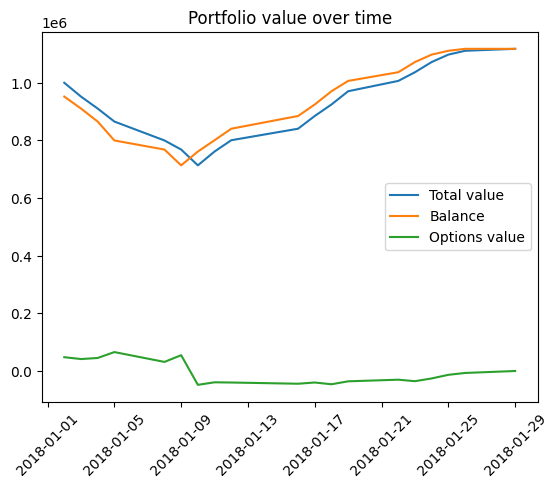

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,1.33136


wandb: Agent Starting Run: sw0b8lao with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 1117743.8899999992
Number of trades 9150
sharpe_ratio 1.3130351495491728


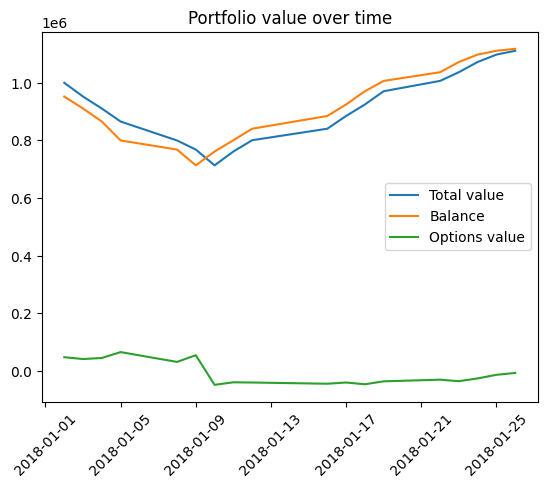

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,1.31304


wandb: Agent Starting Run: oqxbdgar with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 1034958.2649999948
Number of trades 8111
sharpe_ratio -0.21485769452793727


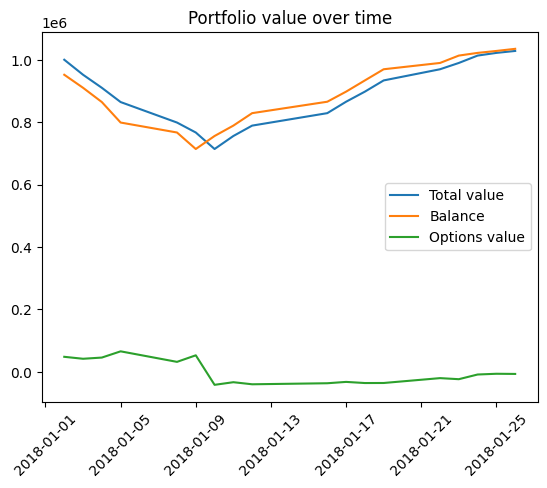

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,-0.21486


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 7pxmaaz4 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 971546.099999998
Number of trades 7184
sharpe_ratio -1.6265249758345535


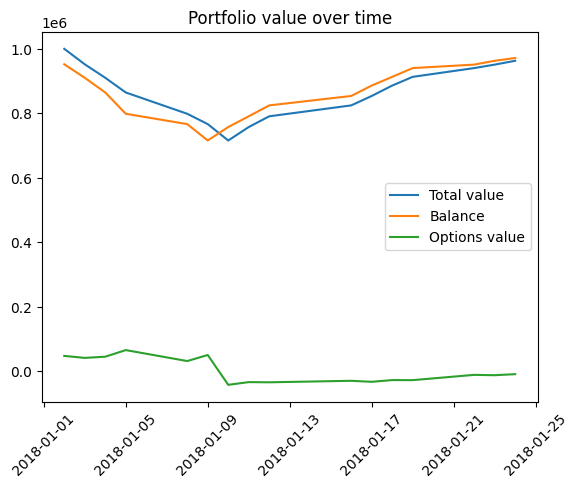

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,-1.62652


wandb: Agent Starting Run: fop1z6nk with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 253173.05499999985
Number of trades 9673
sharpe_ratio 3.742216020692362


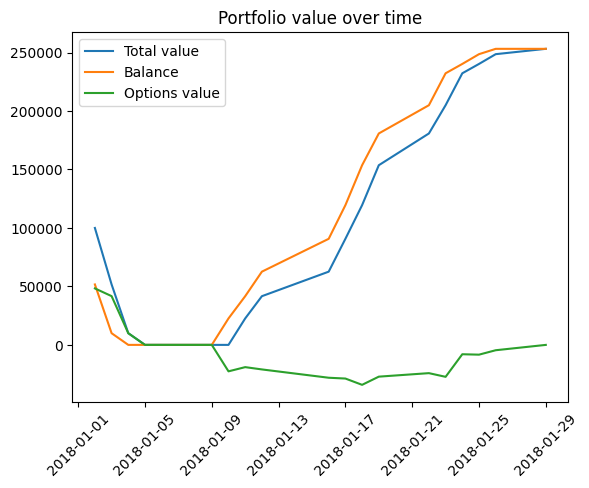

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,3.74222


wandb: Agent Starting Run: hkke6ilo with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 253171.98999999987
Number of trades 8472
sharpe_ratio 3.8696055714461464


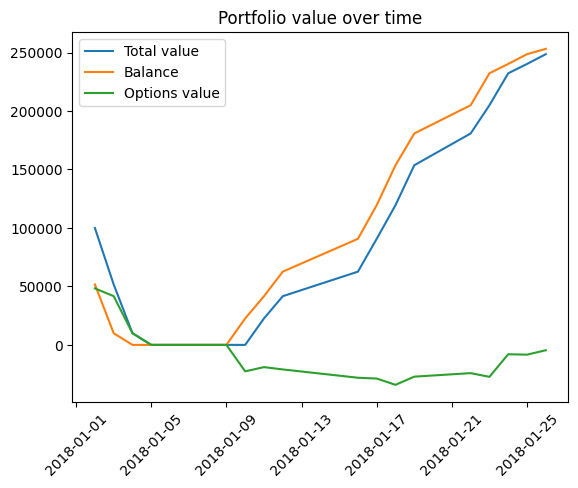

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,3.86961


wandb: Agent Starting Run: nxxo5uu8 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 201292.4750000001
Number of trades 7552
sharpe_ratio 3.8602614551634793


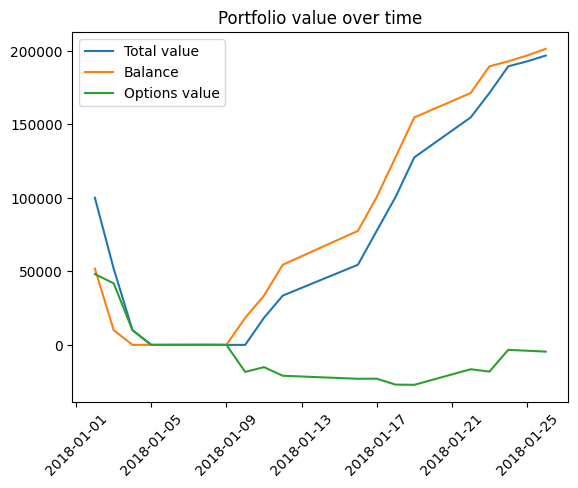

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,3.86026


wandb: Agent Starting Run: x7xwvhad with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 152898.02999999997
Number of trades 6706
sharpe_ratio 4.099916536067655


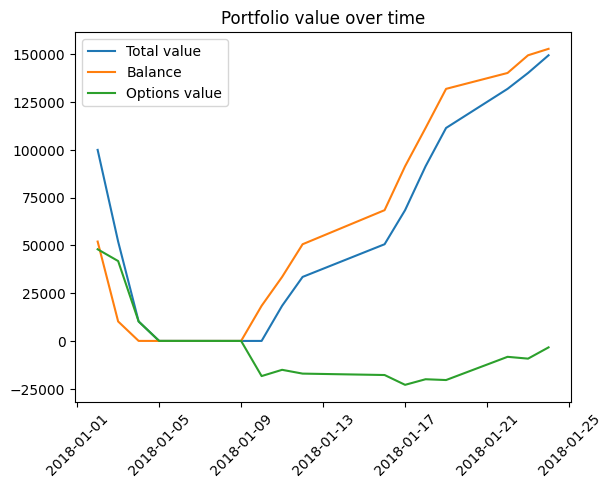

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,4.09992


wandb: Agent Starting Run: p7f3tf0e with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 964461.3999999966
Number of trades 9673
sharpe_ratio -1.719641427811854


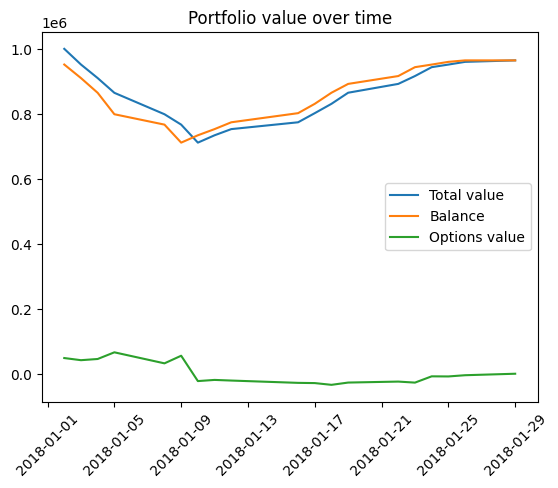

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-1.71964


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 4zuv0q0c with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 964461.3999999966
Number of trades 8472
sharpe_ratio -1.8017063710334271


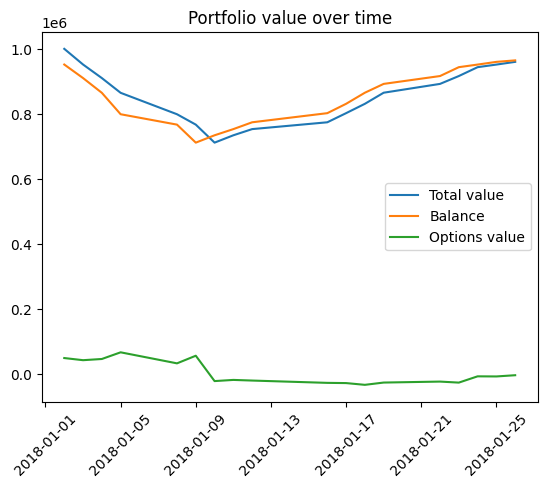

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-1.80171


wandb: Agent Starting Run: gf83qmr1 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 914253.204999995
Number of trades 7552
sharpe_ratio -3.2265184902820105


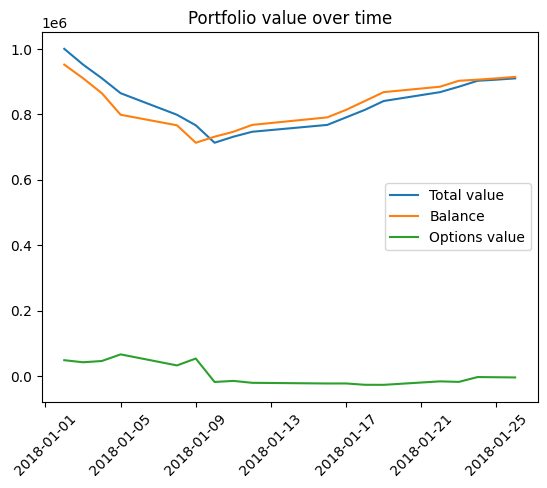

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-3.22652


wandb: Agent Starting Run: tamc5a1n with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 868718.1499999978
Number of trades 6706
sharpe_ratio -4.881623225879348


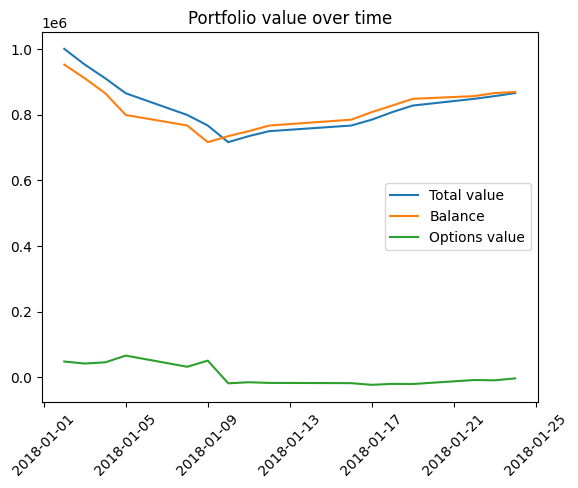

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-4.88162


wandb: Agent Starting Run: ghtfa4gx with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 121904.98500000003
Number of trades 8692
sharpe_ratio 4.471317513939671


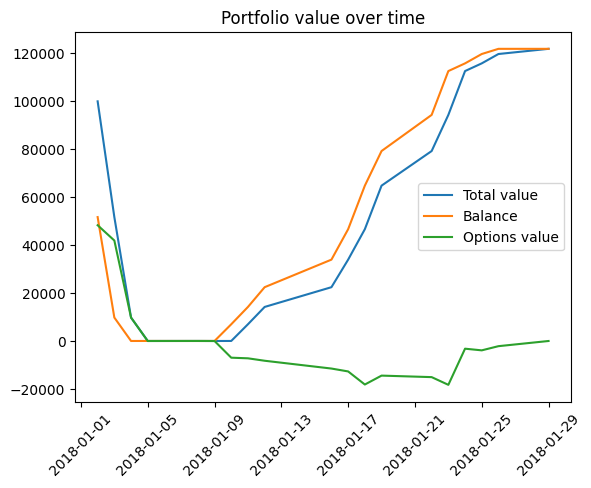

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,4.47132


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 41vco1pv with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 121939.17500000012
Number of trades 7684
sharpe_ratio 4.204931290879308


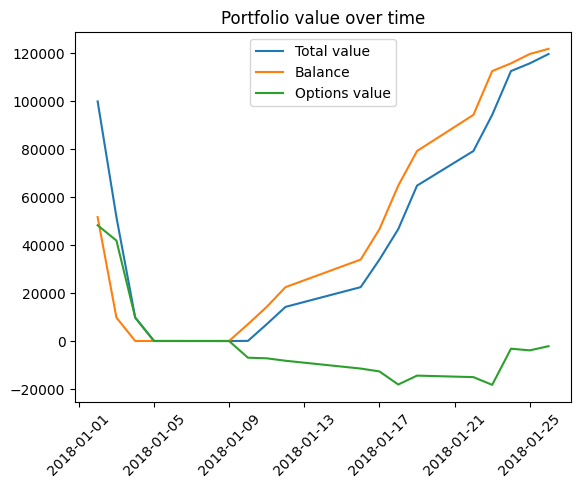

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,4.20493


wandb: Agent Starting Run: 6za9cdbu with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 95281.7600000002
Number of trades 6914
sharpe_ratio 3.8820293594934006


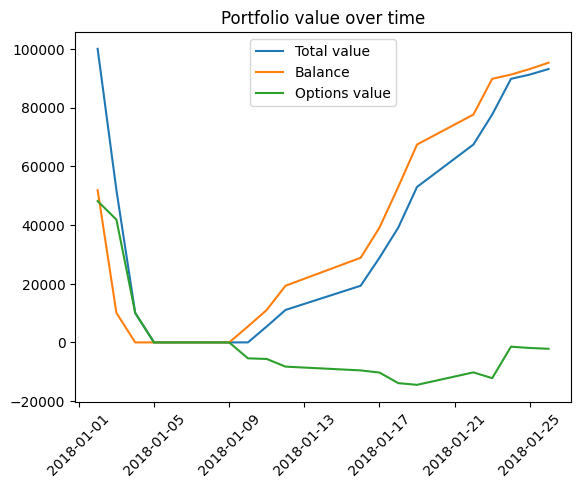

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,3.88203


wandb: Agent Starting Run: gbn56mcy with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 69410.16499999996
Number of trades 6185
sharpe_ratio 4.129965989550079


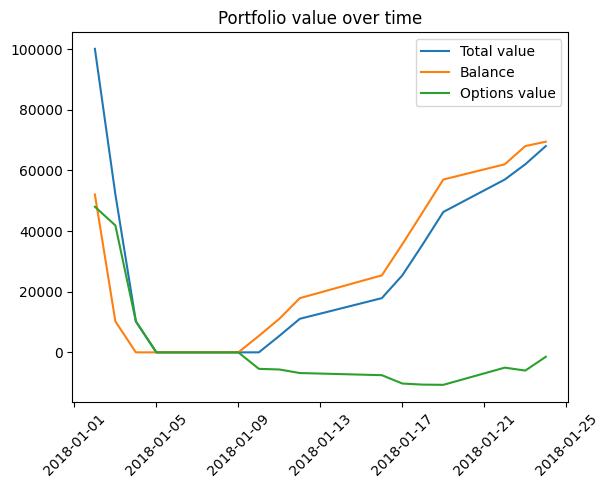

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,4.12997


wandb: Agent Starting Run: vrydju0n with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 831527.7249999994
Number of trades 8692
sharpe_ratio -5.8590304741999155


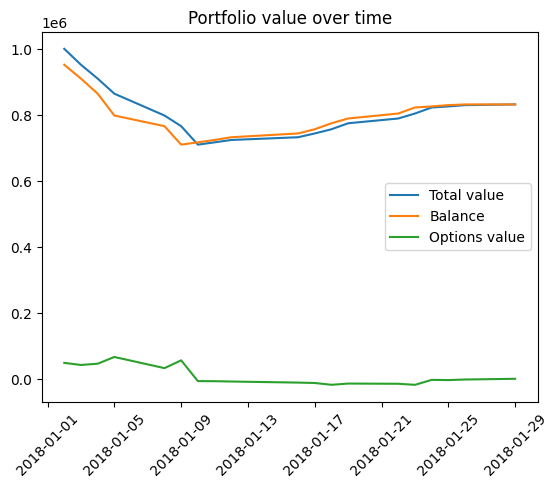

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-5.85903


wandb: Agent Starting Run: f2w3b486 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 831527.7249999994
Number of trades 7684
sharpe_ratio -6.02612800752022


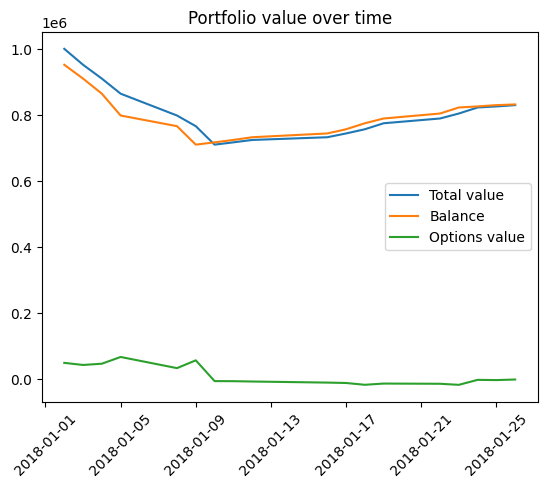

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-6.02613


wandb: Agent Starting Run: bst96u7l with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 807792.3599999973
Number of trades 6914
sharpe_ratio -7.1929275355977795


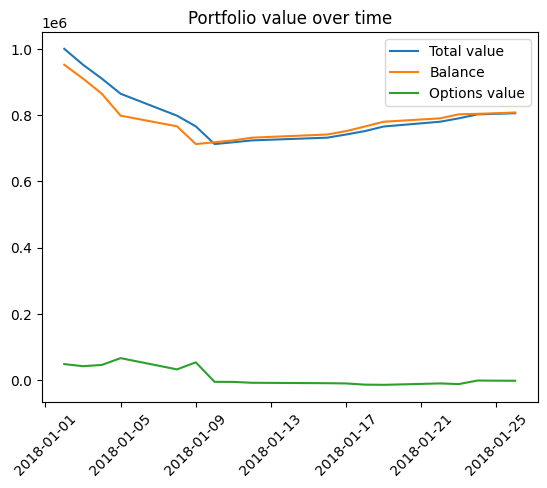

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-7.19293


wandb: Agent Starting Run: 331f15b3 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 785209.3299999989
Number of trades 6185
sharpe_ratio -8.874290203059678


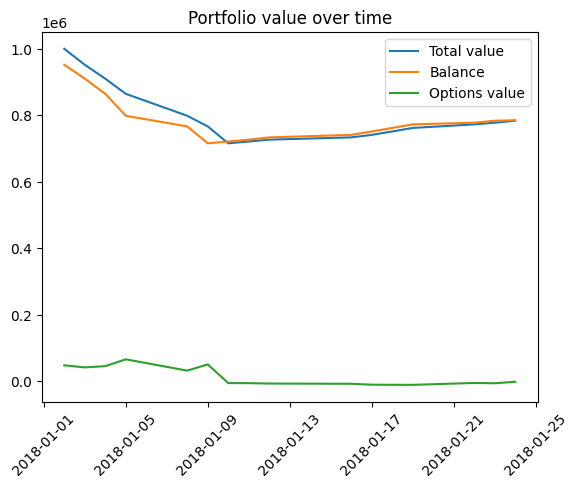

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-8.87429


wandb: Agent Starting Run: tb2kcrbq with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 68680.21500000017
Number of trades 8147
sharpe_ratio 3.7488082846733195


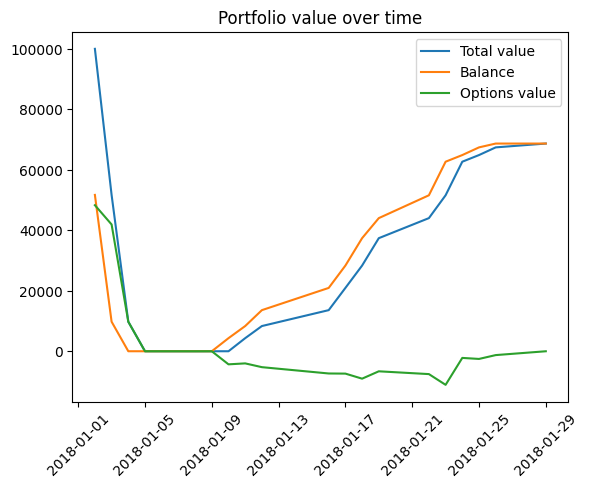

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,3.74881


wandb: Agent Starting Run: b7u0fqbd with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 68685.75500000022
Number of trades 7282
sharpe_ratio 3.866178164497185


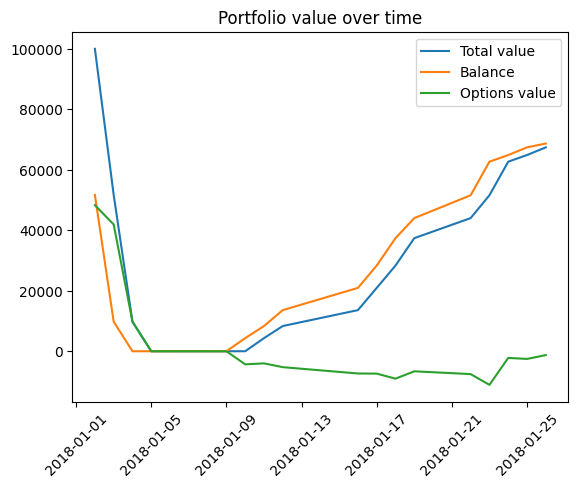

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,3.86618


wandb: Agent Starting Run: 1usxib1d with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 53208.300000000185
Number of trades 6587
sharpe_ratio 4.215392965991763


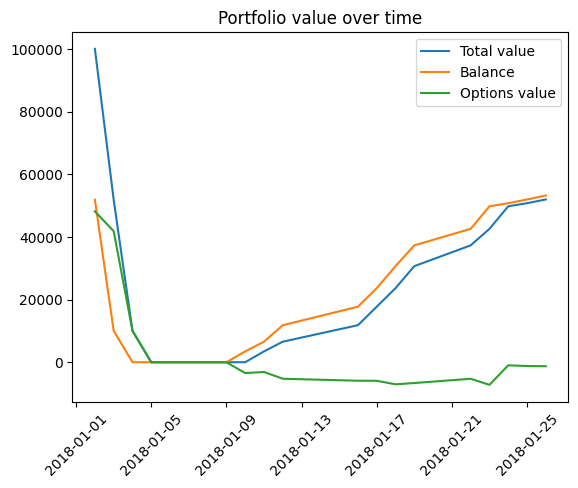

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,4.21539


wandb: Agent Starting Run: wgexx90k with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 39170.850000000144
Number of trades 5933
sharpe_ratio 4.098366807041517


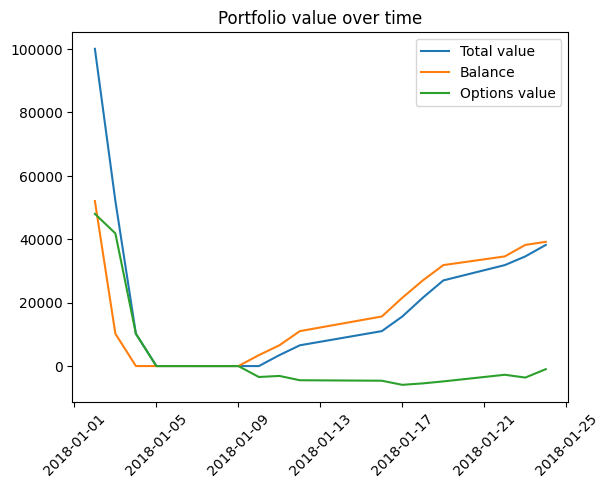

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,4.09837


wandb: Agent Starting Run: vitd8djg with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 777989.23
Number of trades 8147
sharpe_ratio -8.250975842060575


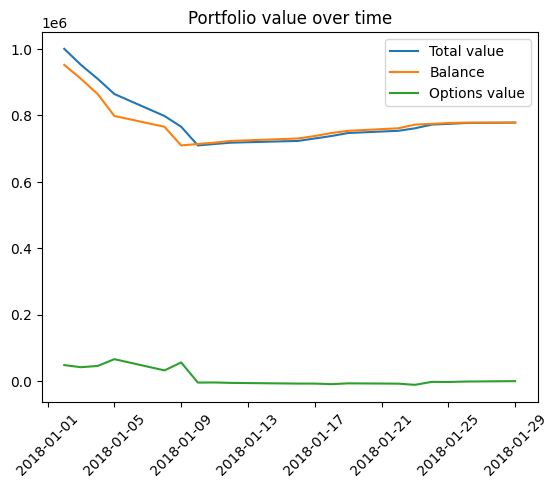

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-8.25098


wandb: Agent Starting Run: 07367u38 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 777989.23
Number of trades 7282
sharpe_ratio -8.489645447725035


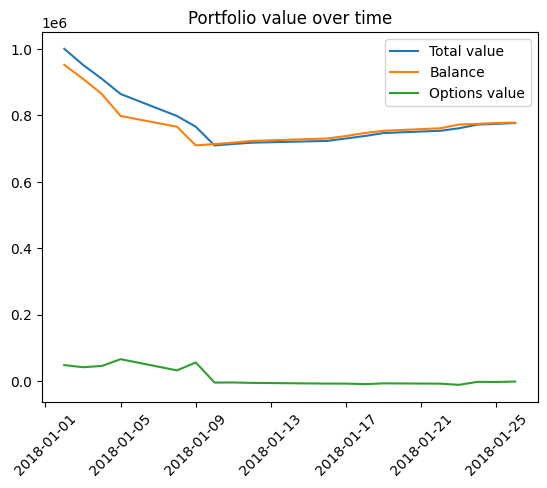

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-8.48965


wandb: Agent Starting Run: k84lda6o with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 765651.7699999987
Number of trades 6587
sharpe_ratio -9.348524617169087


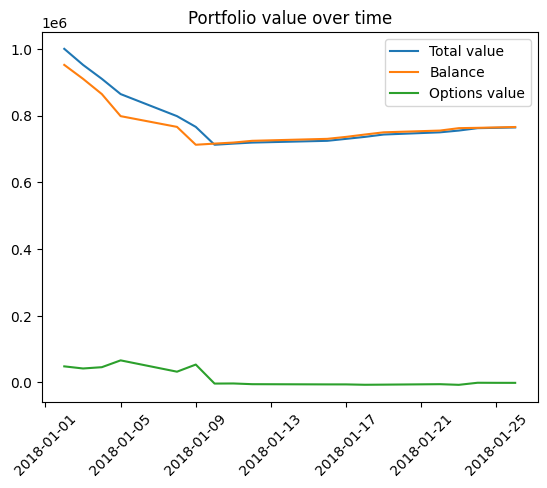

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-9.34852


wandb: Agent Starting Run: flqahfn7 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 754977.2799999991
Number of trades 5933
sharpe_ratio -10.799299177642304


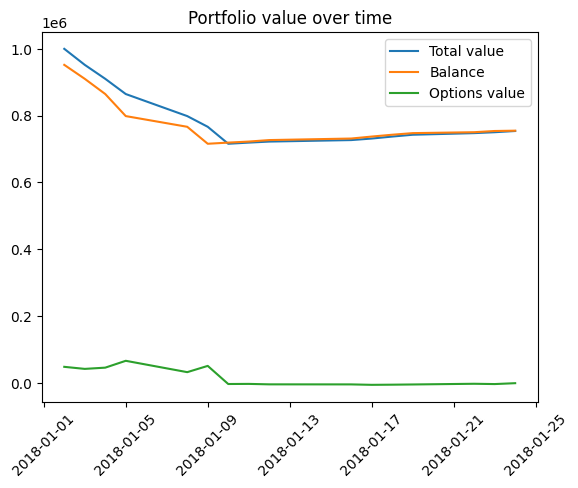

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-10.7993


wandb: Agent Starting Run: 7e3wp1ay with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 34010.31000000013
Number of trades 7556
sharpe_ratio 3.9738028467552207


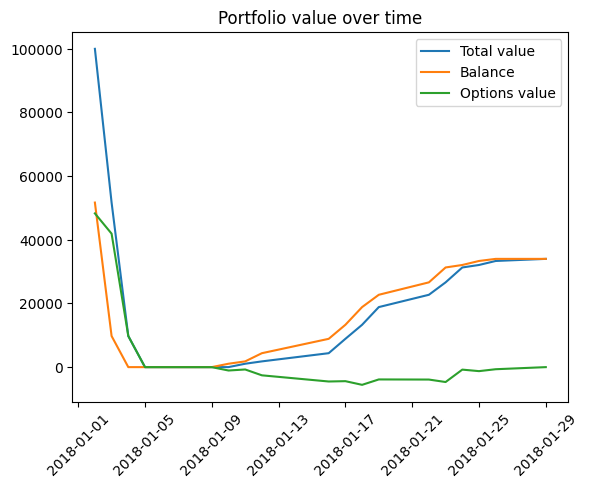

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,3.9738


wandb: Agent Starting Run: zfd8uc76 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 34007.66000000021
Number of trades 6882
sharpe_ratio 3.9171593298349676


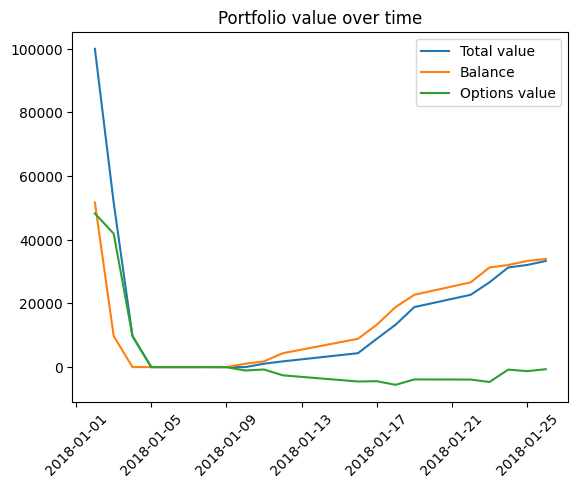

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,3.91716


wandb: Agent Starting Run: p8ga6fzz with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 26134.23500000008
Number of trades 6256
sharpe_ratio 4.406503453744352


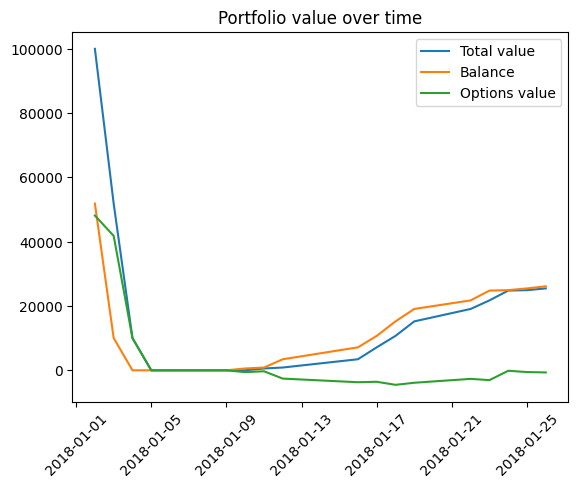

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,4.4065


wandb: Agent Starting Run: nvl6n05j with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 18850.095000000125
Number of trades 5659
sharpe_ratio 5.609532705725898


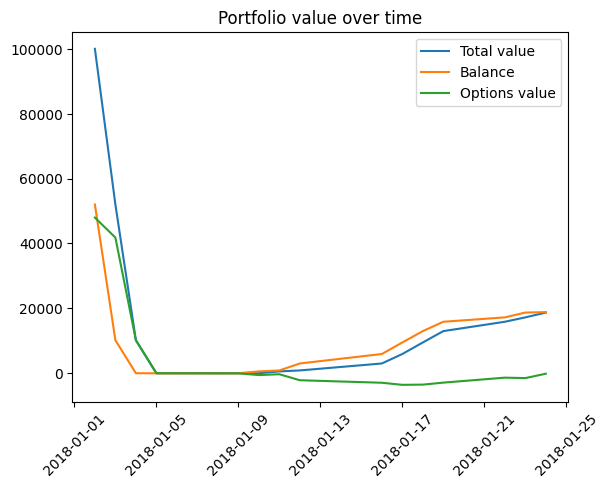

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,5.60953


wandb: Agent Starting Run: es9o76k4 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 743262.639999999
Number of trades 7556
sharpe_ratio -10.109529618267294


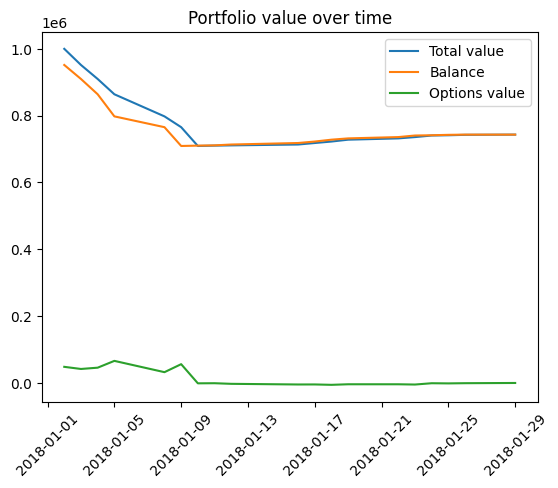

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-10.10953


wandb: Agent Starting Run: zel1md5j with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 743262.639999999
Number of trades 6882
sharpe_ratio -10.417053629042389


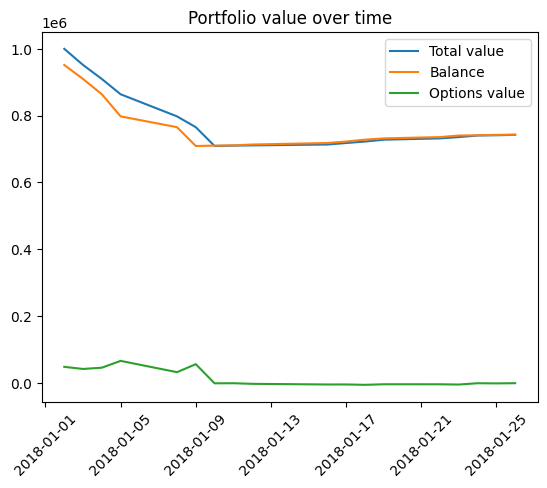

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-10.41705


wandb: Agent Starting Run: pq6coo38 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 738569.9749999976
Number of trades 6256
sharpe_ratio -10.947615373037028


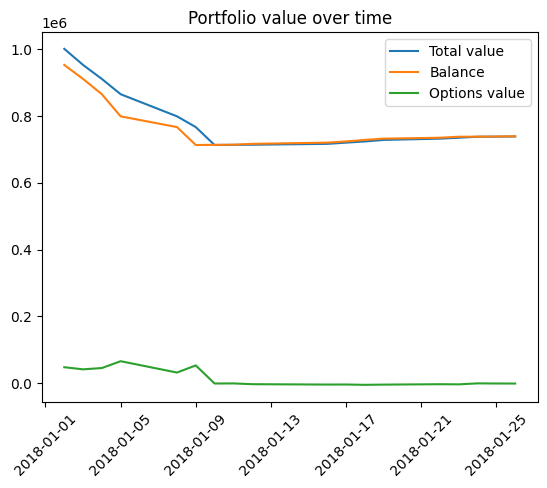

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-10.94762


wandb: Agent Starting Run: qswksobg with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 3
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 734632.7949999986
Number of trades 5659
sharpe_ratio -12.231614444400407


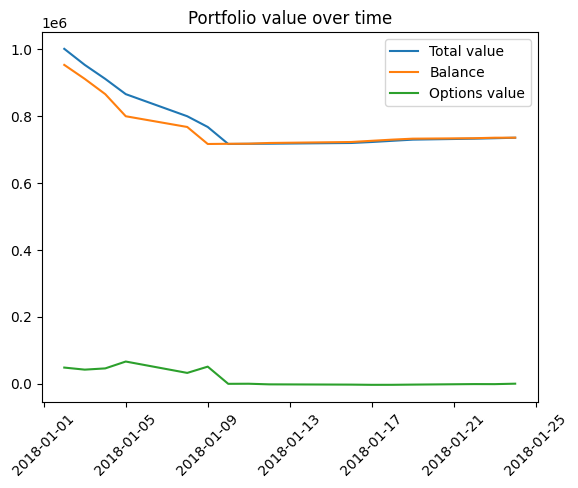

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-12.23161


wandb: Agent Starting Run: 6q9e4ui7 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 403932.1400000004
Number of trades 10474
sharpe_ratio 3.7549942674870533


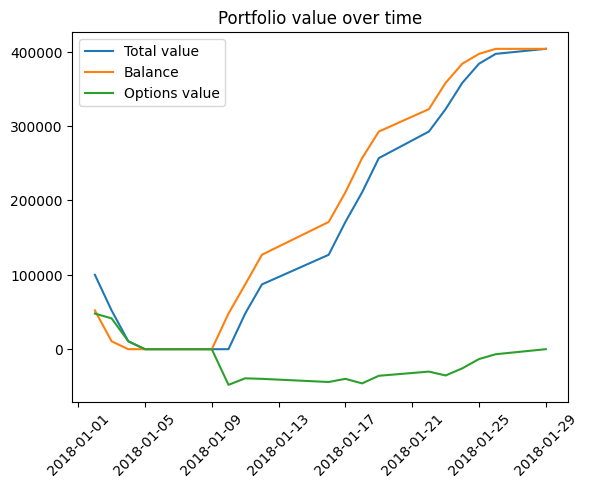

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,3.75499


wandb: Agent Starting Run: r0tffxew with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 403978.69000000047
Number of trades 9150
sharpe_ratio 3.8782868056908577


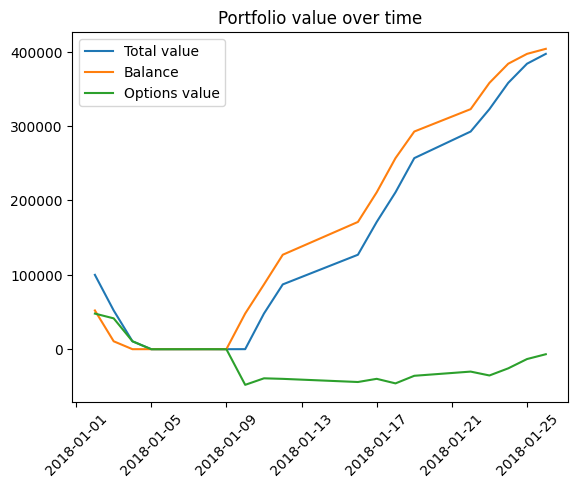

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,3.87829


wandb: Agent Starting Run: djibl8rw with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 320709.1100000003
Number of trades 8111
sharpe_ratio 3.9010801856148474


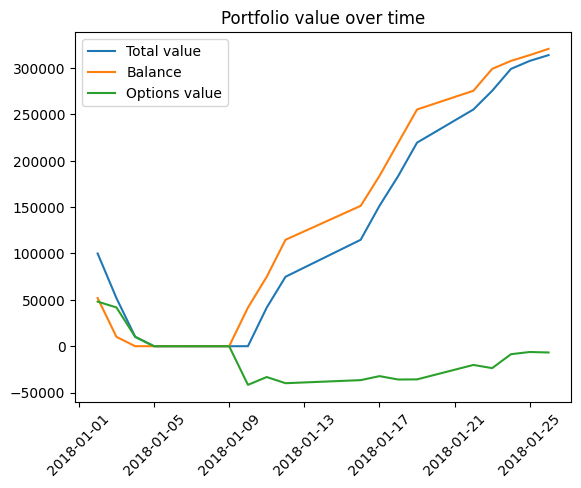

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,3.90108


wandb: Agent Starting Run: ugn1wmly with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 100000
Ending balance 255424.57000000053
Number of trades 7184
sharpe_ratio 4.161141663135182


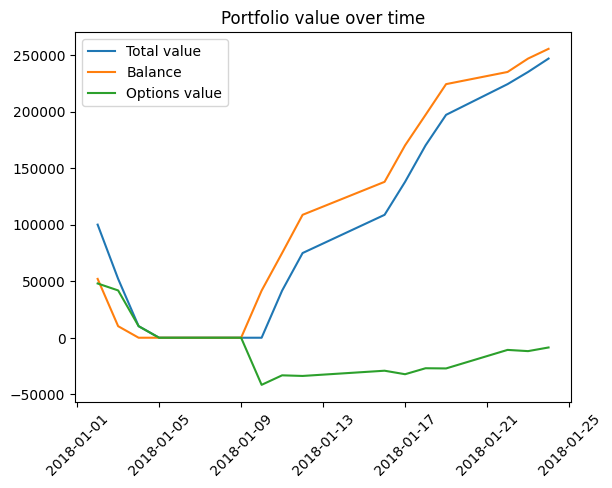

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,4.16114


wandb: Agent Starting Run: 22t3vifm with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 1117285.1199999973
Number of trades 10474
sharpe_ratio 1.3238239258530897


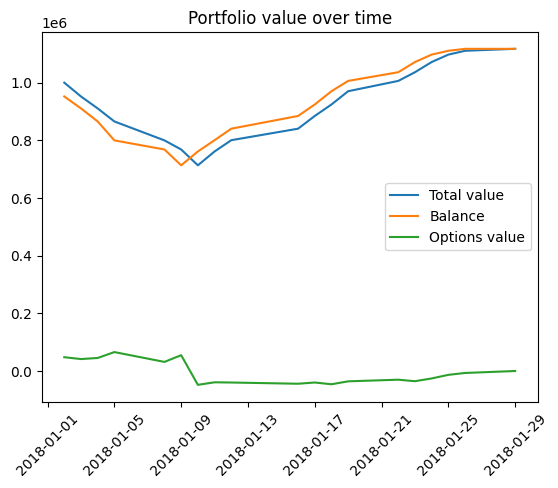

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,1.32382


wandb: Agent Starting Run: dyqizcvs with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 1117285.1199999996
Number of trades 9150
sharpe_ratio 1.3053224203014913


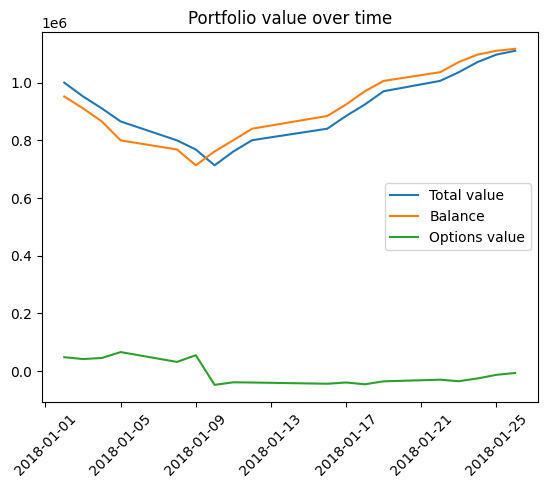

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,1.30532


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: sksty3k1 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 1034510.7699999952
Number of trades 8111
sharpe_ratio -0.22357472988398733


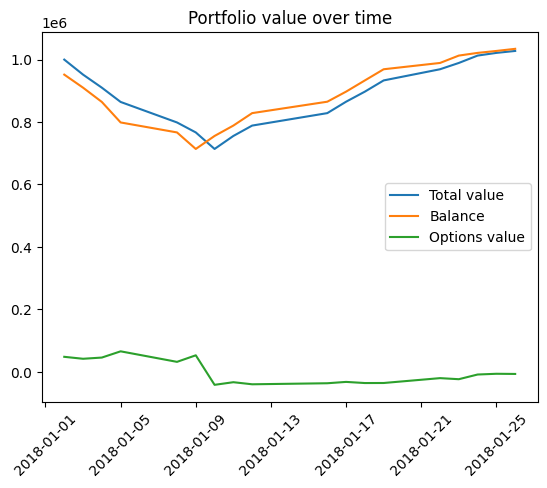

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,-0.22357


wandb: Agent Starting Run: xewe74kz with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.01
starting_balance 1000000
Ending balance 971116.1499999984
Number of trades 7184
sharpe_ratio -1.6365113377153213


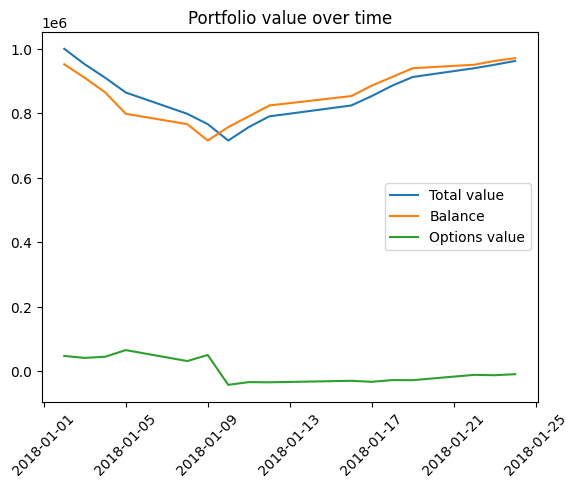

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.01
sharpe_ratio,-1.63651


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: e37ehj69 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 252879.30500000002
Number of trades 9673
sharpe_ratio 3.8463692147910273


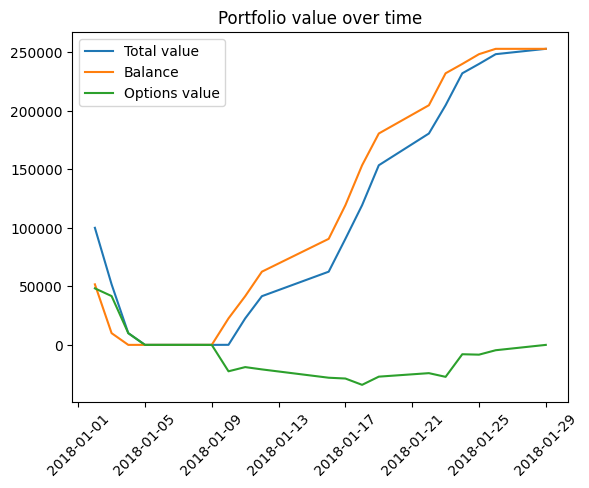

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,3.84637


wandb: Agent Starting Run: qbu9blim with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 252931.6799999999
Number of trades 8472
sharpe_ratio 5.155028052408152


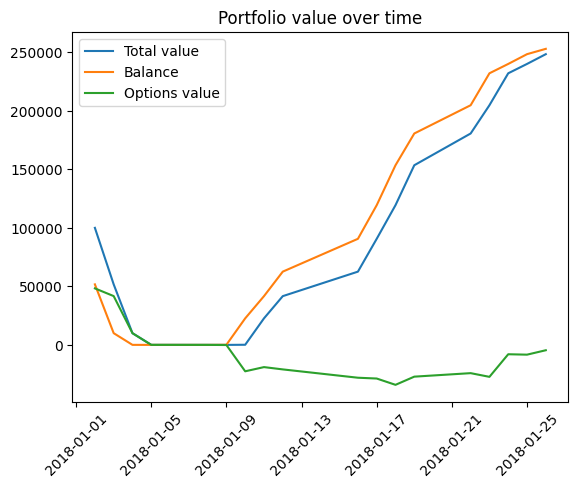

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,5.15503


wandb: Agent Starting Run: 9mlz41s8 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 200969.6600000001
Number of trades 7552
sharpe_ratio 3.8507958862425617


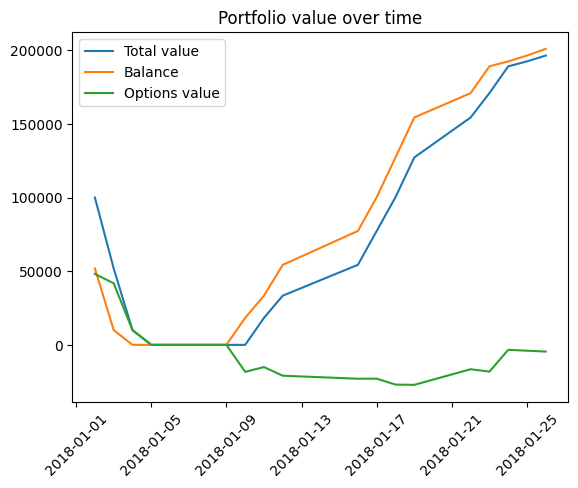

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,3.8508


wandb: Agent Starting Run: 46wdwzfy with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 100000
Ending balance 152619.055
Number of trades 6706
sharpe_ratio 4.89513767107347


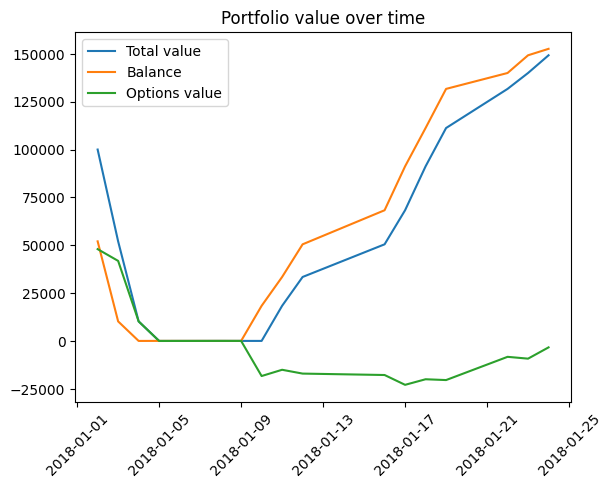

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,4.89514


wandb: Agent Starting Run: hboi302v with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 964002.6299999969
Number of trades 9673
sharpe_ratio -1.7299280099810888


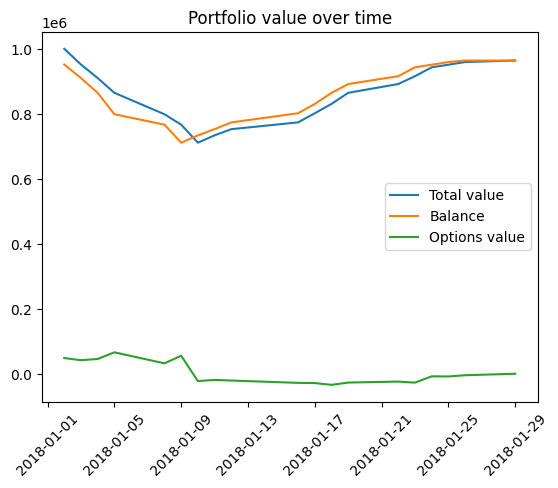

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-1.72993


wandb: Agent Starting Run: lzl0n341 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 964002.6299999969
Number of trades 8472
sharpe_ratio -1.8122333702230848


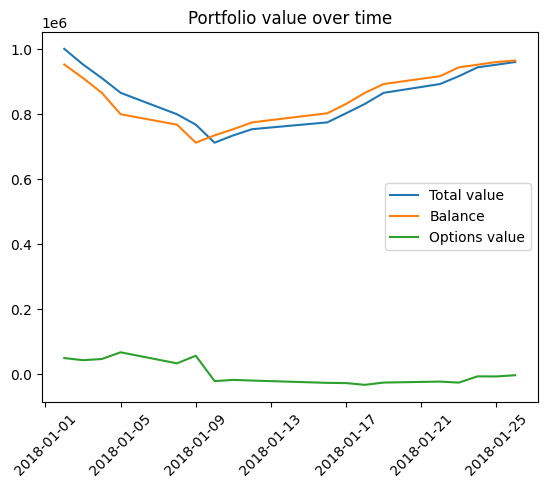

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-1.81223


wandb: Agent Starting Run: mjicc5dp with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 913805.7099999954
Number of trades 7552
sharpe_ratio -3.237934527759784


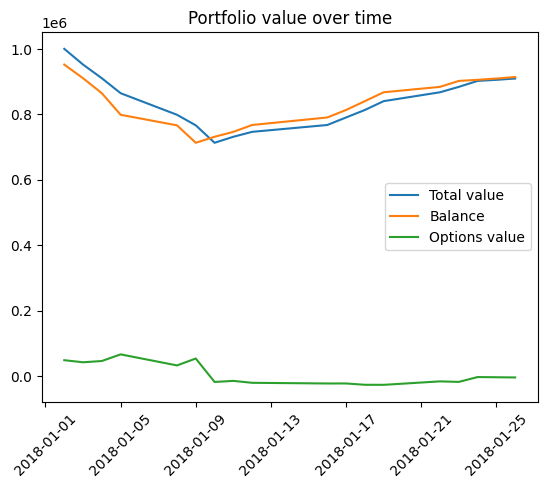

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-3.23793


wandb: Agent Starting Run: 52q6qo7l with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.02
starting_balance 1000000
Ending balance 868288.1999999982
Number of trades 6706
sharpe_ratio -4.8946472477679945


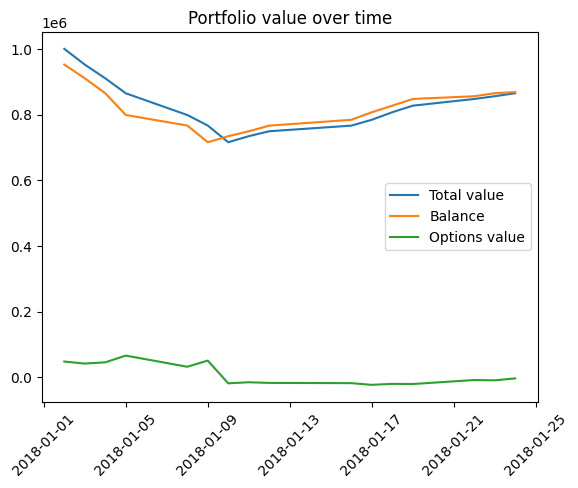

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.02
sharpe_ratio,-4.89465


wandb: Agent Starting Run: qtiys6rz with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 121571.37000000005
Number of trades 8692
sharpe_ratio 3.831115111885575


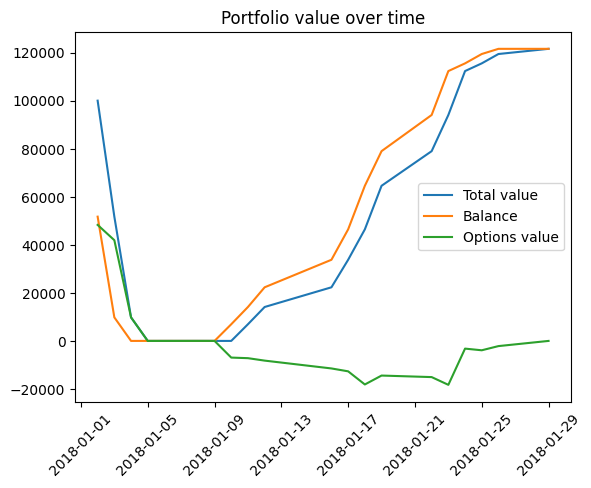

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,3.83112


wandb: Agent Starting Run: xb0mp3eg with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 121549.78499999997
Number of trades 7684
sharpe_ratio 3.8753536180841204


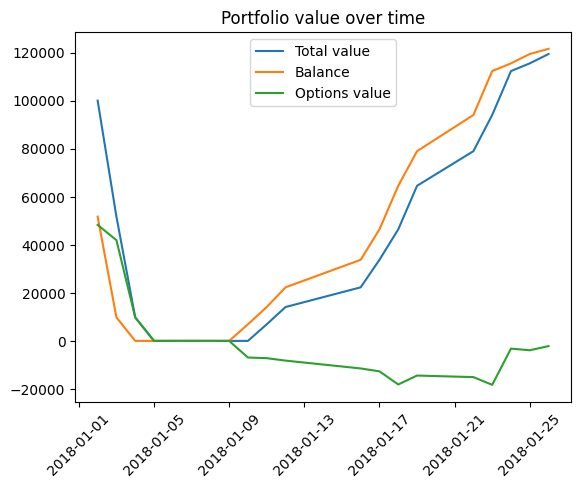

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,3.87535


wandb: Agent Starting Run: be20zmss with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 94967.84000000026
Number of trades 6914
sharpe_ratio 3.932079448724201


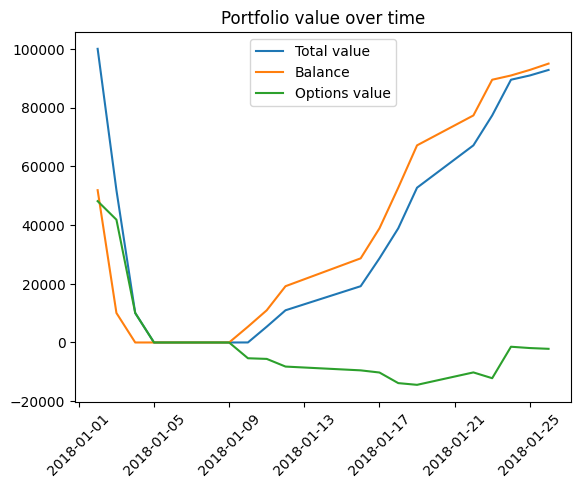

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,3.93208


wandb: Agent Starting Run: celuia5f with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 100000
Ending balance 69131.83500000011
Number of trades 6185
sharpe_ratio 4.151465445477711


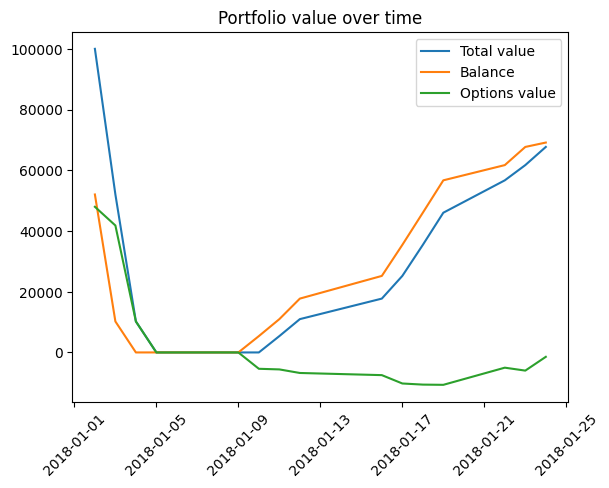

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,4.15147


wandb: Agent Starting Run: gc674ztc with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 831072.5099999997
Number of trades 8692
sharpe_ratio -5.87329644423704


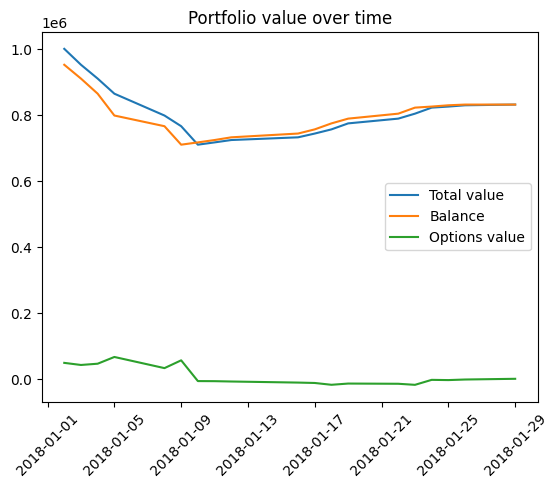

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-5.8733


wandb: Agent Starting Run: 7u42fbmz with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 831072.5099999997
Number of trades 7684
sharpe_ratio -6.040830227068234


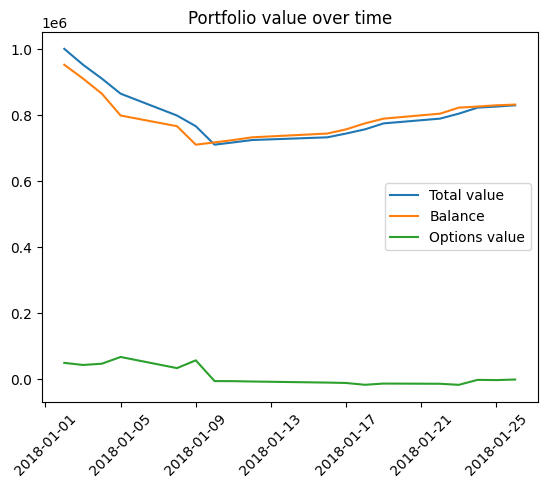

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-6.04083


wandb: Agent Starting Run: nw81jq4n with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 807348.4199999978
Number of trades 6914
sharpe_ratio -7.208073275218596


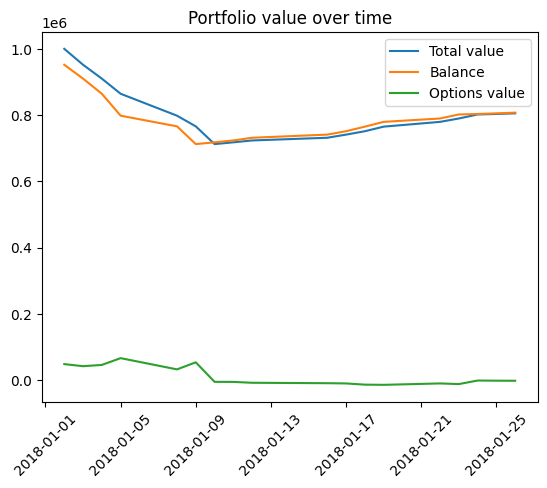

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-7.20807


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 82puaswu with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.04
starting_balance 1000000
Ending balance 784782.9349999994
Number of trades 6185
sharpe_ratio -8.891225831193498


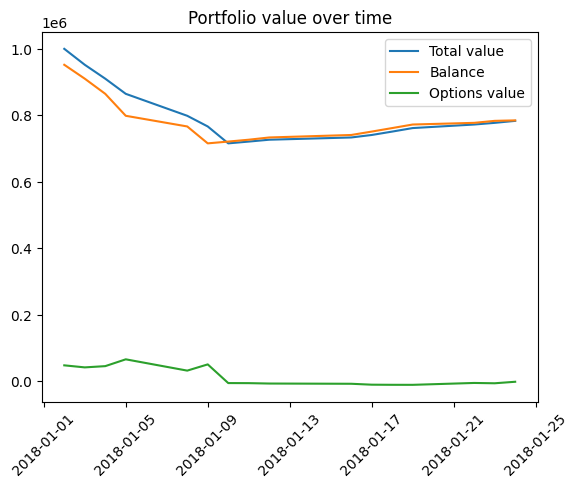

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.04
sharpe_ratio,-8.89123


wandb: Agent Starting Run: gdangkov with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 68329.41500000018
Number of trades 8147
sharpe_ratio 3.7454289450795764


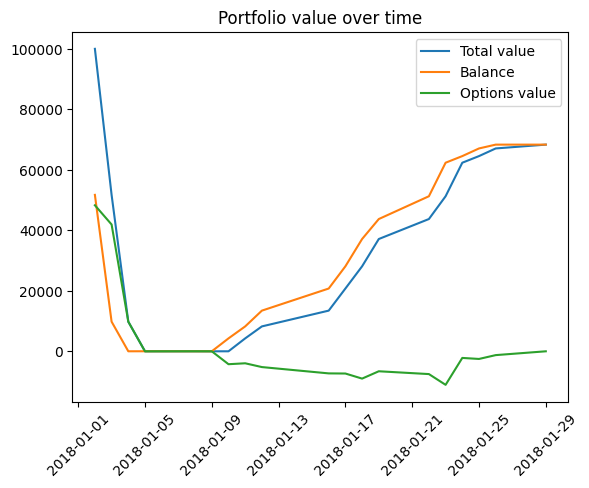

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,3.74543


wandb: Agent Starting Run: mzznm7q2 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 68332.09500000022
Number of trades 7282
sharpe_ratio 3.9146329134067708


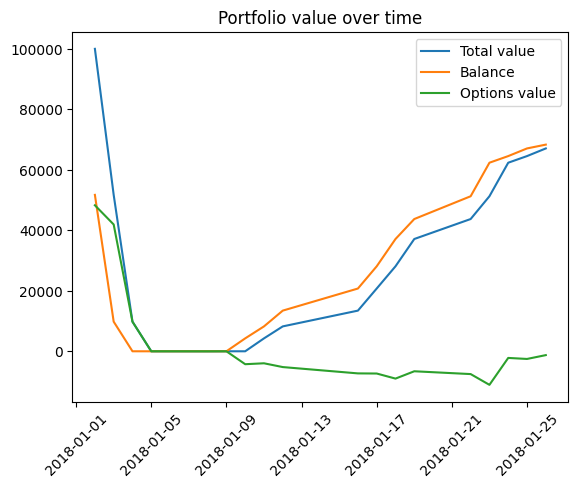

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,3.91463


wandb: Agent Starting Run: yjf1w4bk with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 52886.32000000019
Number of trades 6587
sharpe_ratio 5.51155137843841


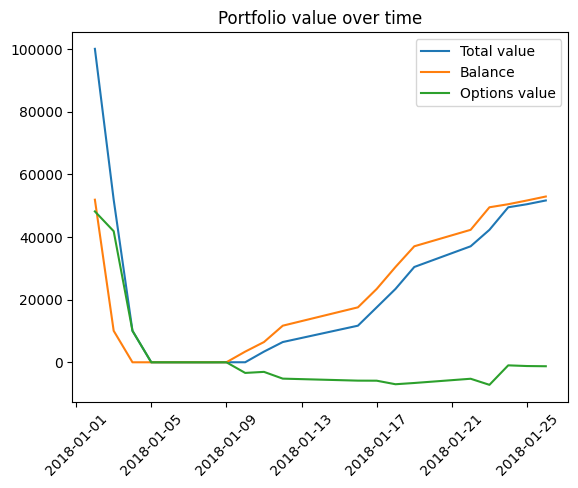

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,5.51155


wandb: Agent Starting Run: 2auullta with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 100000
Ending balance 38902.28000000013
Number of trades 5933
sharpe_ratio 4.153723164488955


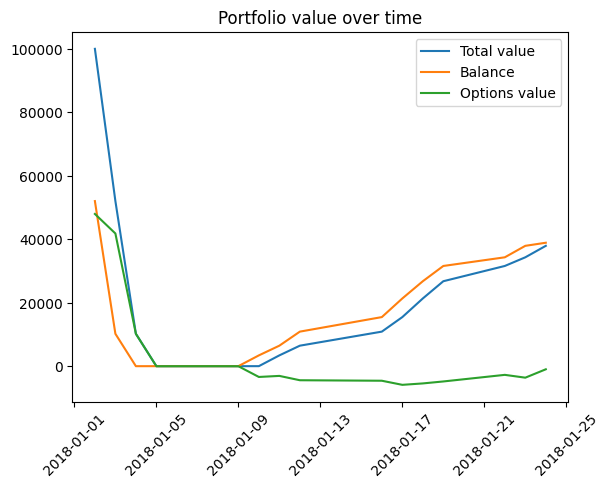

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,4.15372


wandb: Agent Starting Run: a794lcko with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 777534.0150000002
Number of trades 8147
sharpe_ratio -8.268081950658992


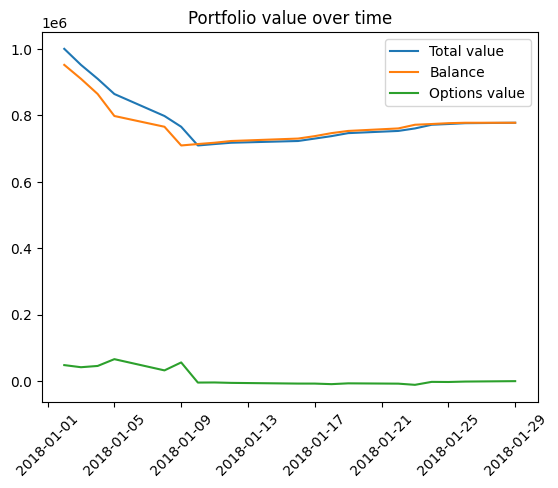

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-8.26808


wandb: Agent Starting Run: d1qe7klm with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 777534.0150000002
Number of trades 7282
sharpe_ratio -8.507418169619376


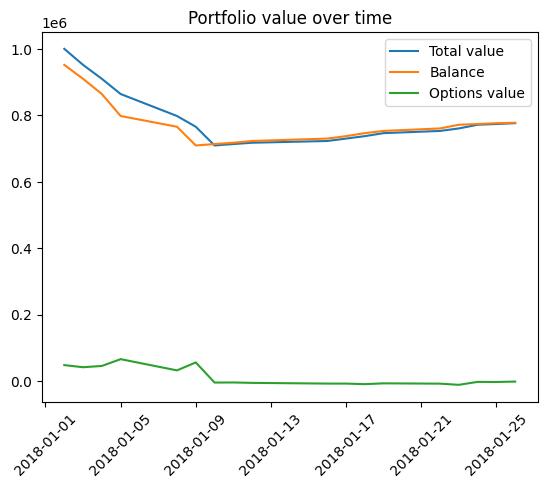

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-8.50742


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: c532vx9z with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 765207.8299999993
Number of trades 6587
sharpe_ratio -9.36614149105658


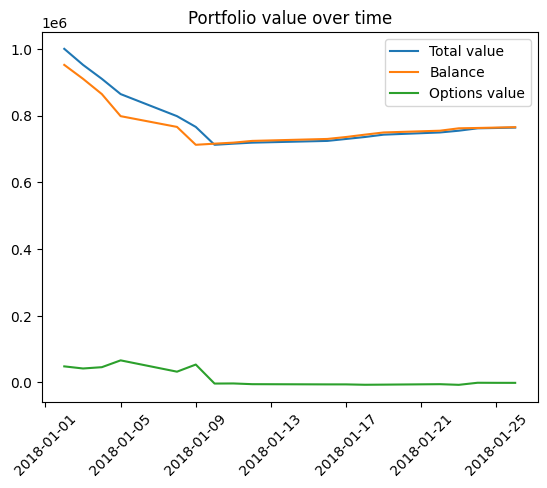

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-9.36614


wandb: Agent Starting Run: 2z1hoxua with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.06
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.06
starting_balance 1000000
Ending balance 754550.8849999995
Number of trades 5933
sharpe_ratio -10.818525702012296


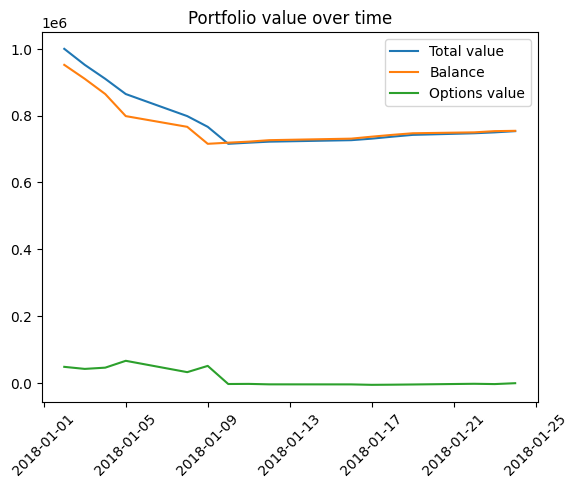

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.06
sharpe_ratio,-10.81853


wandb: Agent Starting Run: okbwkgx0 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 33653.95500000019
Number of trades 7556
sharpe_ratio 3.7422499750461675


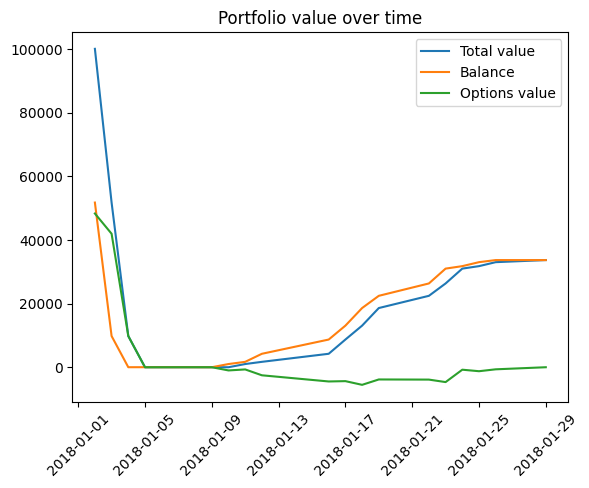

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,3.74225


wandb: Agent Starting Run: jmbt14w2 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 33671.58000000017
Number of trades 6882
sharpe_ratio 4.386028464148913


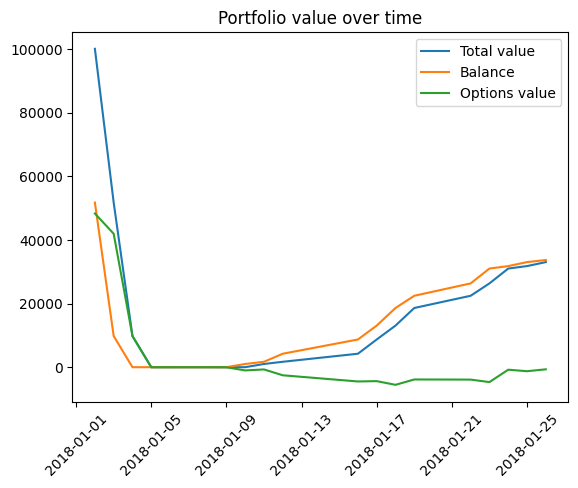

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,4.38603


wandb: Agent Starting Run: 7hv73hqb with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 25832.32500000014
Number of trades 6256
sharpe_ratio 3.880412048607621


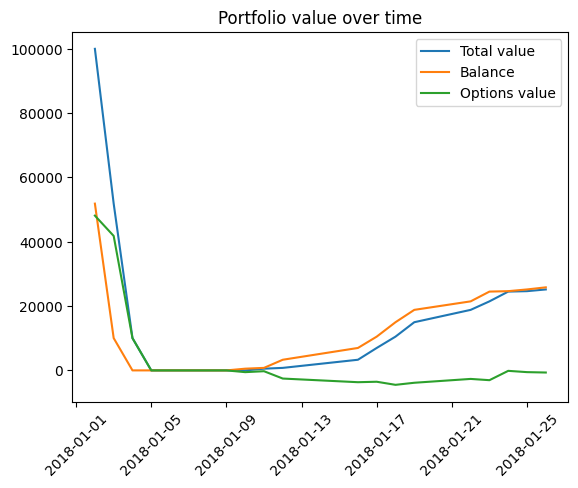

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,3.88041


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 1b2rirg4 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 100000
Ending balance 18557.065000000188
Number of trades 5659
sharpe_ratio 4.336174471563057


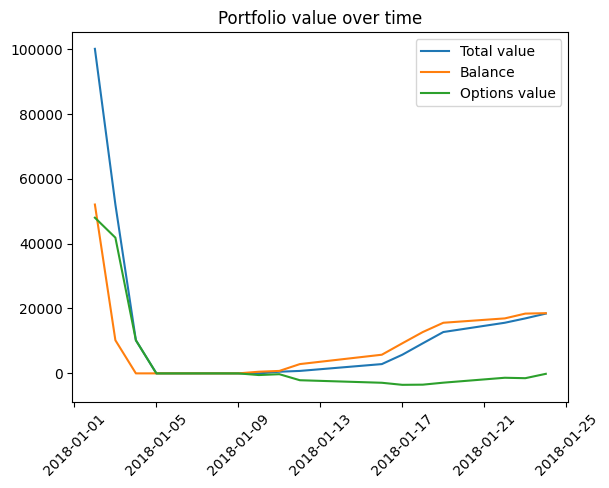

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,4.33617


wandb: Agent Starting Run: 23uptocq with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 742814.5299999992
Number of trades 7556
sharpe_ratio -10.128861830089994


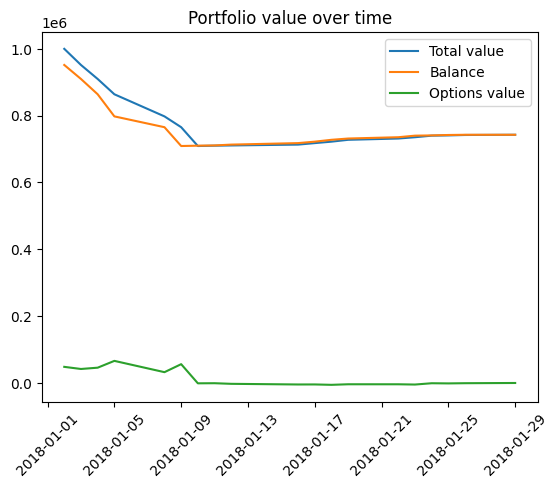

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-10.12886


wandb: Agent Starting Run: 5dxnaa44 with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 742814.5299999992
Number of trades 6882
sharpe_ratio -10.437294719515089


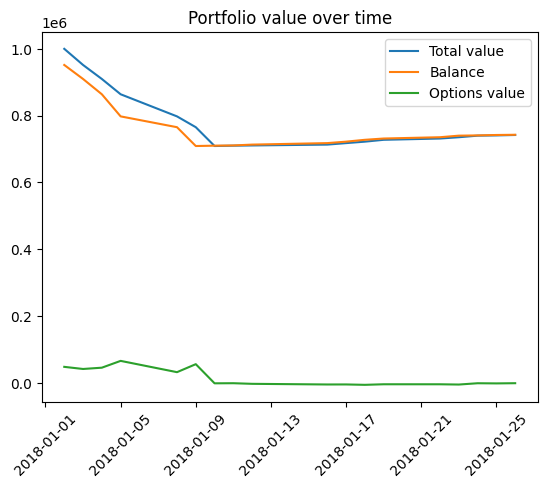

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-10.43729


wandb: Agent Starting Run: ii5p5umu with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 738133.1399999982
Number of trades 6256
sharpe_ratio -10.96699162524358


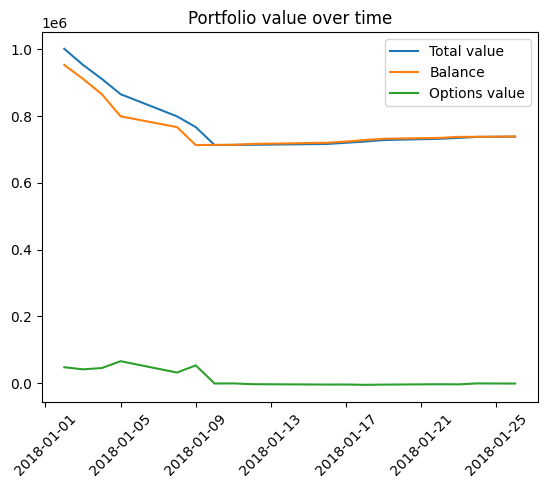

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-10.96699


wandb: Agent Starting Run: ss9jdd4e with config:
wandb: 	buy_threshold: 1.02
wandb: 	price_cap_lower: 5
wandb: 	sell_threshold: 1.1
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.02
sell_threshold 1.1
starting_balance 1000000
Ending balance 734213.5049999991
Number of trades 5659
sharpe_ratio -12.252399102310822


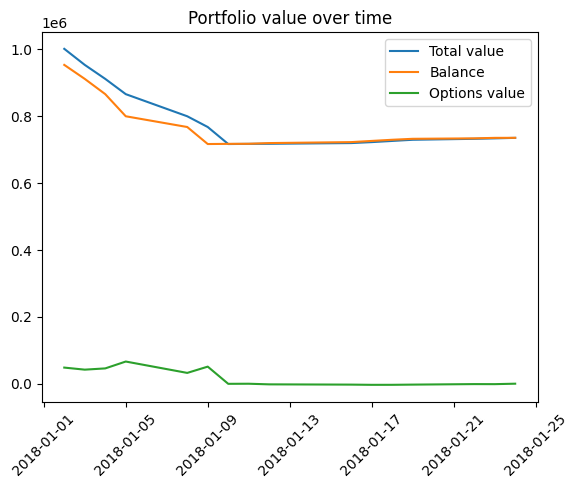

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.02
sell_threshold,1.1
sharpe_ratio,-12.2524


wandb: Agent Starting Run: 1edfdw1w with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.01
starting_balance 100000
Ending balance 474797.9700000035
Number of trades 8840
sharpe_ratio 4.414716189875565


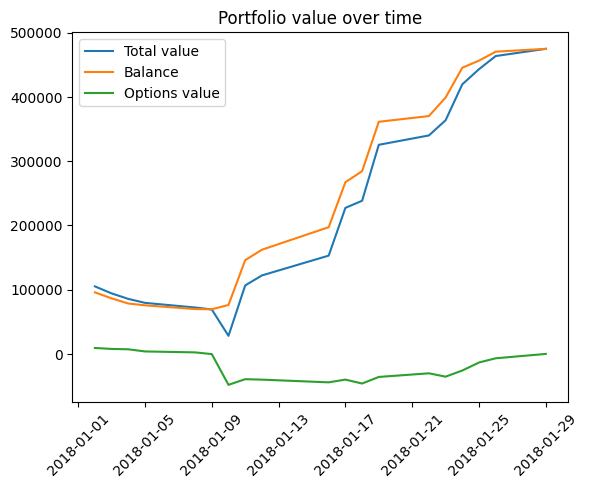

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.01
sharpe_ratio,4.41472


wandb: Agent Starting Run: 6waigq0l with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.01
starting_balance 100000
Ending balance 474664.3700000032
Number of trades 7688
sharpe_ratio 4.757165796062677


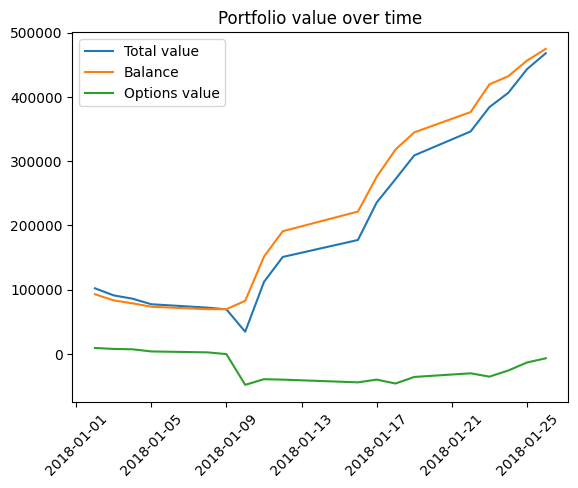

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.01
sharpe_ratio,4.75717


wandb: Agent Starting Run: gvw0kstk with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.01
starting_balance 100000
Ending balance 384530.835000001
Number of trades 6658
sharpe_ratio 6.617477871856994


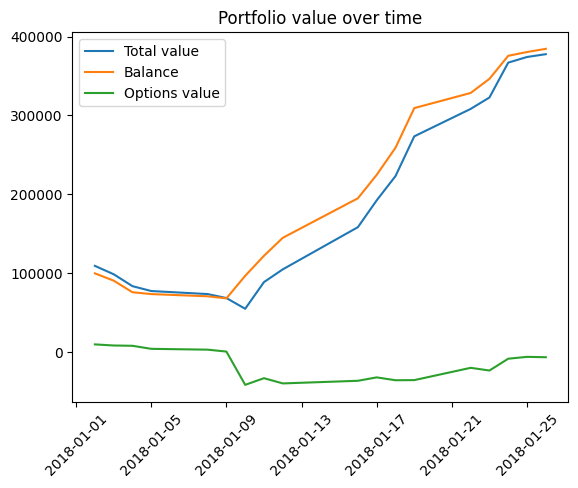

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.01
sharpe_ratio,6.61748


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: lm9u4io9 with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.01
starting_balance 100000
Ending balance 319490.68999999977
Number of trades 5743
sharpe_ratio 4.341152362244229


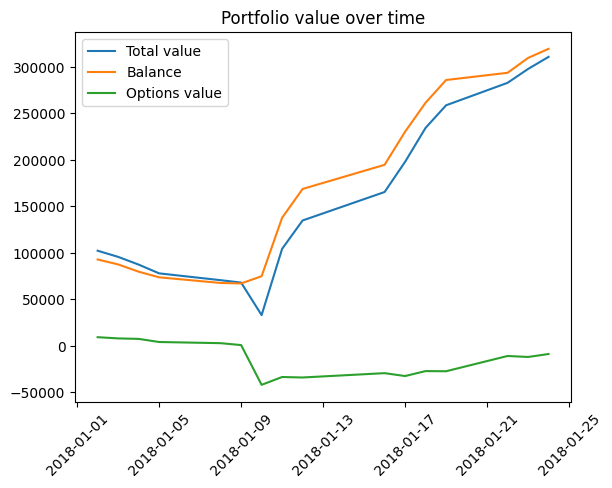

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.01
sharpe_ratio,4.34115


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 729uk7rr with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.01
starting_balance 1000000
Ending balance 1374797.9699999993
Number of trades 8840
sharpe_ratio 9.487360059901768


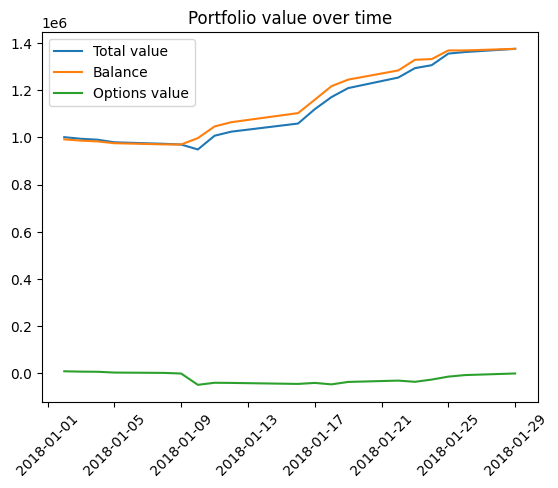

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.01
sharpe_ratio,9.48736


wandb: Agent Starting Run: jx3j3tdm with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.01
starting_balance 1000000
Ending balance 1371170.55
Number of trades 7688
sharpe_ratio 7.828773224195209


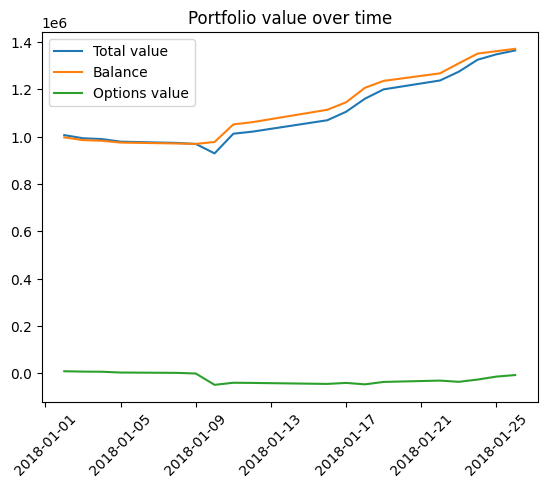

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.01
sharpe_ratio,7.82877


wandb: Agent Starting Run: yn6o7qpp with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.01
starting_balance 1000000
Ending balance 1286312.350000008
Number of trades 6658
sharpe_ratio 6.601679833334239


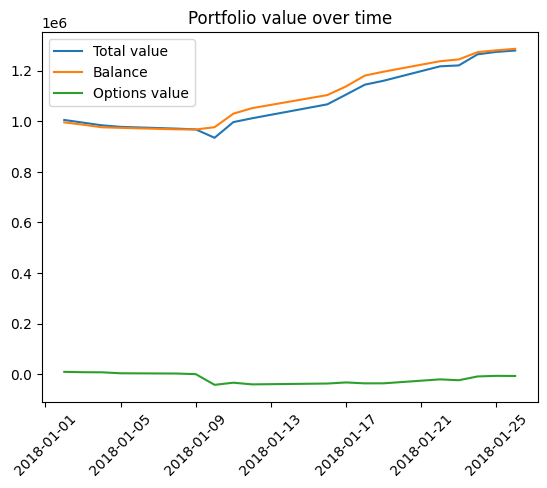

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.01
sharpe_ratio,6.60168


wandb: Agent Starting Run: g8yuop8c with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.01
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.01
starting_balance 1000000
Ending balance 1218625.1550000063
Number of trades 5743
sharpe_ratio 6.609582135243179


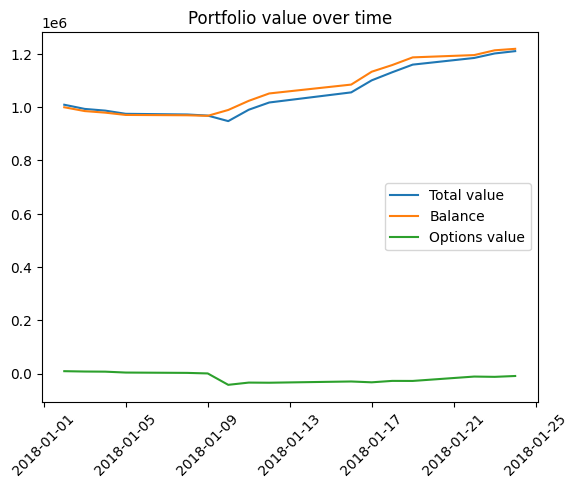

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.01
sharpe_ratio,6.60958


wandb: Agent Starting Run: uycvnqw9 with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.02
starting_balance 100000
Ending balance 321515.4800000004
Number of trades 8039
sharpe_ratio 5.961825467577044


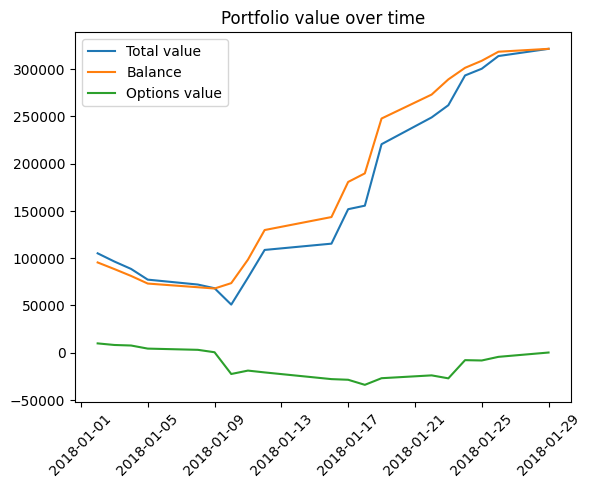

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.02
sharpe_ratio,5.96183


wandb: Agent Starting Run: v1xkchwh with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.02
starting_balance 100000
Ending balance 317019.9699999997
Number of trades 7010
sharpe_ratio 7.209742477220298


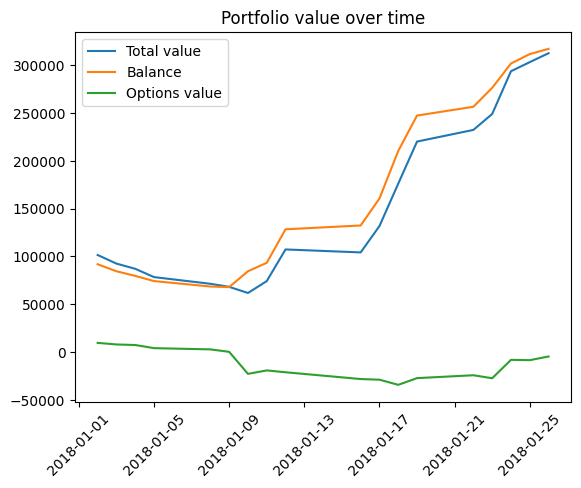

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.02
sharpe_ratio,7.20974


wandb: Agent Starting Run: 3wl531v5 with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.02
starting_balance 100000
Ending balance 264286.69499999867
Number of trades 6099
sharpe_ratio 5.879979901618001


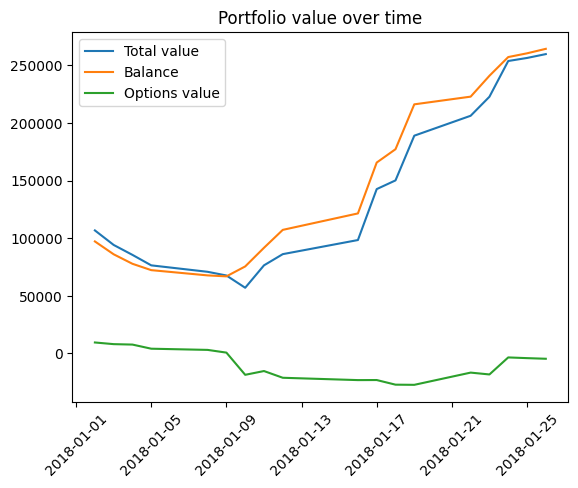

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.02
sharpe_ratio,5.87998


wandb: Agent Starting Run: z08vq7hm with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.02
starting_balance 100000
Ending balance 218616.38999999873
Number of trades 5265
sharpe_ratio 5.354951369016658


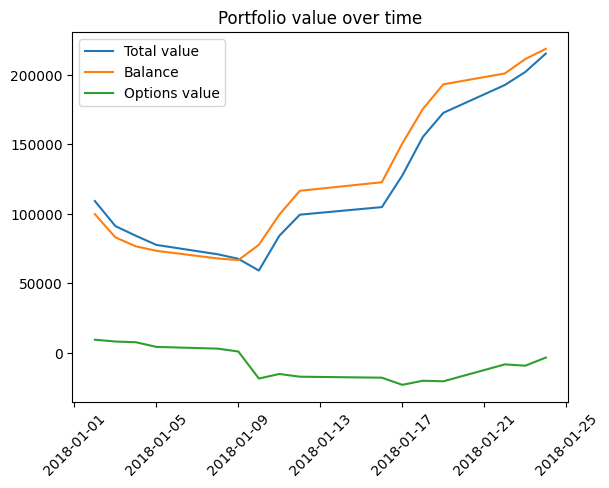

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.02
sharpe_ratio,5.35495


wandb: Agent Starting Run: aflkekcx with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.02
starting_balance 1000000
Ending balance 1221515.480000005
Number of trades 8039
sharpe_ratio 7.319507495783602


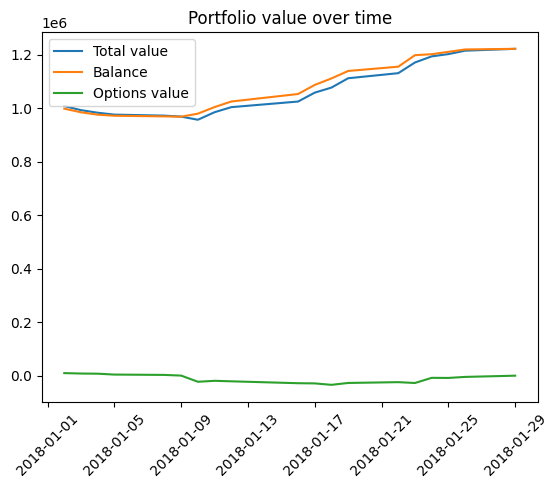

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.02
sharpe_ratio,7.31951


wandb: Agent Starting Run: cnu6qgx0 with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.02
starting_balance 1000000
Ending balance 1216921.135000004
Number of trades 7010
sharpe_ratio 7.545263937539009


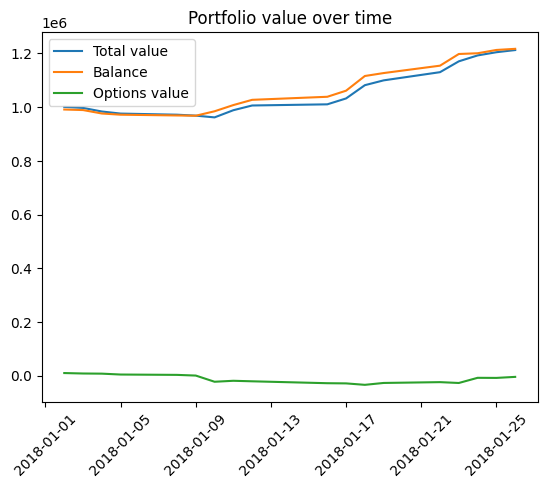

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.02
sharpe_ratio,7.54526


wandb: Agent Starting Run: fwo3rvl6 with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.02
starting_balance 1000000
Ending balance 1167775.3650000116
Number of trades 6099
sharpe_ratio 5.459590737265169


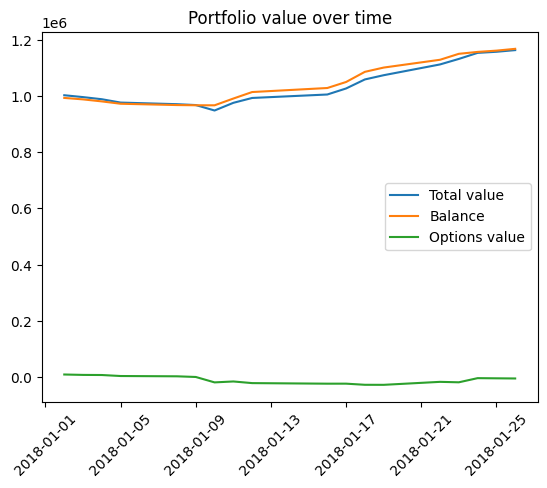

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.02
sharpe_ratio,5.45959


wandb: Agent Starting Run: x352lkqm with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.02
wandb: 	starting_balance: 1000000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.02
starting_balance 1000000
Ending balance 1118620.9100000109
Number of trades 5265
sharpe_ratio 3.587881253338819


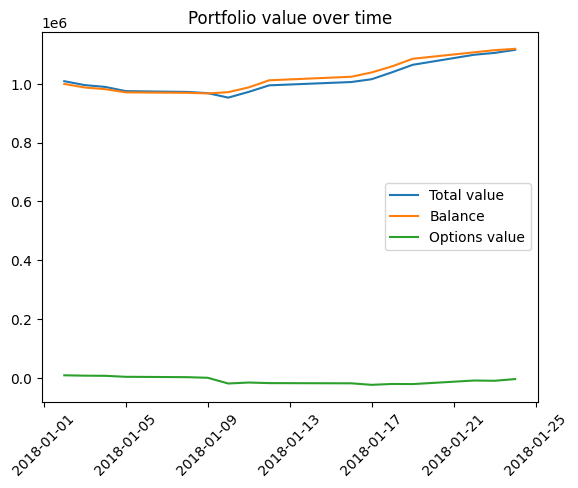

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.02
sharpe_ratio,3.58788


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: yz5efyaa with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.04
starting_balance 100000
Ending balance 188581.8049999965
Number of trades 7058
sharpe_ratio 5.604116453950603


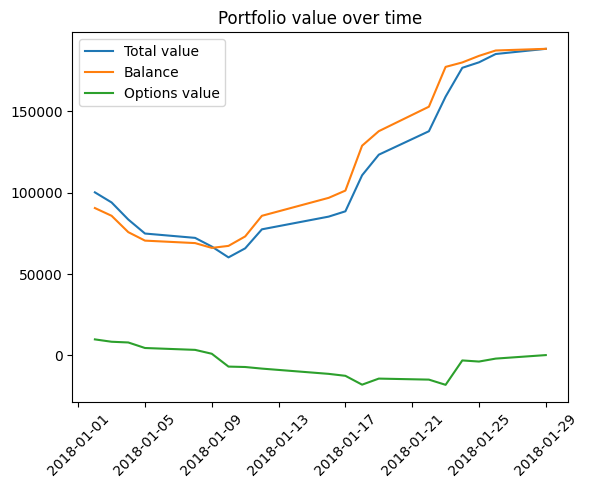

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.04
sharpe_ratio,5.60412


wandb: Agent Starting Run: 7w53jm16 with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.04
starting_balance 100000
Ending balance 186833.01499999664
Number of trades 6222
sharpe_ratio 4.9252929683218465


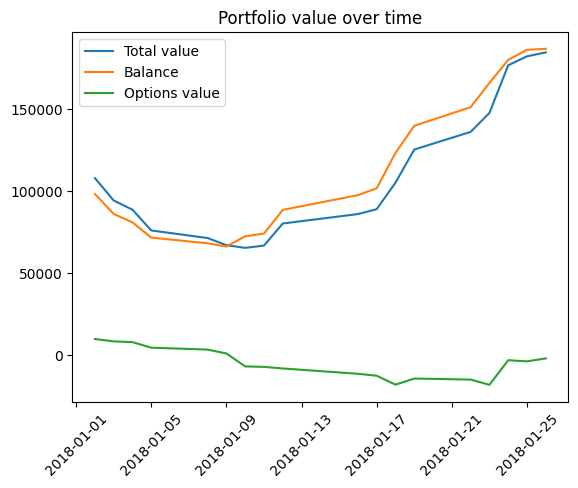

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.04
sharpe_ratio,4.92529


wandb: Agent Starting Run: zljr2i0r with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


buy_threshold 1.04
sell_threshold 1.04
starting_balance 100000
Ending balance 161245.4899999982
Number of trades 5461
sharpe_ratio 4.638418460147266


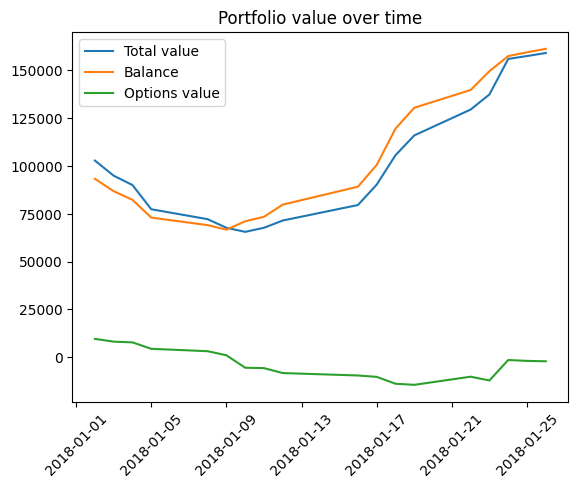

buy_threshold,▁
sell_threshold,▁
sharpe_ratio,▁
buy_threshold,1.04
sell_threshold,1.04
sharpe_ratio,4.63842


wandb: Agent Starting Run: sk3jyc0m with config:
wandb: 	buy_threshold: 1.04
wandb: 	price_cap_lower: 0
wandb: 	sell_threshold: 1.04
wandb: 	starting_balance: 100000
wandb: 	ttm_cap_lower: 5
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


In [54]:
if run_optimizing:
    def find_best_thresholds(df = df):
        run = wandb.init(project = "options-trading")
        df = df.copy()
        buy_signal, sell_signal = generate_buy_sell_signals(df, run.config.buy_threshold, run.config.sell_threshold)
        df = trader(df, buy_signal, sell_signal, run.config.starting_balance, price_cap_lower = run.config.price_cap_lower, ttm_cap_lower = run.config.ttm_cap_lower)
        df = calculate_options_value(df)
        run.log({"buy_threshold": run.config.buy_threshold, "sell_threshold": run.config.sell_threshold, "sharpe_ratio": sharpe_ratio(df), "starting_balance": run.config.starting_balance, "ending_balance": df['Balance'].iloc[-1], "number_of_trades": df['Signal'].abs().sum()})
        # Wandb callback
        print("buy_threshold", run.config.buy_threshold)
        print("sell_threshold", run.config.sell_threshold)
        print("starting_balance", run.config.starting_balance)
        print("Ending balance", df['Balance'].iloc[-1])
        print("Number of trades", df['Signal'].abs().sum())
        print("sharpe_ratio", sharpe_ratio(df))
        plot(df)
        run.finish()

    wandb.agent(sweep_id=sweep_id, function=find_best_thresholds, project='options-trading', count = 1000)